# Package Check

In [ ]:
print(installed.packages())

              Package         LibPath                         Version   
IRdisplay     "IRdisplay"     "/usr/local/lib/R/site-library" "1.1"     
IRkernel      "IRkernel"      "/usr/local/lib/R/site-library" "1.3.2"   
pbdZMQ        "pbdZMQ"        "/usr/local/lib/R/site-library" "0.3-9"   
repr          "repr"          "/usr/local/lib/R/site-library" "1.1.6"   
askpass       "askpass"       "/usr/lib/R/site-library"       "1.1"     
backports     "backports"     "/usr/lib/R/site-library"       "1.4.1"   
base64enc     "base64enc"     "/usr/lib/R/site-library"       "0.1-3"   
bit           "bit"           "/usr/lib/R/site-library"       "4.0.4"   
bit64         "bit64"         "/usr/lib/R/site-library"       "4.0.5"   
blob          "blob"          "/usr/lib/R/site-library"       "1.2.4"   
brew          "brew"          "/usr/lib/R/site-library"       "1.0-8"   
brio          "brio"          "/usr/lib/R/site-library"       "1.1.3"   
broom         "broom"         "/usr/lib/R/site-libr

# Package Installation

In [ ]:
devtools::install_github("kjhealy/socviz")


── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/Rtmpvozl8B/remotes9779813e33/kjhealy-socviz-eca8021/DESCRIPTION’ ... OK
* preparing ‘socviz’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘socviz_1.2.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
# devtools::install_github("hrbrmstr/hrbrthemes")

#Geoms Can Transform Data

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.3.0     ✔ stringr 1.4.1
✔ readr   2.1.4     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



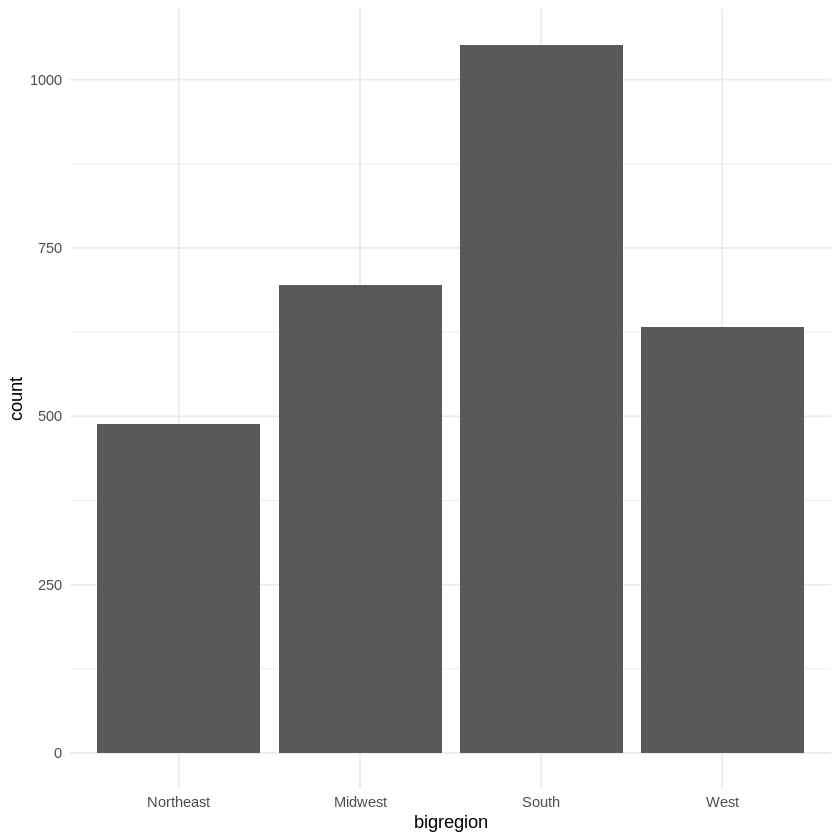

In [ ]:
library(tidyverse)
library(socviz)

# The bar chart produced gives us a count of the number of (individual) observations in the data set by region of the United States.
p <- ggplot(data = gss_sm, mapping = aes(x = bigregion))
p + geom_bar() + theme_minimal()

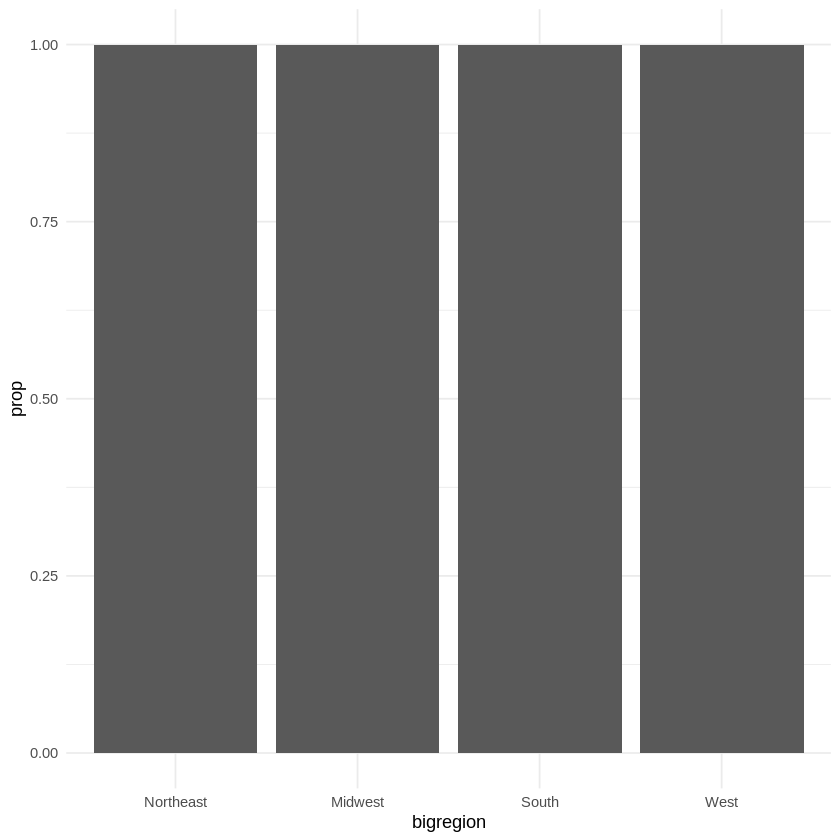

In [ ]:
p <- ggplot(data = gss_sm, mapping = aes(x = bigregion))
p + geom_bar(mapping = aes(y = after_stat(prop))) + theme_minimal()

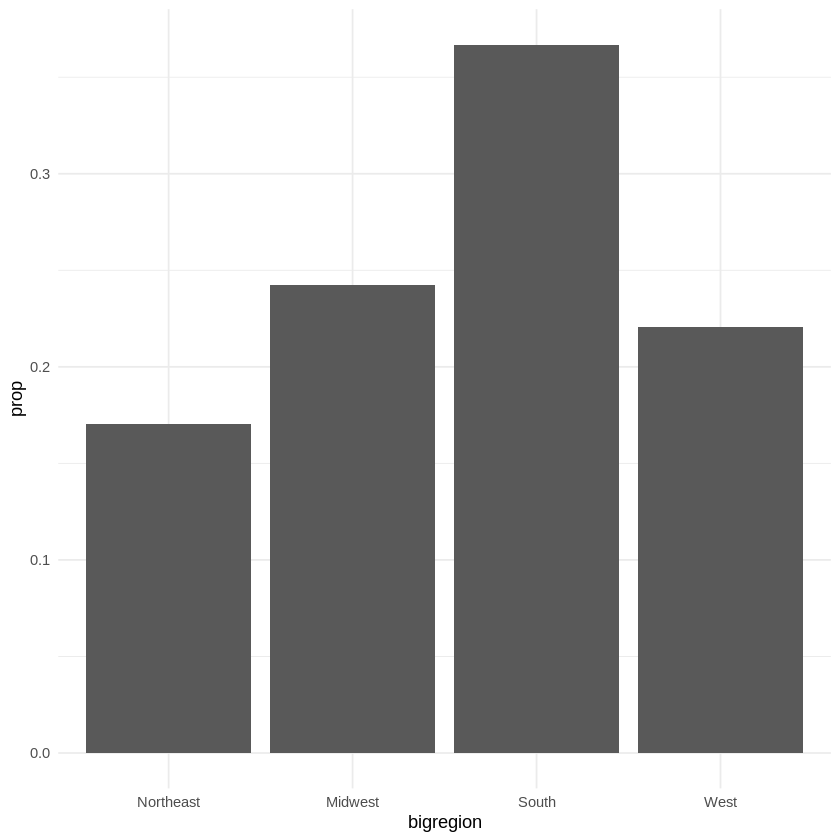

In [ ]:
p <- ggplot(data = gss_sm, mapping = aes(x = bigregion))
# The value of 1 is just a kind of “dummy group” that tells ggplot to 
# use the whole dataset when establishing the denominator for its prop calculations.
p + geom_bar(mapping = aes(y = after_stat(prop), group = 1)) + theme_minimal()

In [ ]:
table(gss_sm$religion)


Protestant   Catholic     Jewish       None      Other 
      1371        649         51        619        159 

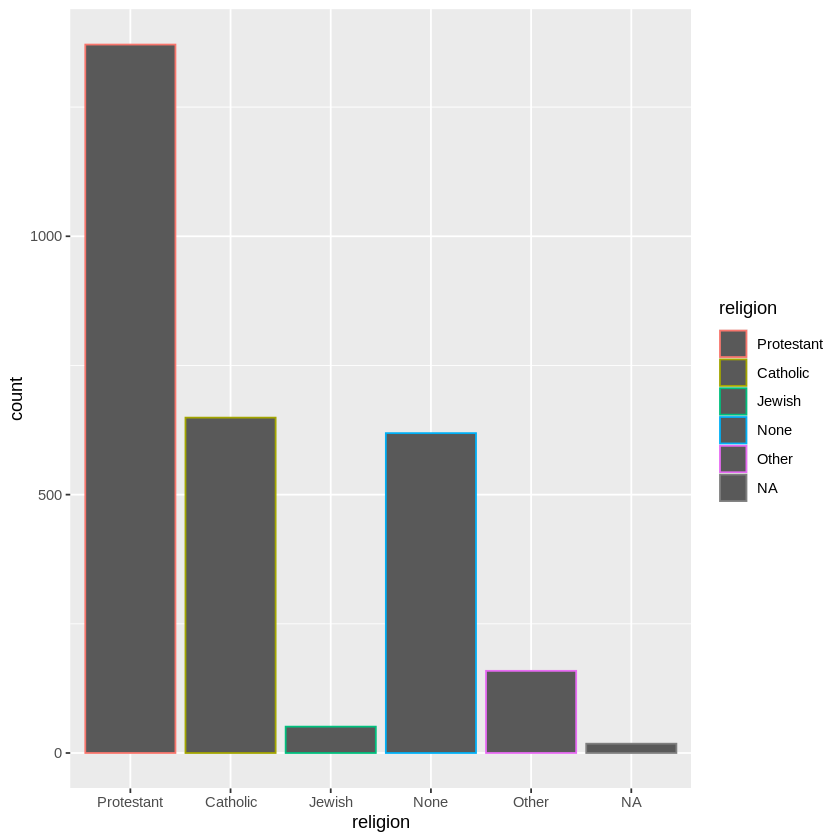

In [ ]:
p <- ggplot(data = gss_sm, mapping=aes(x = religion, color = religion))
p + geom_bar()

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


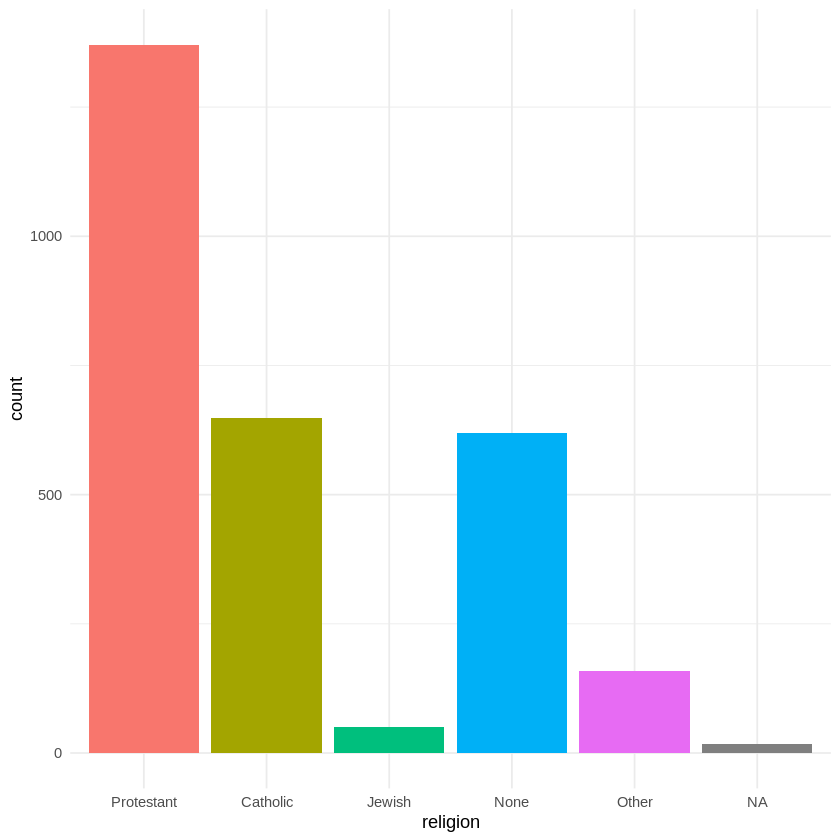

In [ ]:
p <- ggplot(data = gss_sm, mapping=aes(x = religion, fill = religion))
p + geom_bar() + guides(fill = FALSE) + theme_minimal()

# Frequency Plots the Slightly Awkward Way


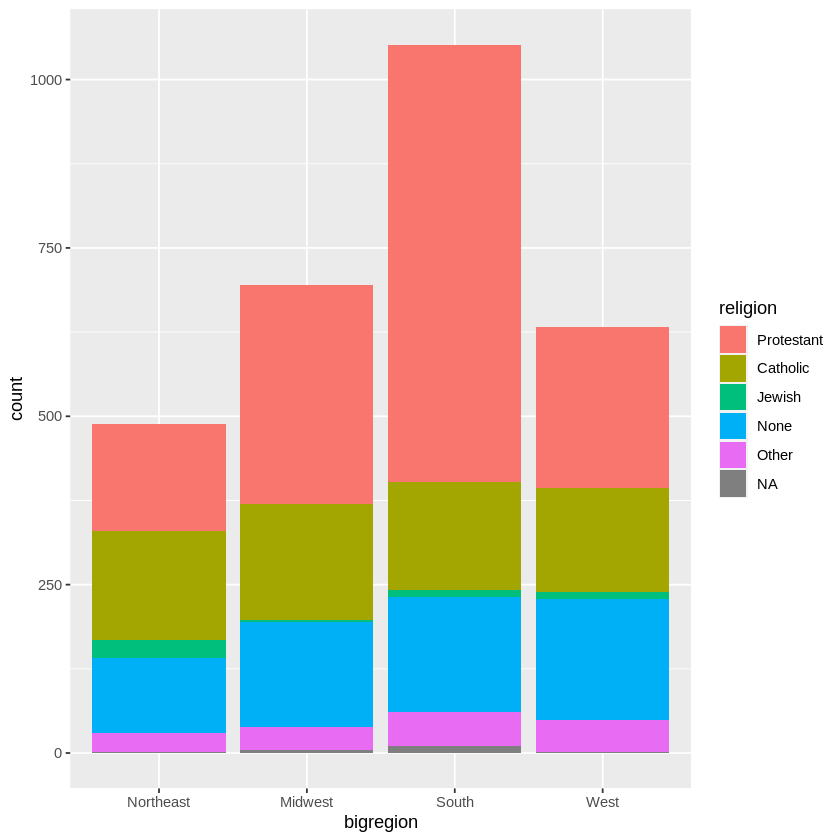

In [ ]:
# the relative position of the bottom categories are quite clear 
# (thanks to them all being aligned on the x-axis), the relative positions of, 
# say, the “Catholic” category is harder to assess.
p <- ggplot(data = gss_sm, mapping = aes(x = bigregion, fill = religion))
p + geom_bar()

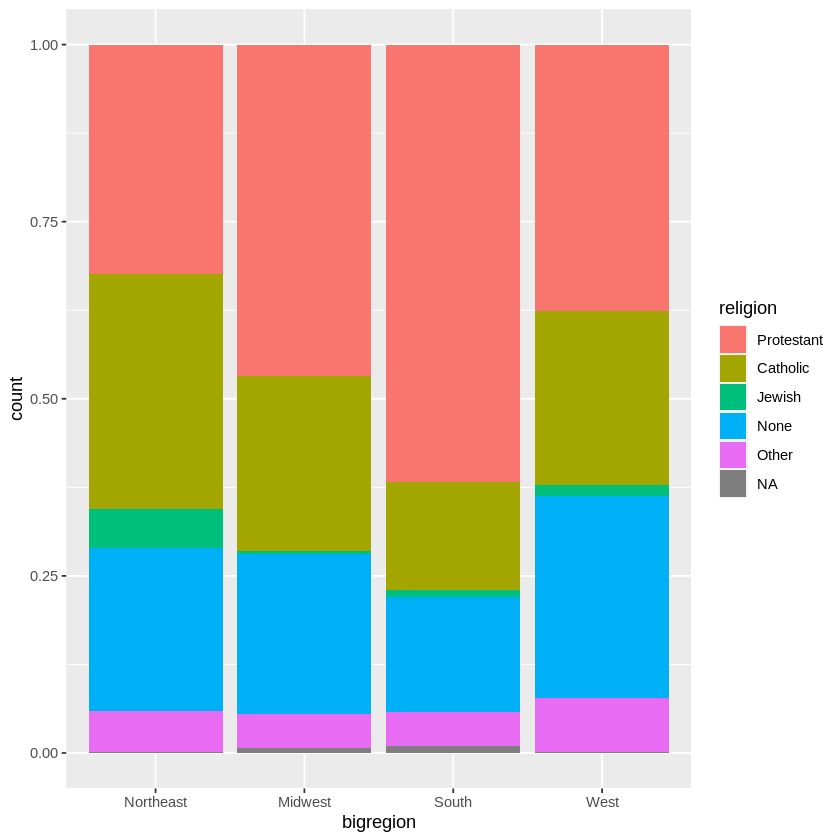

In [ ]:
# We lose the ability to see the relative size of each cut with respect to the over- all total. 
p <- ggplot(data = gss_sm, mapping = aes(x = bigregion, fill = religion))
p + geom_bar(position = "fill")

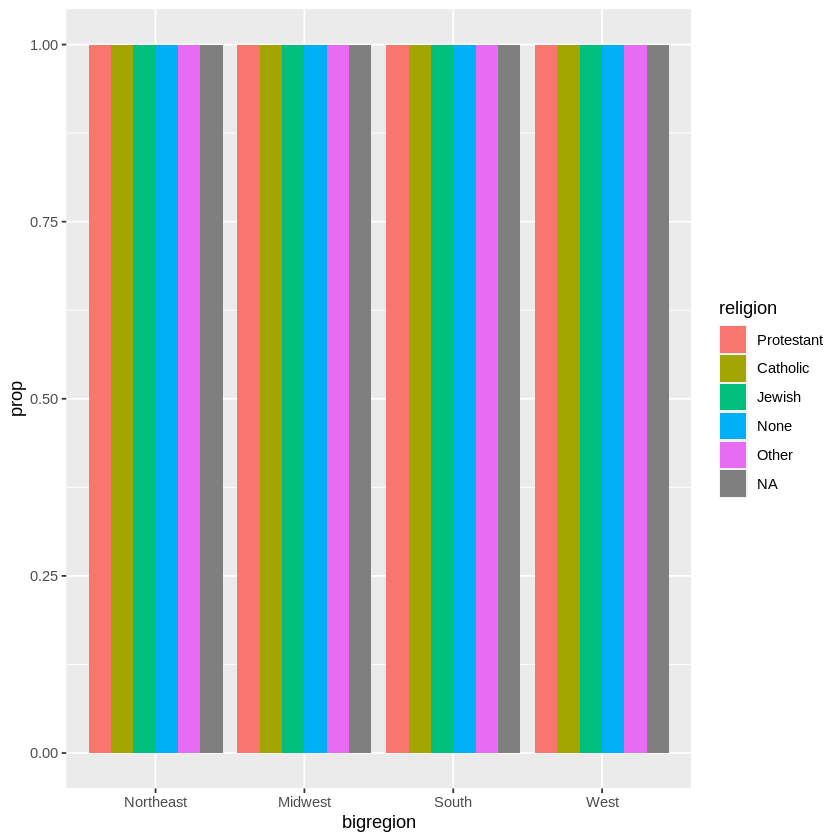

In [ ]:
# There seems to be an issue with the grouping.

p <- ggplot(data = gss_sm, mapping = aes(x = bigregion, fill = religion))
p + geom_bar(position = "dodge", mapping = aes(y = after_stat(prop)))

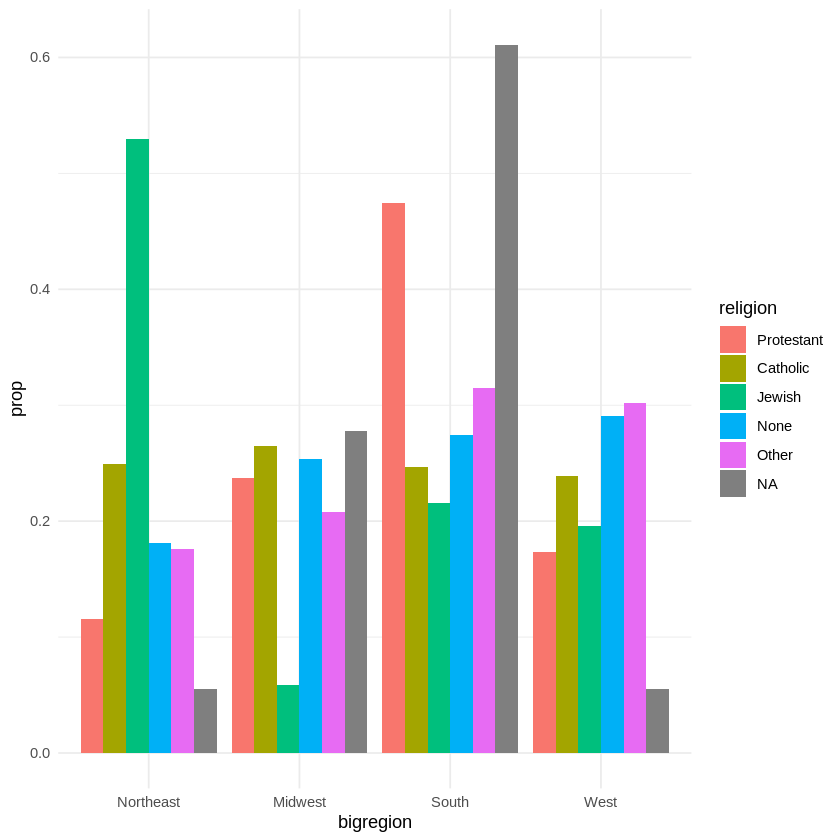

In [ ]:
p <- ggplot(data = gss_sm, mapping = aes(x = bigregion, fill = religion))
p + geom_bar(position = "dodge", mapping = aes(y = after_stat(prop), group = religion)) + theme_minimal()

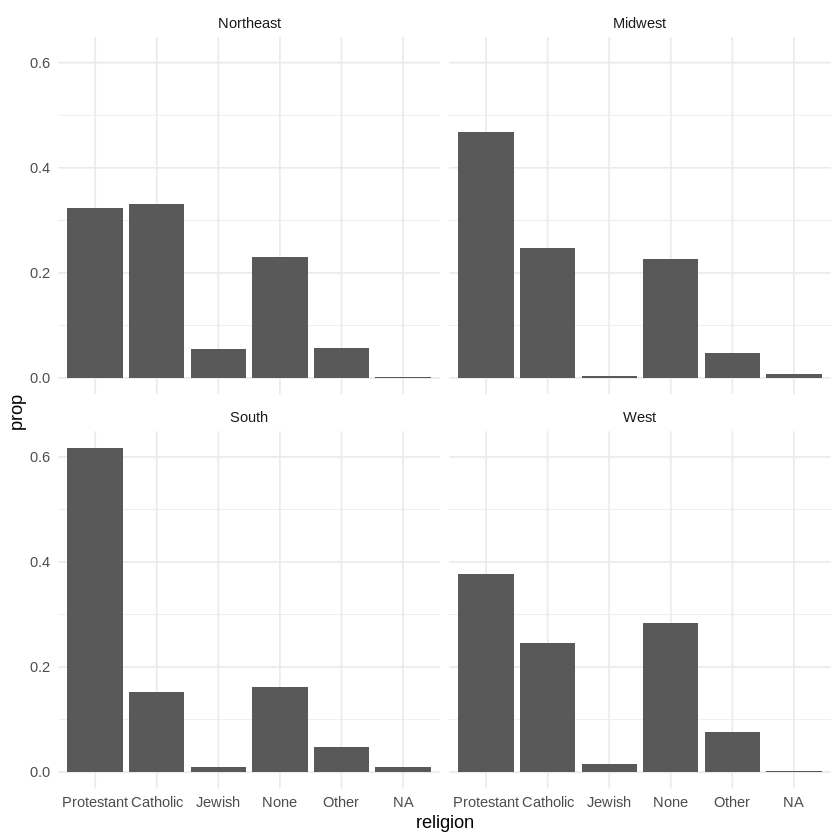

In [ ]:
# The graph is incorrect.
p <- ggplot(data = gss_sm, mapping = aes(x = religion))
p + geom_bar(position = "dodge", mapping = aes(y = after_stat(prop), group = bigregion)) + 
    facet_wrap(~bigregion, ncol = 2)  + theme_minimal()

# Histograms and Density Plots

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


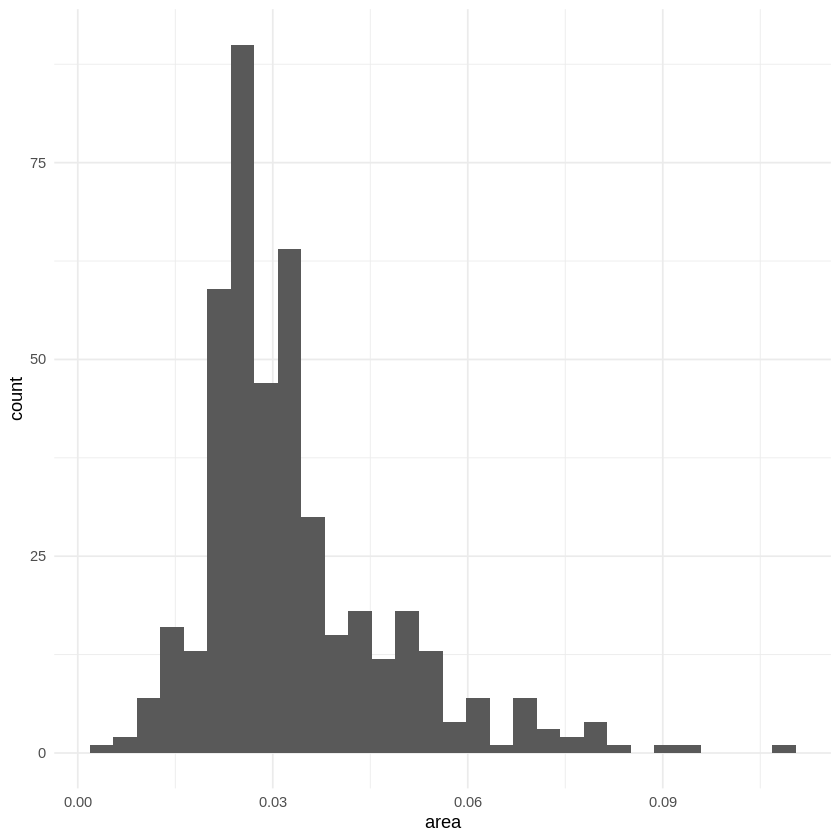

In [ ]:
p <- ggplot(data = midwest, mapping = aes(x = area))
p + geom_histogram() + theme_minimal()

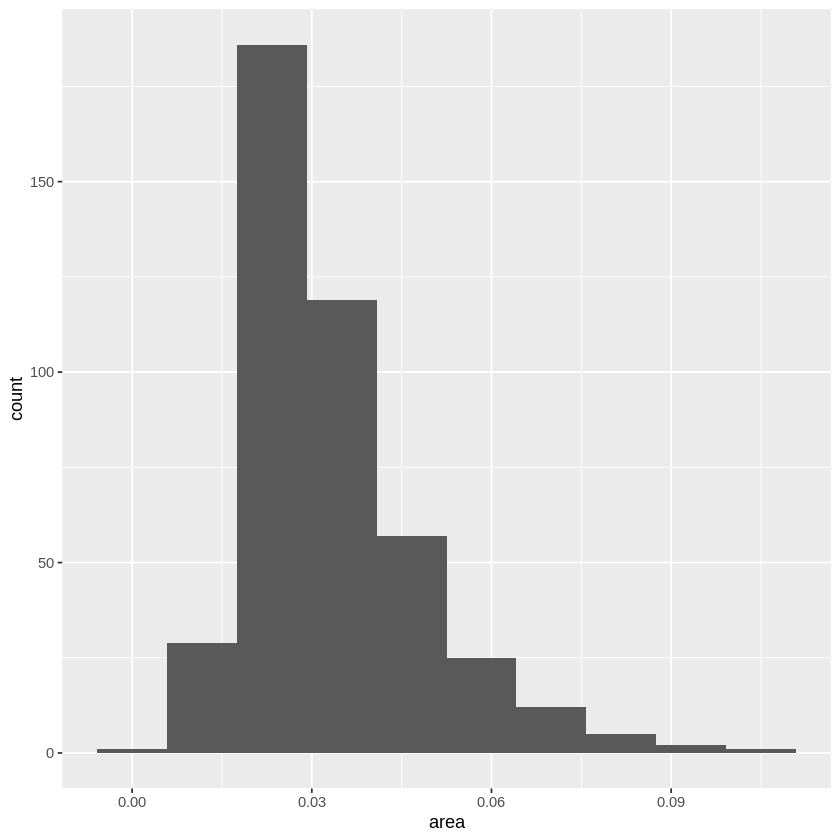

In [ ]:
p <- ggplot(data = midwest, mapping = aes(x = area))
p + geom_histogram(bins = 10)

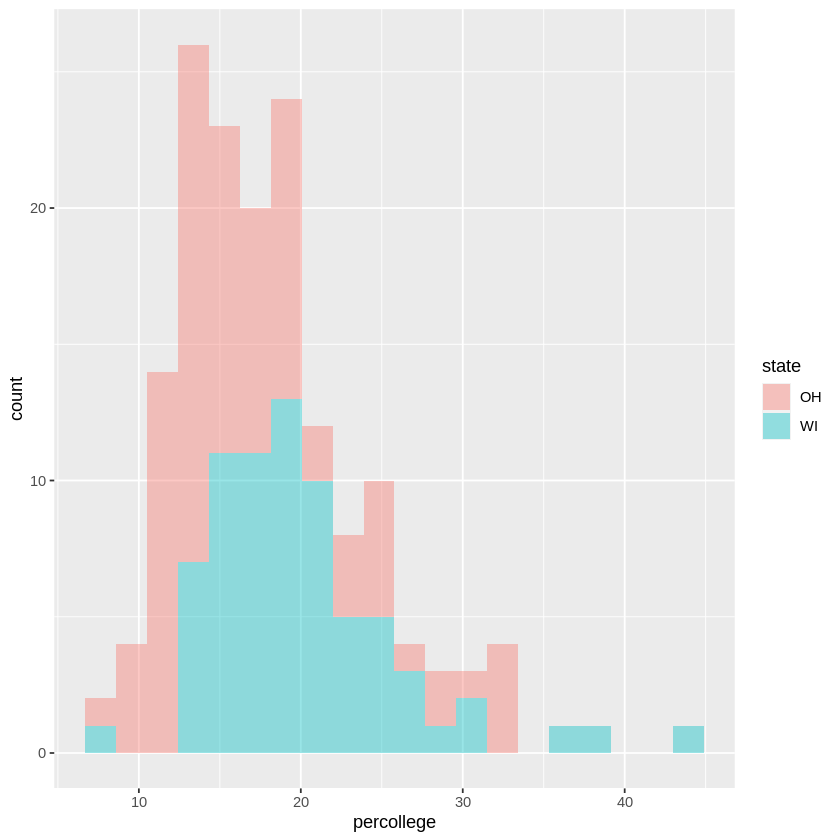

In [ ]:
oh_wi <- c("OH", "WI")

p <- ggplot(data = subset(midwest, subset = state %in% oh_wi), mapping = aes(x= percollege, fill = state))
p + geom_histogram(alpha = 0.4, bins = 20)

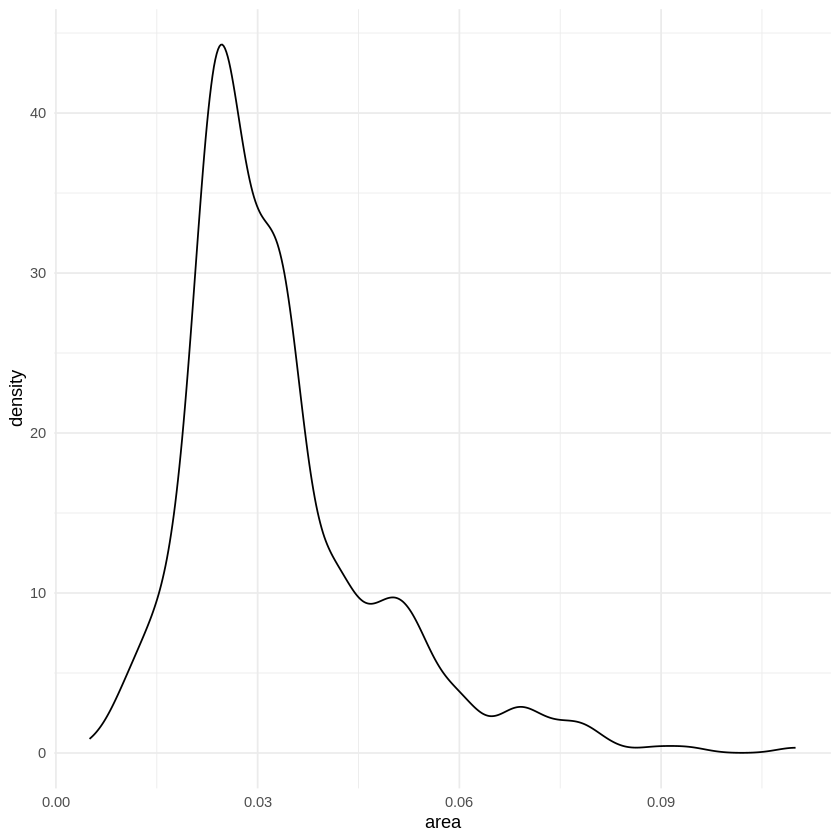

In [ ]:
p <- ggplot(data = midwest, mapping = aes(x = area))
p + geom_density() + theme_minimal()

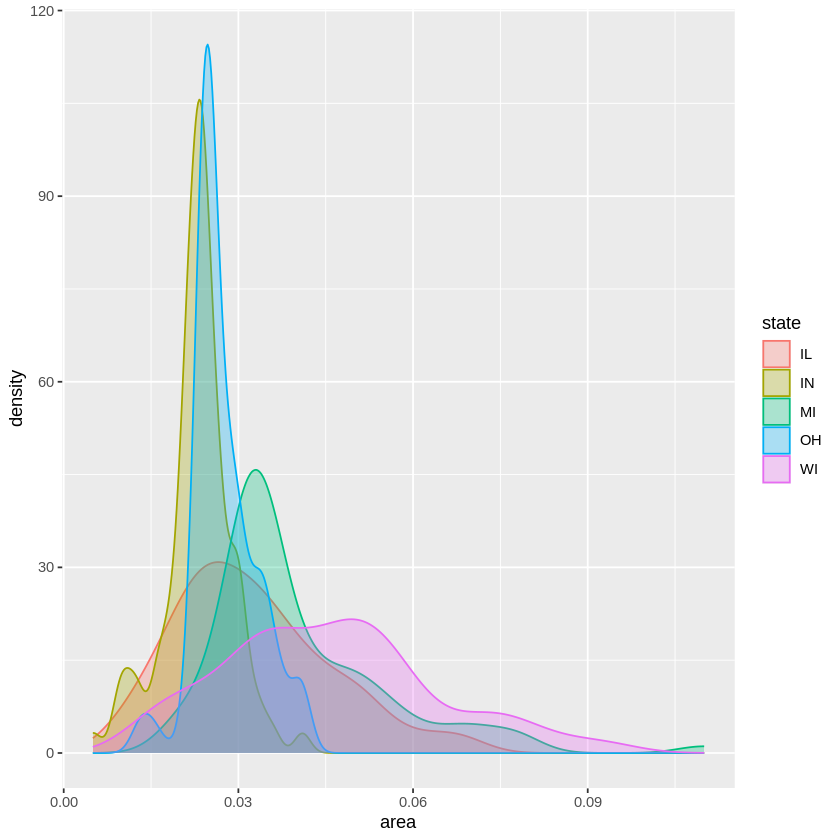

In [ ]:
p <- ggplot(data = midwest, mapping = aes(x = area, fill = state, color = state))
p + geom_density(alpha = 0.3)

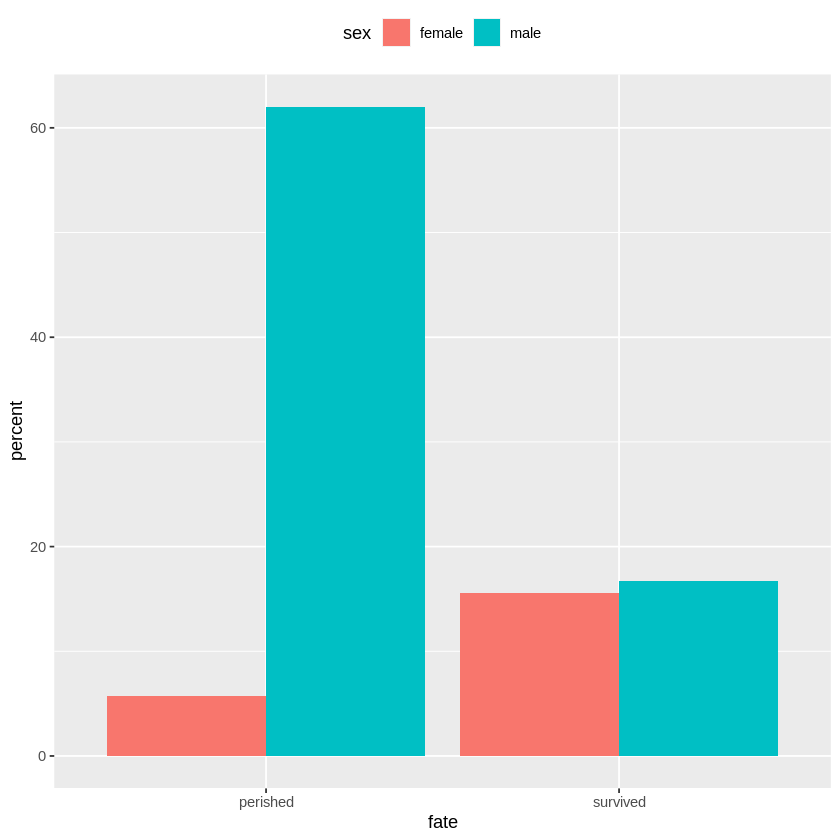

In [ ]:
p <- ggplot(data = titanic, mapping = aes(x = fate, y = percent, fill = sex))
p + geom_bar(position = "dodge", stat = "identity") + theme(legend.position = "top")

# Avoid Transformations When Necessary

In [ ]:
oecd_sum

year,other,usa,diff,hi_lo
<int>,<dbl>,<dbl>,<dbl>,<chr>
1960,68.6,69.9,1.3,Below
1961,69.2,70.4,1.2,Below
1962,68.9,70.2,1.3,Below
1963,69.1,70.0,0.9,Below
1964,69.5,70.3,0.8,Below
1965,69.6,70.3,0.7,Below
1966,69.9,70.3,0.4,Below
1967,70.1,70.7,0.6,Below
1968,70.1,70.4,0.3,Below


Warning message:
“Removed 1 rows containing missing values (`position_stack()`).”


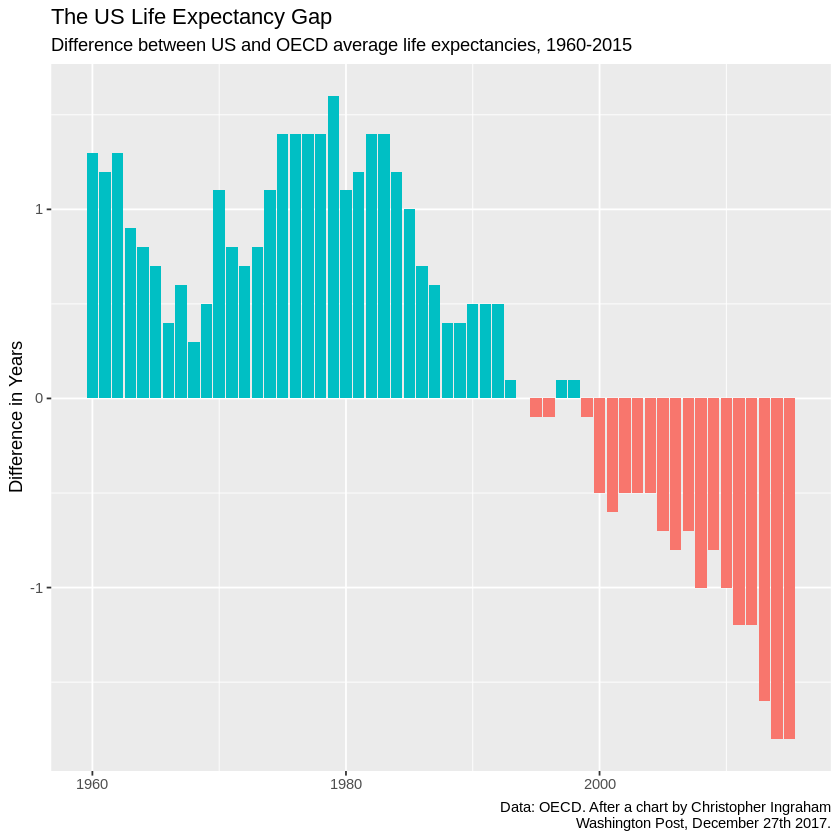

In [ ]:
p <- ggplot(data = oecd_sum, mapping = aes(x = year, y = diff, fill = hi_lo))
p + geom_col() + guides(fill = FALSE) + 
  labs(x = NULL, y = "Difference in Years",
       title = "The US Life Expectancy Gap",
       subtitle = "Difference between US and OECD average life expectancies, 1960-2015",
       caption = "Data: OECD. After a chart by Christopher Ingraham
                  Washington Post, December 27th 2017.")

# 5 Graph Tables, Add Labels, Make Notes

In [ ]:
rel_by_region <- gss_sm %>%
  group_by(bigregion, religion) %>%
  summarize(N = n()) %>%
  mutate(freq = N / sum(N),
        pct = round((freq*100), 0))

`summarise()` has grouped output by 'bigregion'. You can override using the
`.groups` argument.


In [ ]:
rel_by_region

bigregion,religion,N,freq,pct
<fct>,<fct>,<int>,<dbl>,<dbl>
Northeast,Protestant,158,0.323770492,32
Northeast,Catholic,162,0.331967213,33
Northeast,Jewish,27,0.055327869,6
Northeast,None,112,0.229508197,23
Northeast,Other,28,0.057377049,6
Northeast,NA,1,0.002049180,0
Midwest,Protestant,325,0.467625899,47
Midwest,Catholic,172,0.247482014,25
Midwest,Jewish,3,0.004316547,0


# Sanity Checking

In [ ]:
# The percentage table should add up to 100 for each.
rel_by_region %>% group_by(bigregion) %>% summarize(total = sum(pct))

ERROR: ignored

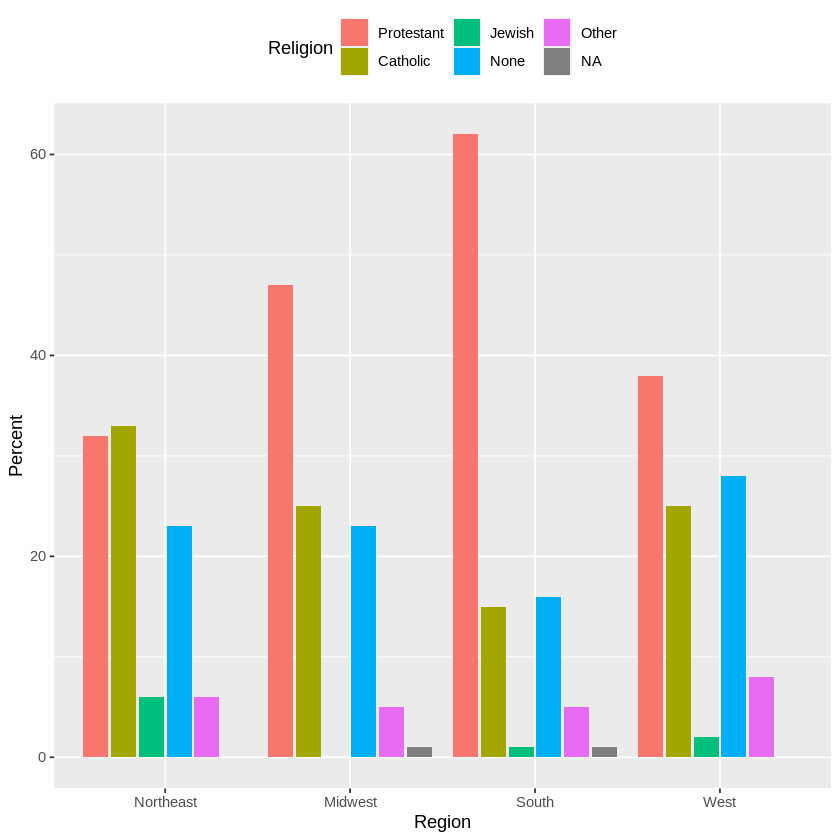

In [ ]:
p <- ggplot(rel_by_region, aes(x = bigregion, y = pct, fill = religion))
p + geom_col(position = "dodge2") +
    labs(x = "Region", y = "Percent", fill = "Religion") +
    theme(legend.position = "top")

Note: The figure is bad because It is too crowded,with too many bars side by side. 

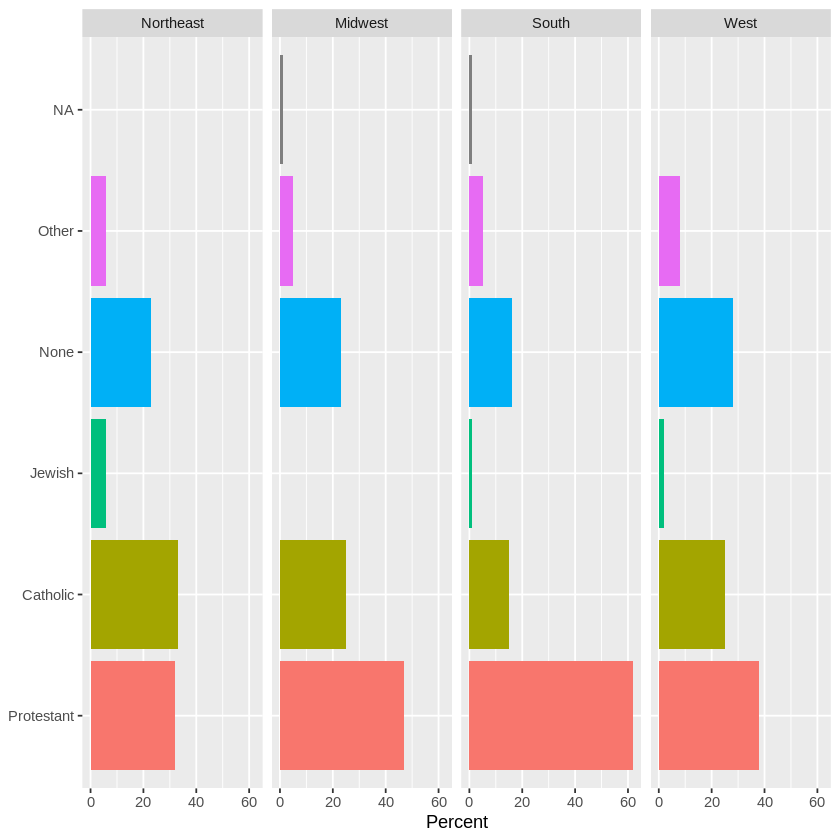

In [ ]:
p <- ggplot(rel_by_region, aes(x = religion, y = pct, fill = religion))
p + geom_col(position = "dodge2") +
    labs(x = NULL, y = "Percent", fill = "Religion") + 
    guides(fill = FALSE) + 
    coord_flip() + 
    facet_grid(~ bigregion)

In [ ]:
organdata %>% select(1:6) %>% sample_n(size = 10)

country,year,donors,pop,pop_dens,gdp
<chr>,<date>,<dbl>,<int>,<dbl>,<int>
Spain,1999-01-01,33.4,39626,7.831380,19546
France,1998-01-01,16.5,58398,10.588939,24044
Sweden,1991-01-01,16.4,8617,1.915059,19000
Spain,2000-01-01,33.9,40614,8.026641,20017
Canada,2000-01-01,15.3,30770,0.308607,28472
Finland,1997-01-01,16.3,5140,1.520035,21691
Austria,2002-01-01,23.8,8053,9.602910,28842
Sweden,1996-01-01,11.9,8841,1.964841,22029
Ireland,NA,NA,3514,5.000712,12917


Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


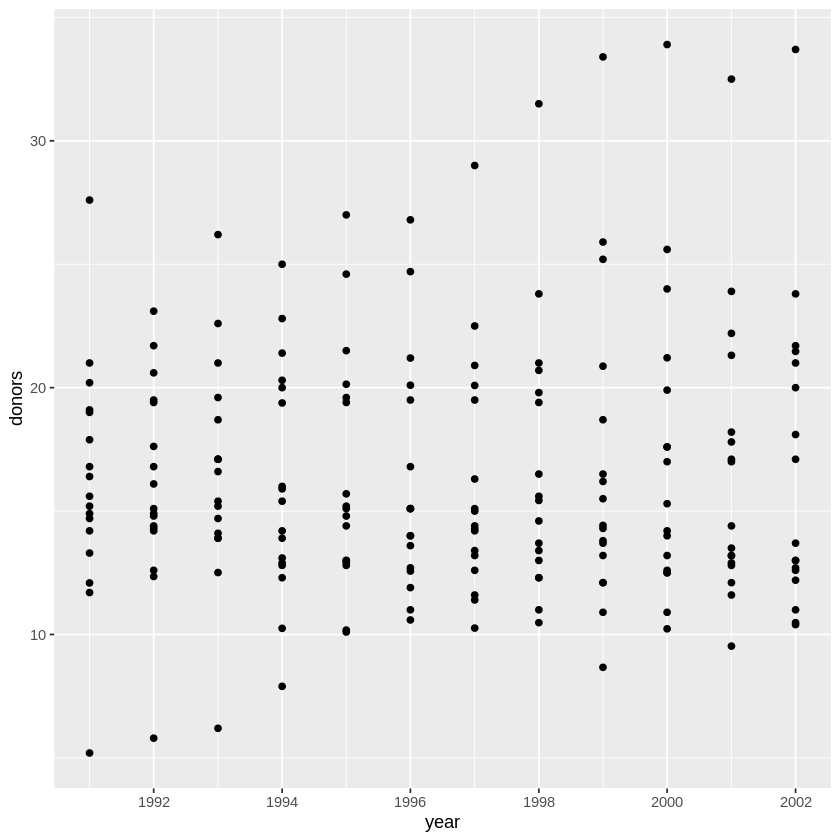

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = year, y = donors))
p + geom_point()

Warning message:
“Removed 34 rows containing missing values (`geom_line()`).”


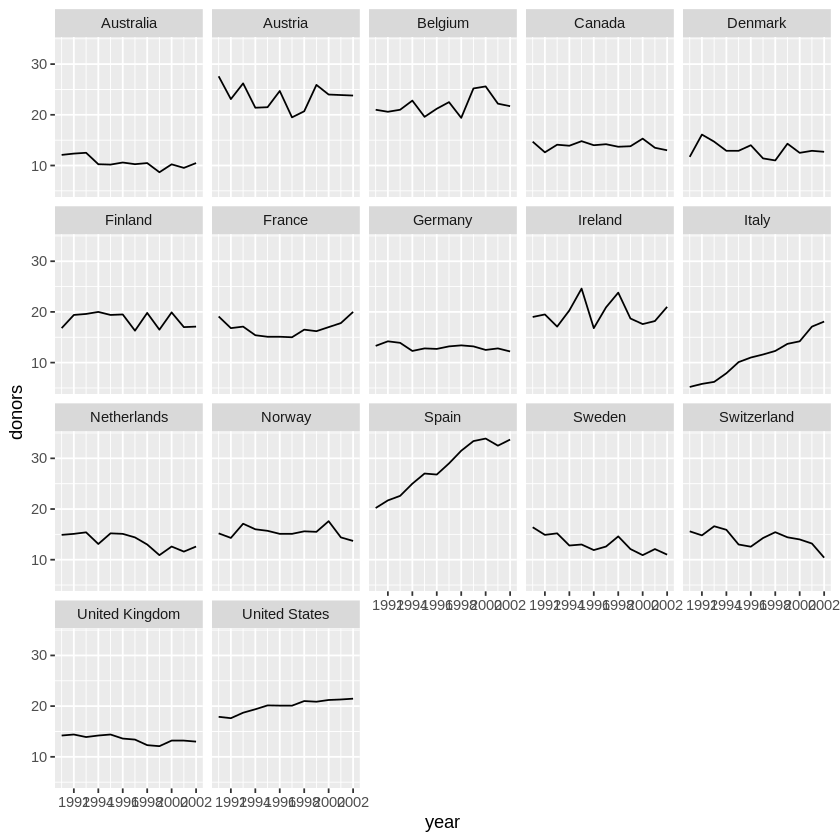

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = year, y = donors))
p + geom_line(aes(group = country)) + facet_wrap(~country)

Warning message:
“Removed 34 rows containing non-finite values (`stat_boxplot()`).”


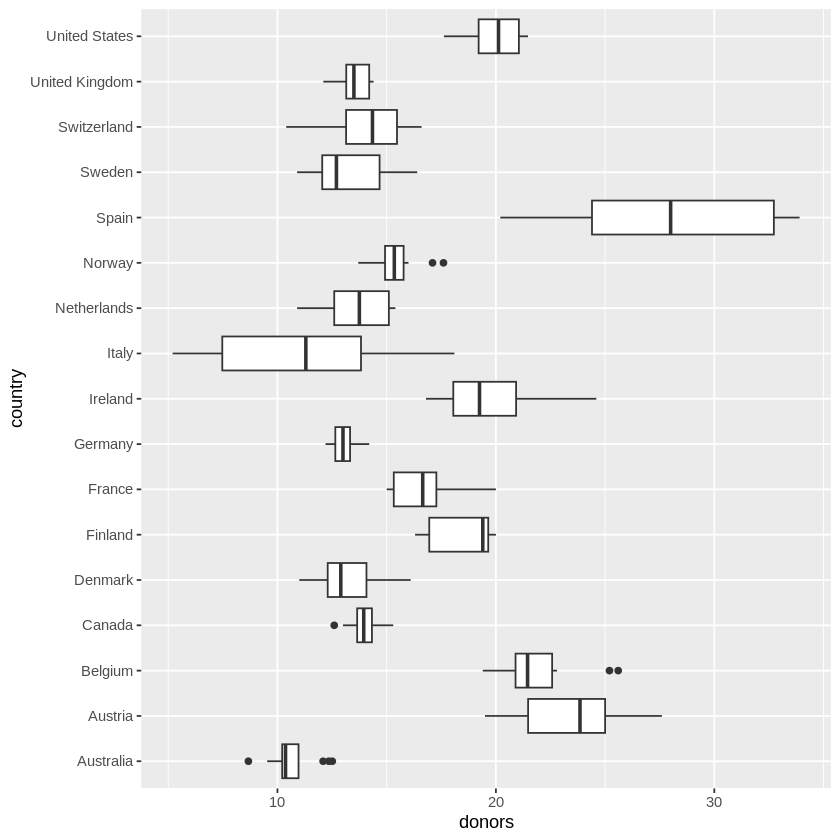

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = country, y = donors))
p + geom_boxplot() + coord_flip()

Warning message:
“Removed 34 rows containing non-finite values (`stat_boxplot()`).”


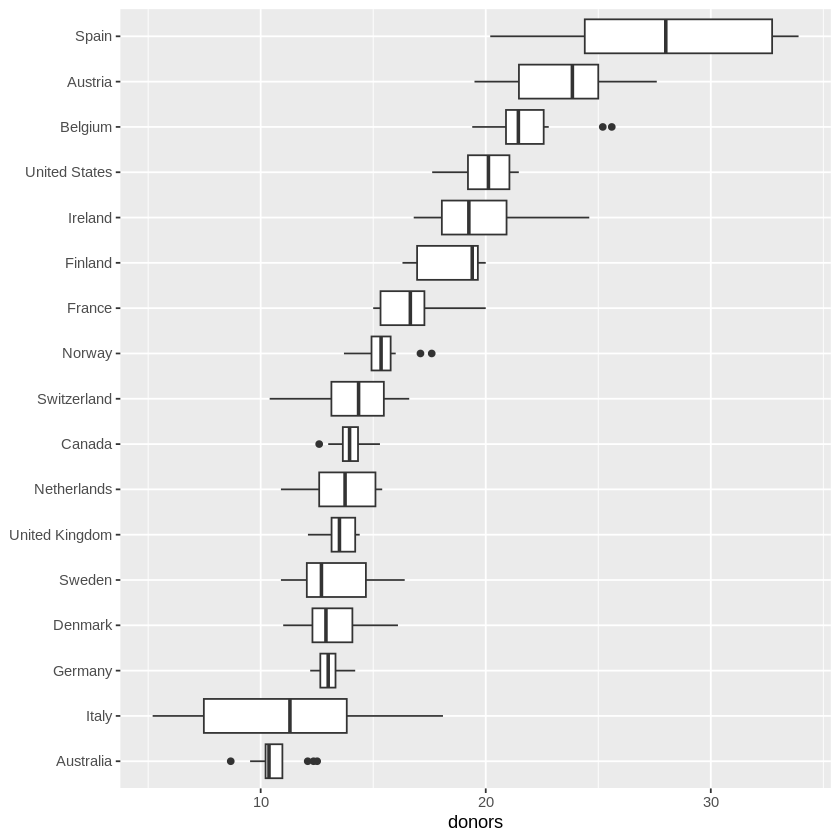

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = reorder(country, donors, na.rm = TRUE), y = donors))
p + geom_boxplot() + labs(x = NULL) + coord_flip()

Warning message:
“Removed 34 rows containing non-finite values (`stat_boxplot()`).”


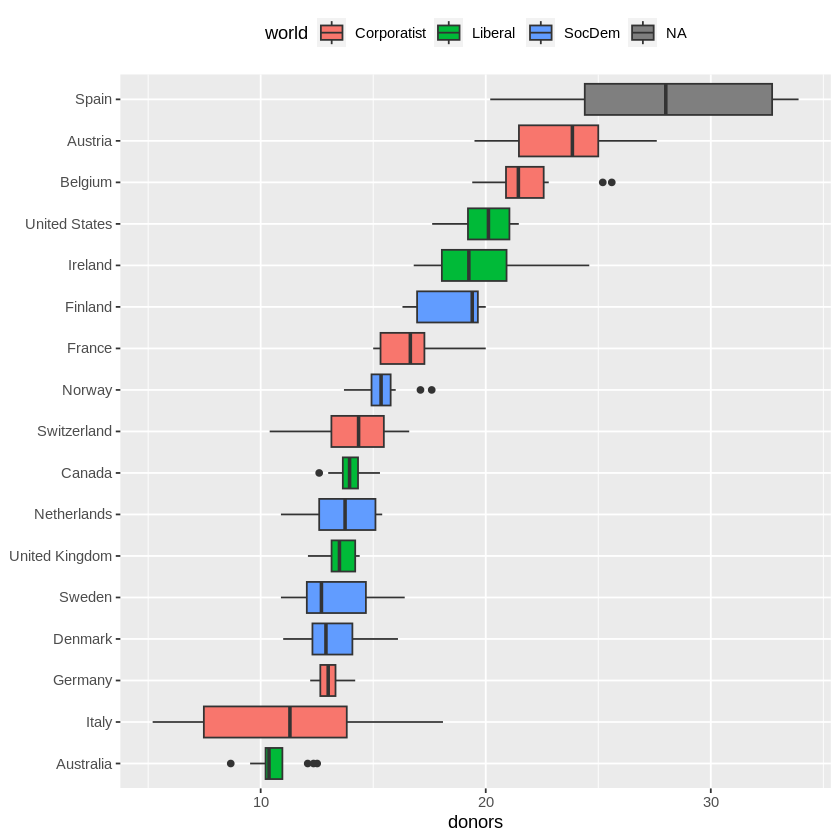

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = reorder(country, donors, na.rm=TRUE), y = donors, fill = world))
p + geom_boxplot() + labs(x = NULL) +
  coord_flip() + theme(legend.position = "top")

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


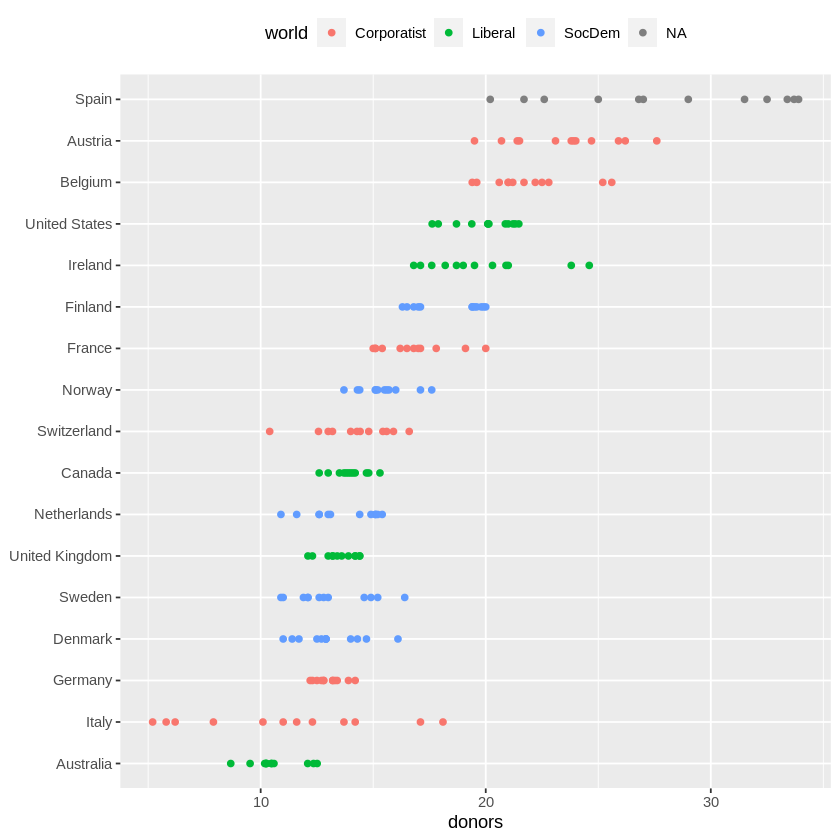

In [ ]:
p <- ggplot(data = organdata, 
            mapping = aes(x = reorder(country, donors, na.rm=TRUE), 
                          y = donors, color = world))
p + geom_point() + labs(x = NULL) +
    coord_flip() + theme(legend.position = "top")

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


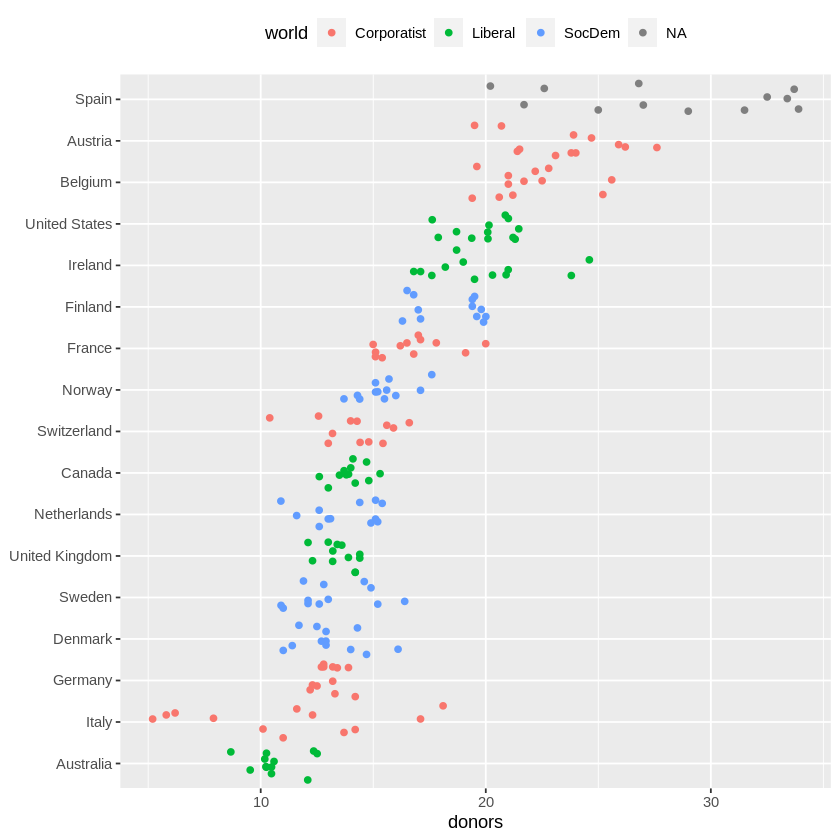

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = reorder(country, donors, na.rm=TRUE),
                                            y = donors, color = world))
p + geom_jitter() + labs(x = NULL) + 
    coord_flip() + theme(legend.position = "top")

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


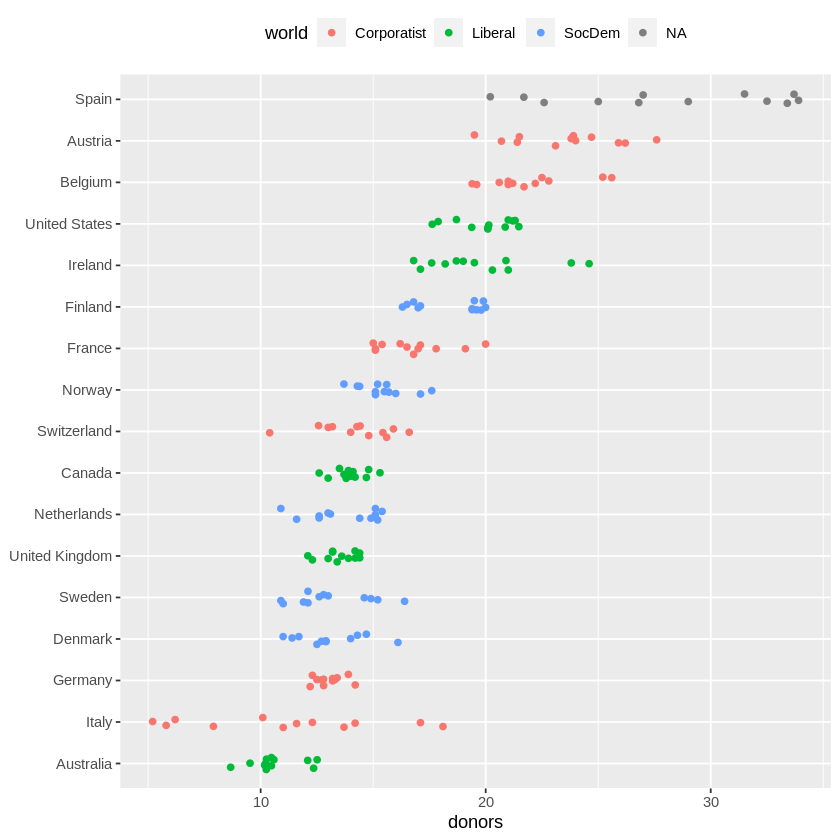

In [ ]:
p <- ggplot(data = organdata,
            mapping = aes(x = reorder(country, donors, na.rm=TRUE),
                          y = donors, color = world))
p + geom_jitter(position = position_jitter(width = 0.15)) +
    labs(x = NULL) + coord_flip() + theme(legend.position = "top")

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


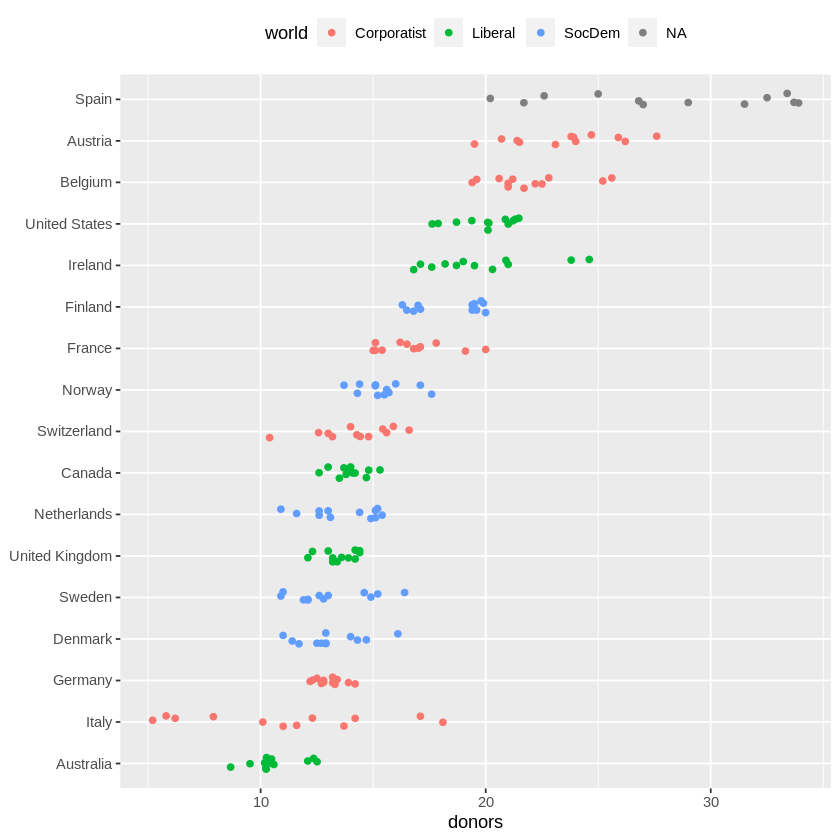

In [ ]:
p <- ggplot(data = organdata,
            mapping = aes(x = reorder(country, donors, na.rm=TRUE),
                          y = donors, color = world))
p + geom_jitter(position = position_jitter(width = 0.15)) +
    labs(x = NULL) + coord_flip() + theme(legend.position = "top")

In [ ]:
library(tidyverse)
library(socviz)

by_country <- organdata %>% group_by(consent_law, country) %>%
  summarize(donors_mean = mean(donors, na.rm = TRUE),
            donors_sd = sd(donors, na.rm = TRUE),
            gdp_mean = mean(gdp, na.rm = TRUE),
            health_mean = mean(health, na.rm = TRUE),
            roads_mean = mean(roads, na.rm = TRUE),
            cerebvas_mean = mean(cerebvas, na.rm = TRUE))

by_country

`summarise()` has grouped output by 'consent_law'. You can override using the
`.groups` argument.


consent_law,country,donors_mean,donors_sd,gdp_mean,health_mean,roads_mean,cerebvas_mean
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Informed,Australia,10.63500,1.1428075,22178.54,1957.500,104.87573,557.6923
Informed,Canada,13.96667,0.7511607,23711.08,2271.929,109.26011,422.3846
Informed,Denmark,13.09167,1.4681208,23722.31,2054.071,101.63635,640.6923
Informed,Germany,13.04167,0.6111960,22163.23,2348.750,112.78873,706.7692
Informed,Ireland,19.79167,2.4784373,20824.38,1479.929,117.77424,704.6923
Informed,Netherlands,13.65833,1.5518074,23013.15,1992.786,76.09357,584.9231
Informed,United Kingdom,13.49167,0.7751344,21359.31,1561.214,67.92936,707.9231
Informed,United States,19.98167,1.3253667,29211.77,3988.286,155.16783,444.3846
Presumed,Austria,23.52500,2.4159037,23875.85,1875.357,149.86541,768.8462


In [ ]:
by_country <- organdata %>% group_by(consent_law, country) %>%
  summarize_if(is.numeric, list(mean = mean, sd = sd), na.rm = TRUE) %>%
  ungroup()

by_country

consent_law,country,donors_mean,pop_mean,pop_dens_mean,gdp_mean,gdp_lag_mean,health_mean,health_lag_mean,pubhealth_mean,⋯,gdp_sd,gdp_lag_sd,health_sd,health_lag_sd,pubhealth_sd,roads_sd,cerebvas_sd,assault_sd,external_sd,txp_pop_sd
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Informed,Australia,10.63500,18317.923,0.2366284,22178.54,21779.43,1957.500,1848.214,5.676923,⋯,3958.506,4085.883,481.6276,460.0962,0.4245661,14.327316,82.69863,1.8327505,26.76440,0.039629946
Informed,Canada,13.96667,29607.923,0.2969520,23711.08,23353.07,2271.929,2163.429,6.676923,⋯,3965.847,4038.868,420.5751,379.1317,0.3919053,17.679258,38.46544,2.4547181,40.76873,0.042470126
Informed,Denmark,13.09167,5257.154,12.2004034,23722.31,23275.00,2054.071,1973.429,6.984615,⋯,3895.685,4100.016,371.3614,357.7605,0.1519109,12.421001,46.27163,2.1273554,33.60441,0.011673046
Informed,Germany,13.04167,80254.846,22.4784601,22163.23,21938.36,2348.750,2256.250,8.142308,⋯,2501.344,2546.250,377.2275,383.7725,0.6244485,25.911094,126.03515,1.6641006,56.97424,0.043753449
Informed,Ireland,19.79167,3673.615,5.2278574,20824.38,20153.64,1479.929,1340.786,4.876923,⋯,6669.580,6881.862,565.5526,482.4379,0.2862221,10.761587,87.20320,1.5607362,18.85471,0.028705994
Informed,Netherlands,13.65833,15547.692,37.4372557,23013.15,22553.64,1992.786,1884.857,5.700000,⋯,3769.961,4009.418,417.0621,377.0521,0.3082207,9.930020,52.23259,1.3445045,18.62725,0.016975898
Informed,United Kingdom,13.49167,58186.692,23.9540127,21359.31,20962.50,1561.214,1463.500,5.761538,⋯,3929.497,4056.793,405.0679,374.9447,0.3548203,10.467402,93.43577,1.6563785,15.14079,0.007572917
Informed,United States,19.98167,269329.769,2.7970428,29211.77,28699.43,3988.286,3760.429,5.776923,⋯,4571.160,4791.979,864.9320,807.5220,0.4621577,8.353810,16.04960,17.8724111,32.15587,0.047677193
Presumed,Austria,23.52500,7927.308,9.4530261,23875.85,23415.07,1875.357,1803.143,5.492308,⋯,3342.889,3645.228,296.8980,316.8549,0.2660249,30.281692,119.64242,2.3259958,62.13540,0.008824909


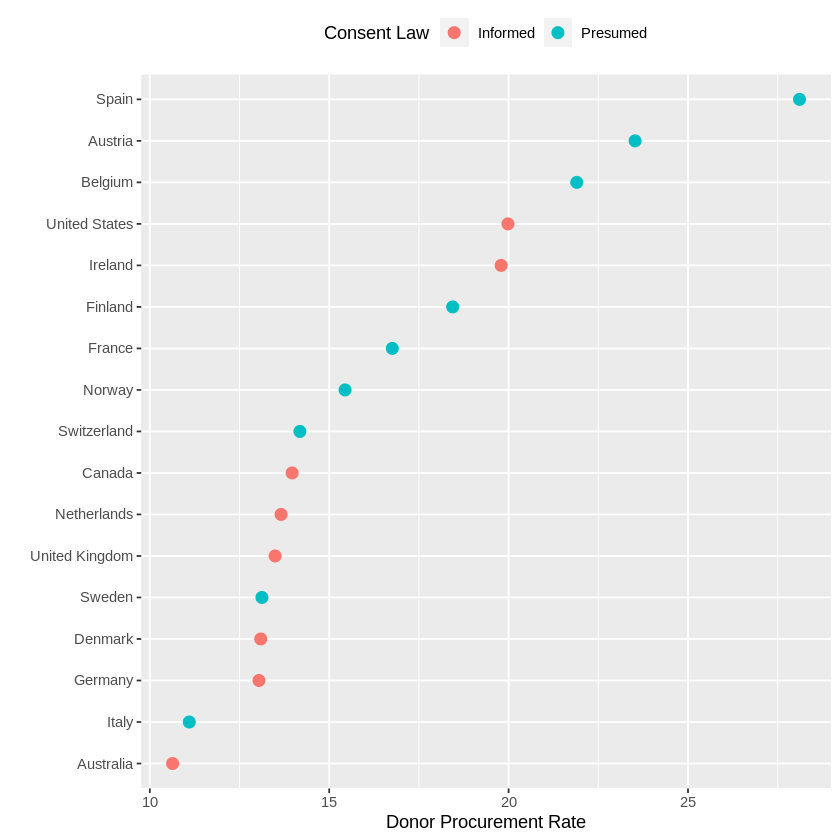

In [ ]:
p <- ggplot(data = by_country, 
            mapping = aes(x = donors_mean, y = reorder(country, donors_mean),
                          color = consent_law))

p + geom_point(size = 3) + 
    labs(x = "Donor Procurement Rate",
         y = "", color = "Consent Law") +
    theme(legend.position = "top")

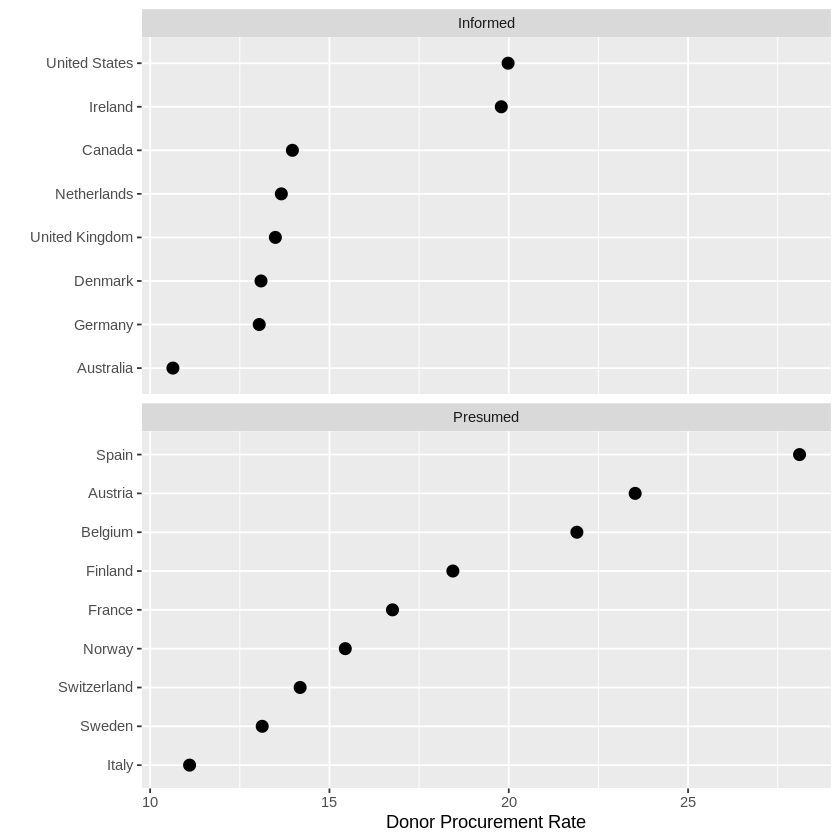

In [ ]:
p <- ggplot(data = by_country, 
            mapping = aes(x = donors_mean,
                          y = reorder(country, donors_mean)))

p + geom_point(size = 3) + 
  facet_wrap(~ consent_law, scales = "free_y", ncol = 1) +
  labs(x = "Donor Procurement Rate", y = "")

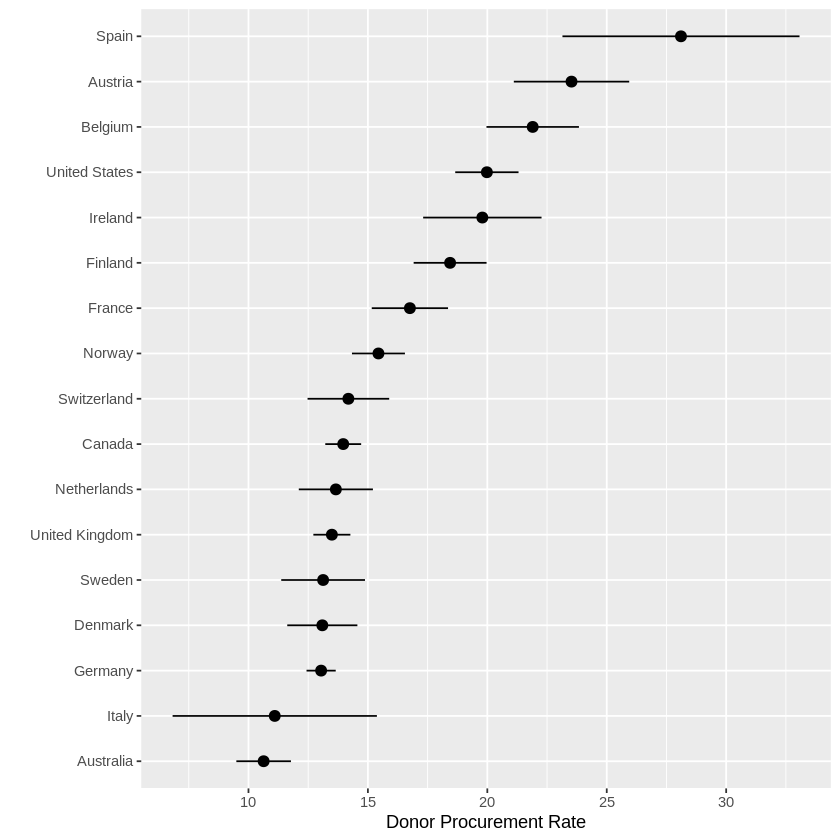

In [ ]:
p <- ggplot(data = by_country, mapping = aes(x = reorder(country, 
              donors_mean), y = donors_mean))

p + geom_pointrange(mapping = aes(ymin = donors_mean - donors_sd, 
                                  ymax = donors_mean + donors_sd)) +
    labs(x = "", y = "Donor Procurement Rate") + coord_flip()

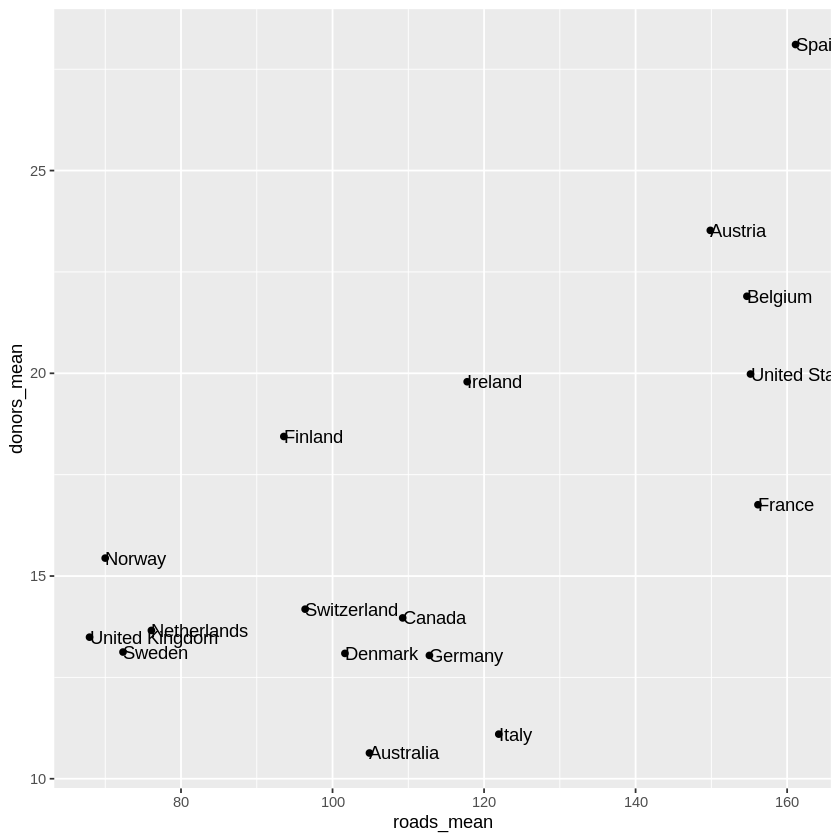

In [ ]:
p <- ggplot(data = by_country, mapping = aes(x = roads_mean,
   y = donors_mean))
p + geom_point() + geom_text(mapping = aes(label = country), hjust = 0)

In [ ]:
devtools::install_github("slowkow/ggrepel")

viridisLite (0.4.1 -> 0.4.2 ) [CRAN]
isoband     (0.2.6 -> 0.2.7 ) [CRAN]
Rcpp        (NA    -> 1.0.10) [CRAN]


Installing 3 packages: viridisLite, isoband, Rcpp

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpVfaq8s/remotesbd27a97739/slowkow-ggrepel-fe3b5c3/DESCRIPTION’ ... OK
* preparing ‘ggrepel’:
* checking DESCRIPTION meta-information ... OK
* cleaning src
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
Removed empty directory ‘ggrepel/tests/testthat/_snaps’
* building ‘ggrepel_0.9.2.9999.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(ggrepel)
elections_historic %>% select(2:7)

ERROR: ignored

In [ ]:
p_title <- "Presidental Elections: Popular & Electoral College Margins"
p_subtitle <- "1824-2016"
p_caption <- "Data for 2016 are provisional"

x_label <- "Winner's share of Popular Vote"
y_label <- "Winner's share of Electoral College Votes"

p <- ggplot(elections_historic, aes(x = popular_pct, y = ec_pct, label = winner_label))

p + geom_hline(yintercept = 0.5, linewidth = 1.4, color = "gray80") + 
    geom_vline(xintercept = 0.5, linewidth = 1.4, color = "gray80") +
    geom_point() + 
    geom_text_repel() + 
    scale_x_continuous(labels = scales::percent) +
    scale_y_continuous(labels = scales::percent) +
    labs(x = x_label, y = y_label, title = p_title, subtitle = p_subtitle,
         caption = p_caption)

ERROR: ignored

#5.4 Label Outliers

In [ ]:
library(tidyverse)
library(socviz)
library(ggrepel)

p <- ggplot(data = by_country, 
            mapping = aes(x = gdp_mean, y = health_mean))

p + geom_point() +
    geom_text_repel(data = subset(by_country, gdp_mean > 25000),
                    mapping = aes(label = country))

p <- ggplot(data = by_country, 
            mapping = aes(x = gdp_mean, y = health_mean))

p + geom_point() + 
    geom_text_repel(data = subset(by_country,
                                  gdp_mean > 25000 | health_mean < 1500 |
                                  country %in% "Belgium"),
                     mapping = aes(label = country))

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.4.1
✔ readr   2.1.4     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



ERROR: ignored

In [ ]:
organdata$ind <- organdata$ccode %in% c("Ita", "Spa") &
                   organdata$year > 1998

p <- ggplot(data = organdata,
           mapping = aes(x = roads,
                         y = donors, color = ind))

p + geom_point() + 
    geom_text_repel(data = subset(organdata, ind),
                    mapping = aes(label = ccode)) +
    guides(label = none, color = FALSE)


ERROR: ignored

# 5.5 Write and Draw in the Plot Area
pg. 124

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = roads, y = donors))
p + geom_point() + annotate(geom = "text", x = 91, y = 33,
                            label = "A surprisingly high \n recovery rate.",
                            hjust = 0.1)

ERROR: ignored

In [ ]:
p <- ggplot(data = organdata,
            mapping = aes(x = roads, y = donors))

p + geom_point() +
    annotate(geom = "rect", xmin = 125, xmax = 155,
             ymin = 30, ymax = 35, fill = "red", alpha = 0.2) +
    annotate(geom = "text", x = 157, y = 33,
             label = "A suprisingly high \n recovery rate.", hjust = 0)

# 5.6 Understanding Scales, Guides, and Themes

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


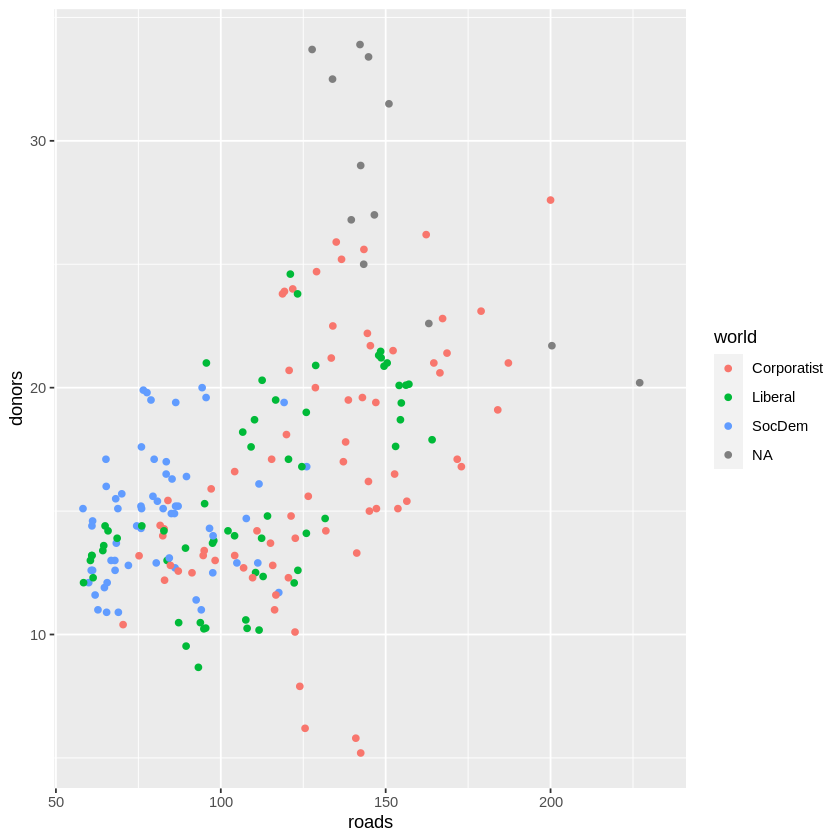

In [ ]:
p <- ggplot(data = organdata,
            mapping = aes(x = roads,
                          y = donors,
                          color = world))

p + geom_point()

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


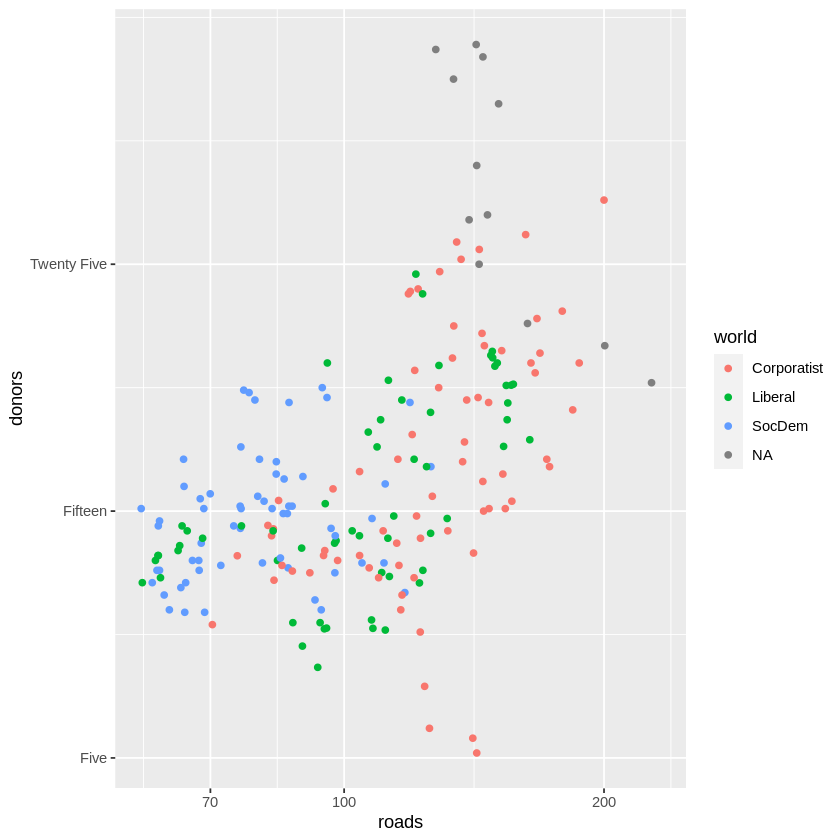

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = roads, y = donors, color = world))
p + geom_point() + scale_x_log10() + scale_y_continuous(breaks = c(5, 15, 25), labels = c("Five", "Fifteen", "Twenty Five"))

Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”


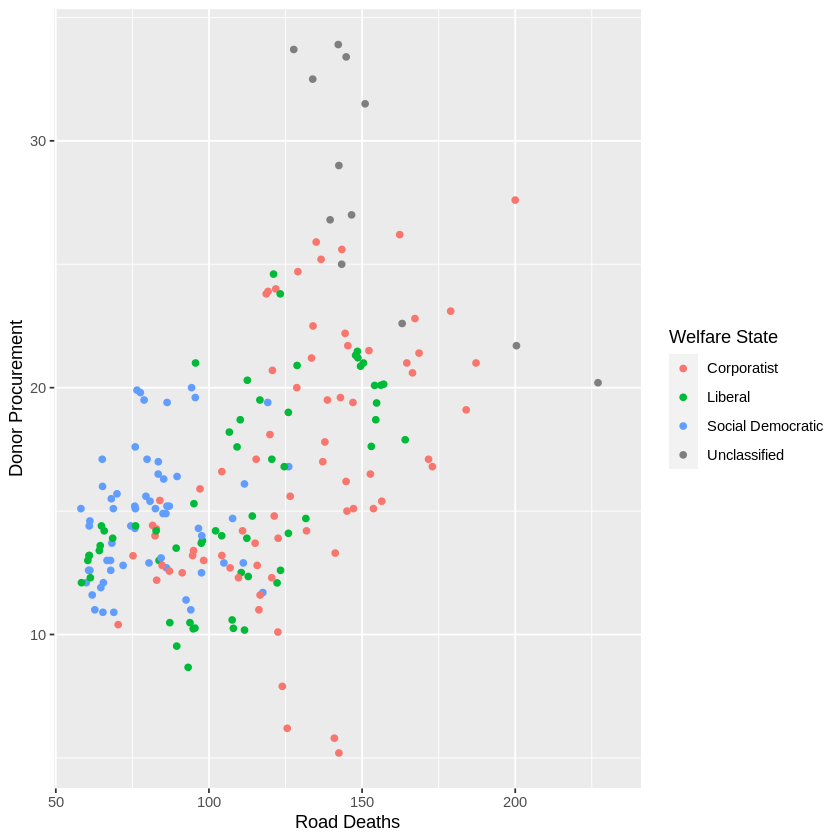

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = roads, y = donors, color = world))
p + geom_point() + scale_color_discrete(labels = c("Corporatist", "Liberal", "Social Democratic", "Unclassified")) + labs(x = "Road Deaths", 
                                                                   y = "Donor Procurement", color = "Welfare State")

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = roads, y = donors, color = world))
p + geom_point() + scale_color_discrete(labels = c("Corporatist", "Liberal", "Social Democratic", "Unclassified")) + guides(color = FALSE)

ERROR: ignored

# Chapter 6

In [ ]:
install.packages("gapminder")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
install.packages("quantreg")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘SparseM’, ‘MatrixModels’




── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.3.0     ✔ stringr 1.4.1
✔ readr   2.1.4     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Loading required package: SparseM


Attaching package: ‘SparseM’


The following object is masked from ‘package:base’:

    backsolve


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


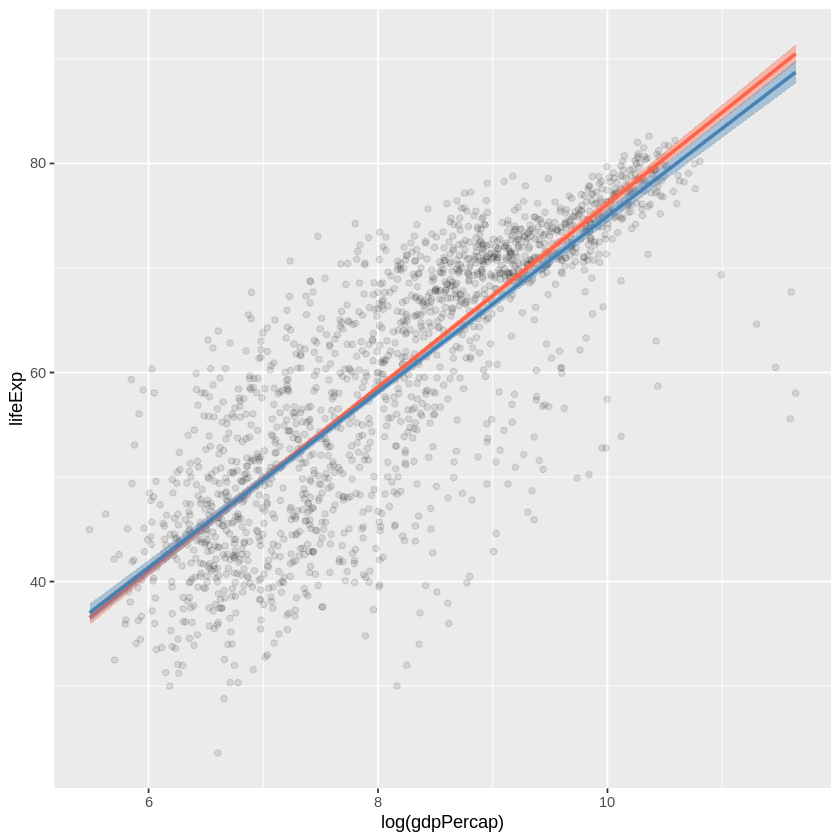

Warning message in geom_smooth(color = "tomato", meothd = "lm", linewidth = 1.2, :
“Ignoring unknown parameters: `meothd`”
`geom_smooth()` using method = 'gam'


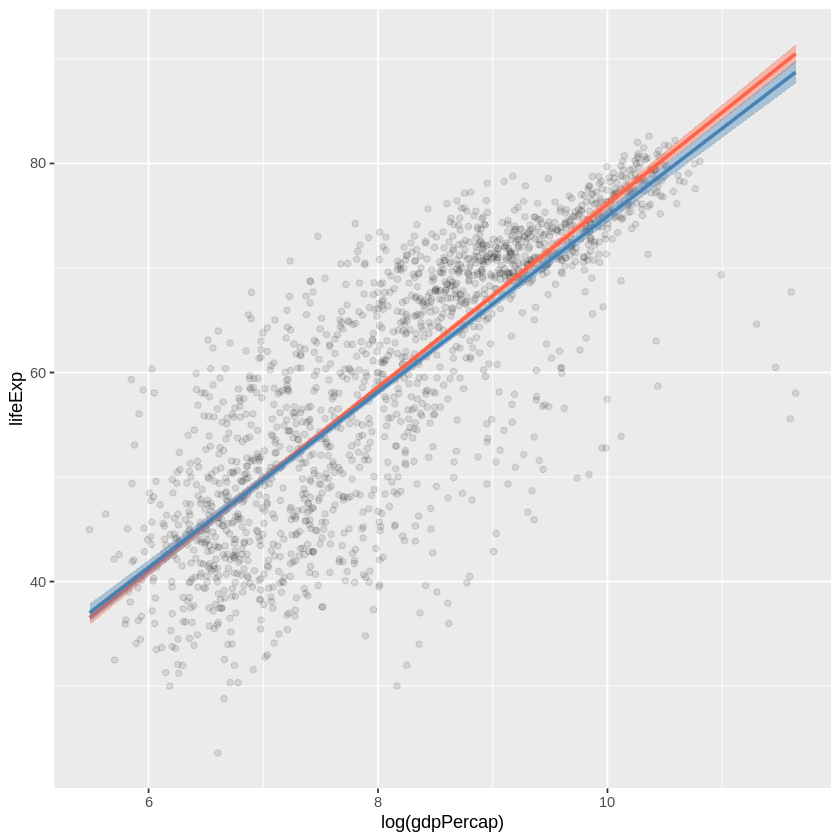

Smoothing formula not specified. Using: y ~ qss(x, lambda = 1)
Warning message in rq.fit.sfn(x, y, tau = tau, rhs = rhs, control = control, ...):
“tiny diagonals replaced with Inf when calling blkfct
”


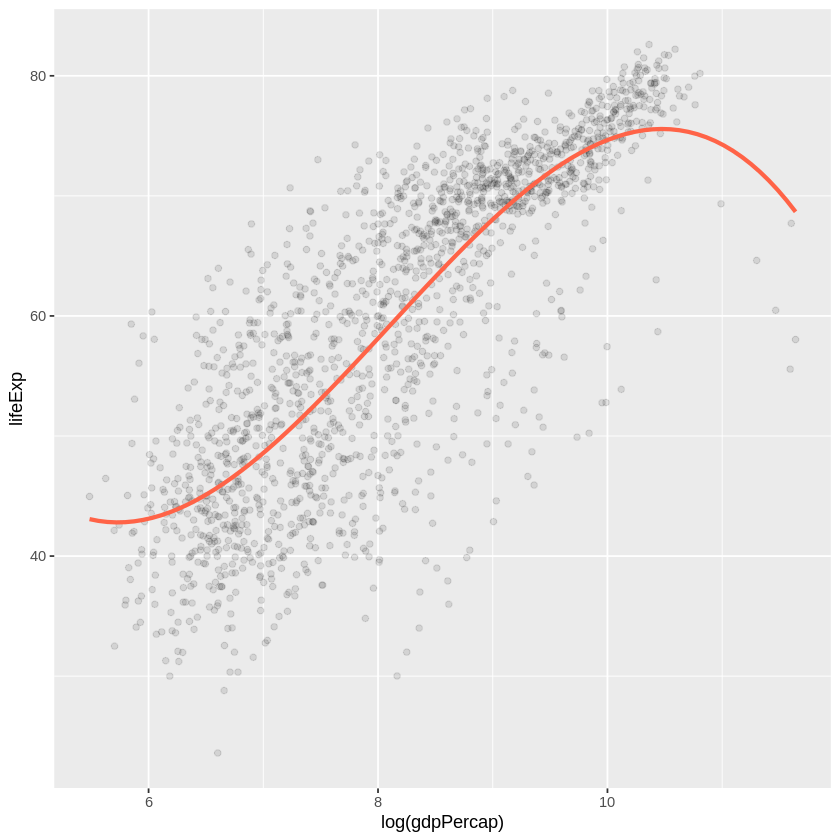

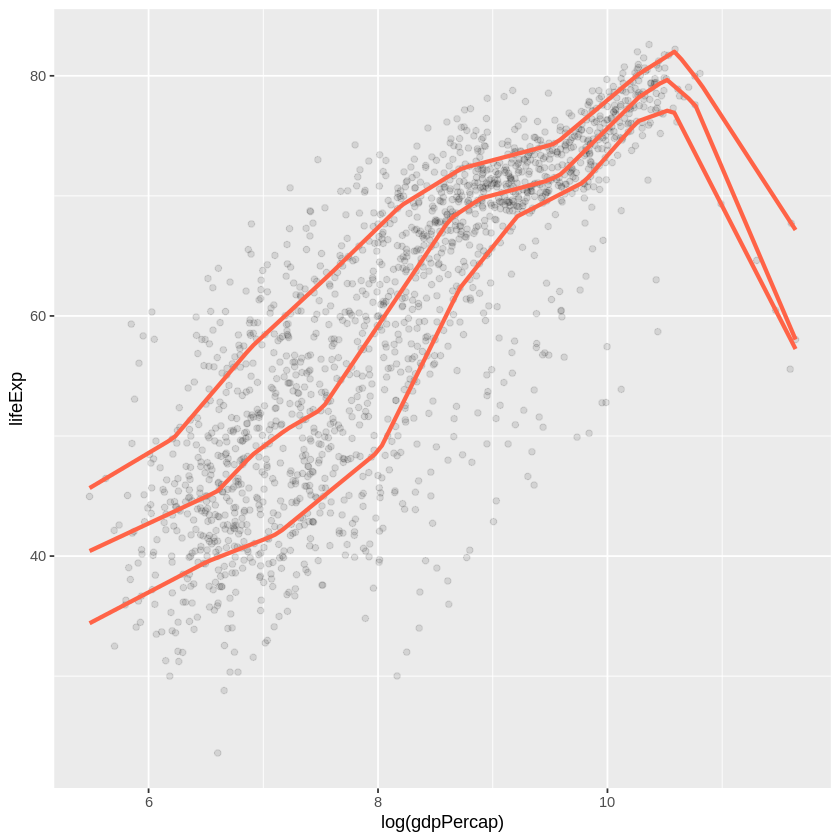

In [ ]:
library(tidyverse)
library(socviz)
library(gapminder)
library(quantreg)

p <- ggplot(data = gapminder, 
            mapping = aes(x = log(gdpPercap), y = lifeExp))

p + geom_point(alpha = 0.1) + 
    geom_smooth(color = "tomato", fill = "tomato", method = MASS::rlm) +
    geom_smooth(color = "steelblue", fill = "steelblue", method = "lm")
  
p + geom_point(alpha = 0.1) +
    geom_smooth(color = "tomato", fill = "tomato", method = MASS::rlm) +
    geom_smooth(color = "steelblue", fill = "steelblue", method = "lm")
  
p + geom_point(alpha = 0.1) + 
    geom_smooth(color = "tomato", meothd = "lm", linewidth = 1.2,
                formula = y ~ splines::bs(x, 3), se = FALSE)

p + geom_point(alpha = 0.1) + 
    geom_quantile(color = "tomato", linewidth = 1.2, method = "rqss",
                  lambda = 1, quantiles = c(0.20, 0.5, 0.85))

In [ ]:
model_colors <- RColorBrewer::brewer.pal(3, "Set1")
model_colors

[1] "#E41A1C" "#377EB8" "#4DAF4A"

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


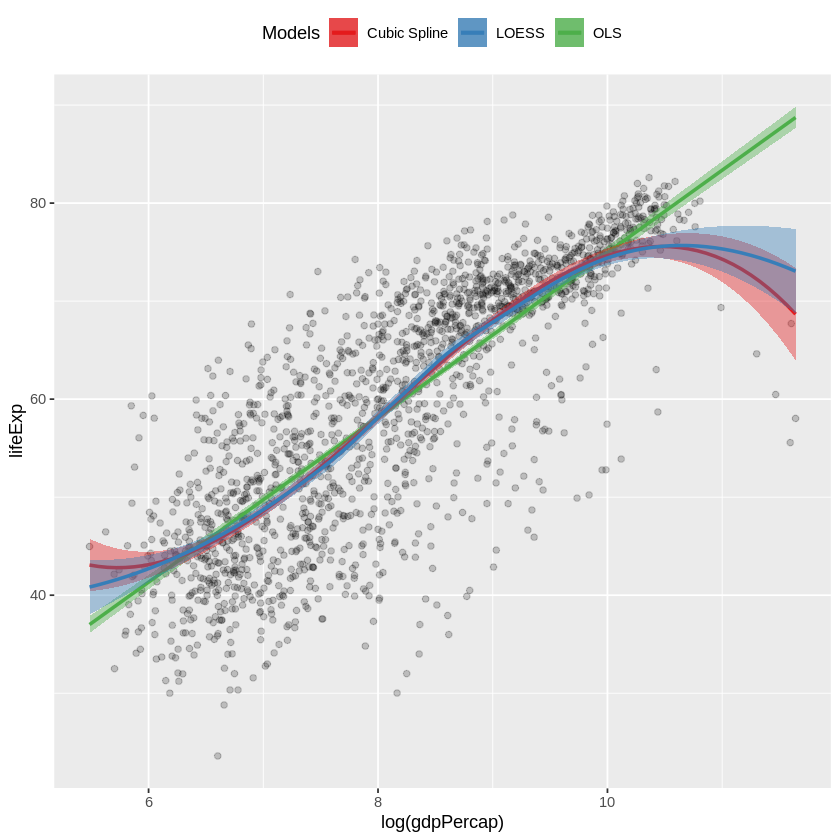

In [ ]:
p0 <- ggplot(data = gapminder, 
             mapping = aes(x = log(gdpPercap), y= lifeExp))

p1 <- p0 + geom_point(alpha = 0.2) + 
           geom_smooth(method = "lm", aes(color = "OLS", fill = "OLS")) + 
           geom_smooth(method = "lm", formula = y ~ splines::bs(x, df = 3),
                       aes(color = "Cubic Spline", fill = "Cubic Spline")) +
           geom_smooth(method = "loess", aes(color = "LOESS", fill = "LOESS"))
         
p1 + scale_color_manual(name = "Models", values = model_colors) + 
     scale_fill_manual(name = "Models", values = model_colors) +
     theme(legend.position = "top")           

In [ ]:
out <- lm(formula = lifeExp ~ gdpPercap + pop + continent, data = gapminder)

In [ ]:
summary(out)


Call:
lm(formula = lifeExp ~ gdpPercap + pop + continent, data = gapminder)

Residuals:
    Min      1Q  Median      3Q     Max 
-49.161  -4.486   0.297   5.110  25.175 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)       4.781e+01  3.395e-01 140.819  < 2e-16 ***
gdpPercap         4.495e-04  2.346e-05  19.158  < 2e-16 ***
pop               6.570e-09  1.975e-09   3.326 0.000901 ***
continentAmericas 1.348e+01  6.000e-01  22.458  < 2e-16 ***
continentAsia     8.193e+00  5.712e-01  14.342  < 2e-16 ***
continentEurope   1.747e+01  6.246e-01  27.973  < 2e-16 ***
continentOceania  1.808e+01  1.782e+00  10.146  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 8.365 on 1697 degrees of freedom
Multiple R-squared:  0.5821,	Adjusted R-squared:  0.5806 
F-statistic: 393.9 on 6 and 1697 DF,  p-value: < 2.2e-16


#6.4 Generate Predictions to Graph

In [ ]:
library(gapminder)

min_gdp <- min(gapminder$gdpPercap)
max_gdp <- max(gapminder$gdpPercap)
med_pop <- median(gapminder$pop)

pred_df <- expand.grid(gdpPercap = (seq(from = min_gdp, to = max_gdp,
    length.out = 100)), pop = med_pop, continent = c("Africa", 
    "Americas", "Asia", "Europe", "Oceania"))

dim(pred_df)

[1] 500   3

In [ ]:
head(pred_df)

,gdpPercap,pop,continent
,<dbl>,<dbl>,<fct>
1,241.1659,7023596,Africa
2,1385.4282,7023596,Africa
3,2529.6905,7023596,Africa
4,3673.9528,7023596,Africa
5,4818.2150,7023596,Africa
6,5962.4773,7023596,Africa


In [ ]:
pred_out <- predict(object = out, newdata = pred_df, interval = "predict")
head(pred_out)

,fit,lwr,upr
1,47.96863,31.54775,64.38951
2,48.48298,32.06231,64.90365
3,48.99733,32.57670,65.41797
4,49.51169,33.09092,65.93245
5,50.02604,33.60497,66.44711
6,50.54039,34.11885,66.96193


In [ ]:
pred_df <- cbind(pred_df, pred_out)
head(pred_df)

,gdpPercap,pop,continent,fit,lwr,upr
,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>
1,241.1659,7023596,Africa,47.96863,31.54775,64.38951
2,1385.4282,7023596,Africa,48.48298,32.06231,64.90365
3,2529.6905,7023596,Africa,48.99733,32.57670,65.41797
4,3673.9528,7023596,Africa,49.51169,33.09092,65.93245
5,4818.2150,7023596,Africa,50.02604,33.60497,66.44711
6,5962.4773,7023596,Africa,50.54039,34.11885,66.96193


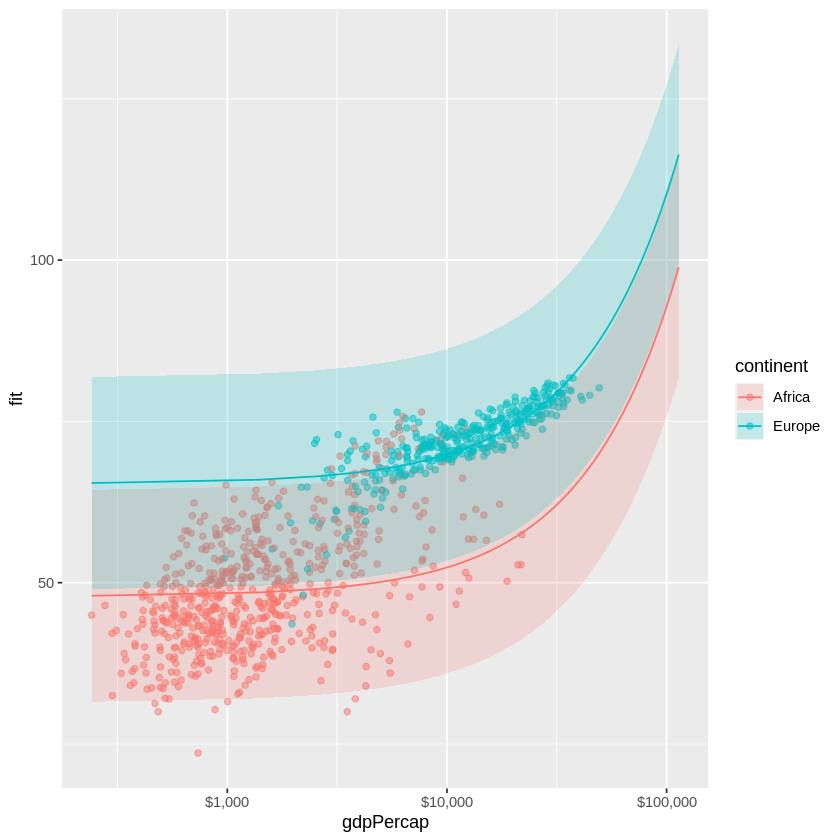

In [ ]:
p <- ggplot(data = subset(pred_df, continent %in% c("Europe", "Africa")),
            aes(x = gdpPercap,
                y = fit, ymin = lwr, ymax = upr,
                color = continent,
                fill = continent,
                group = continent))

p + geom_point(data = subset(gapminder,
                             continent %in% c("Europe", "Africa")),
               aes(x = gdpPercap, y = lifeExp, 
                   color = continent),
                             alpha = 0.5,
                             inherit.aes = FALSE) +
    geom_line() +
    geom_ribbon(alpha = 0.2, color = FALSE) +
    scale_x_log10(labels = scales::dollar)

6.5 Tidy Model Objects with Broom

In [ ]:
library(broom)

out_comp <- tidy(out)
out_comp %>% round_df()

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),47.81,0.34,140.82,0
gdpPercap,0.00,0.00,19.16,0
pop,0.00,0.00,3.33,0
continentAmericas,13.48,0.60,22.46,0
continentAsia,8.19,0.57,14.34,0
continentEurope,17.47,0.62,27.97,0
continentOceania,18.08,1.78,10.15,0


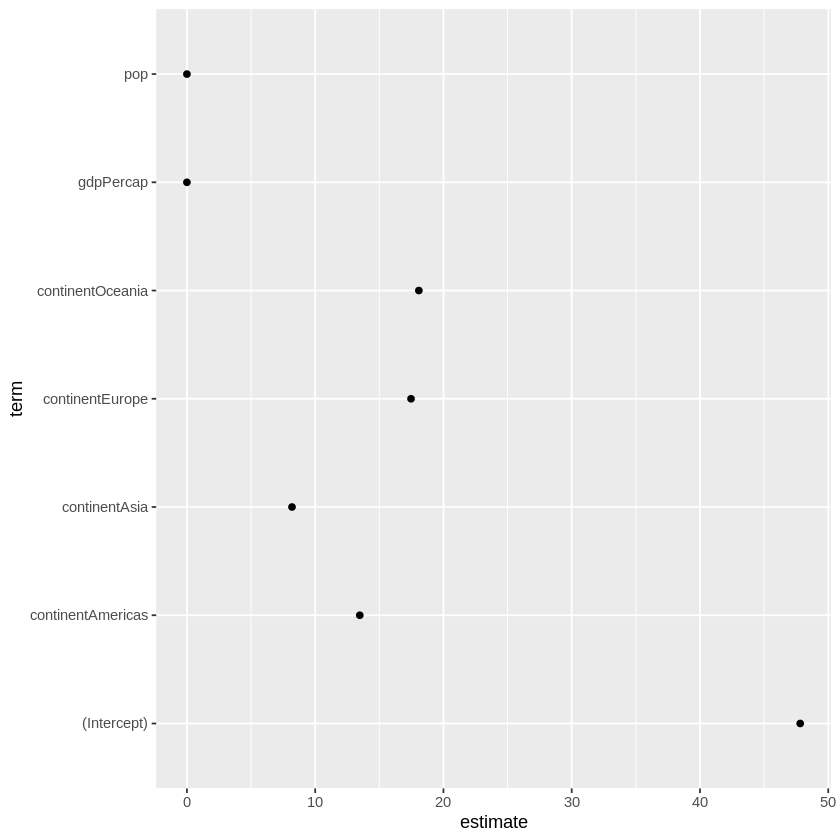

In [ ]:
p <- ggplot(out_comp, mapping = aes(x = term, y = estimate))
p + geom_point() + coord_flip()

In [ ]:
out_conf <- tidy(out, conf.int = TRUE)
out_conf %>% round_df()

term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),47.81,0.34,140.82,0,47.15,48.48
gdpPercap,0.00,0.00,19.16,0,0.00,0.00
pop,0.00,0.00,3.33,0,0.00,0.00
continentAmericas,13.48,0.60,22.46,0,12.30,14.65
continentAsia,8.19,0.57,14.34,0,7.07,9.31
continentEurope,17.47,0.62,27.97,0,16.25,18.70
continentOceania,18.08,1.78,10.15,0,14.59,21.58


In [ ]:
out_conf <- subset(out_conf, term %nin% "(Intercept)")
out_conf$nicelabs <- prefix_strip(out_conf$term, "continent")

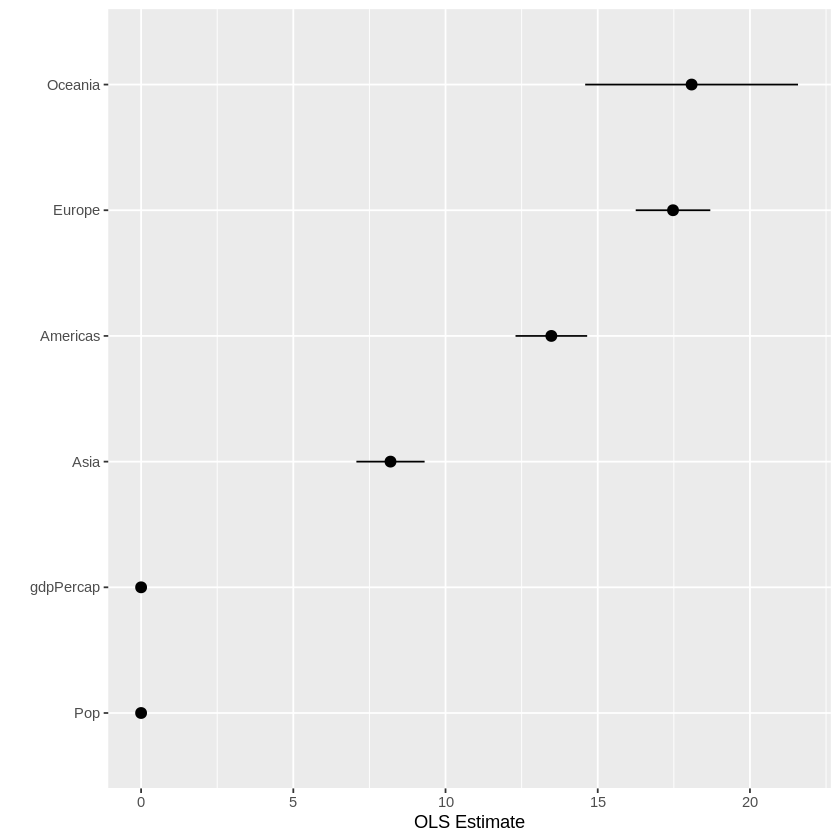

In [ ]:
p <- ggplot(out_conf, mapping = aes(x = reorder(nicelabs, estimate),
  y = estimate, ymin = conf.low, ymax = conf.high))

p + geom_pointrange() + coord_flip() + labs(x = "", y = "OLS Estimate")

In [ ]:
out_aug <- augment(out)
head(out_aug) %>% round_df()

lifeExp,gdpPercap,pop,continent,.fitted,.resid,.hat,.sigma,.cooksd,.std.resid
<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
28.80,779.45,8425333,Asia,56.41,-27.61,0,8.34,0.01,-3.31
30.33,820.85,9240934,Asia,56.44,-26.10,0,8.34,0.00,-3.13
32.00,853.10,10267083,Asia,56.46,-24.46,0,8.35,0.00,-2.93
34.02,836.20,11537966,Asia,56.46,-22.44,0,8.35,0.00,-2.69
36.09,739.98,13079460,Asia,56.43,-20.34,0,8.35,0.00,-2.44
38.44,786.11,14880372,Asia,56.46,-18.02,0,8.36,0.00,-2.16


In [ ]:
out_aug <- augment(out, data = gapminder)
head(out_aug) %>% round_df()

country,continent,year,lifeExp,pop,gdpPercap,.fitted,.resid,.hat,.sigma,.cooksd,.std.resid
<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Afghanistan,Asia,1952,28.80,8425333,779.45,56.41,-27.61,0,8.34,0.01,-3.31
Afghanistan,Asia,1957,30.33,9240934,820.85,56.44,-26.10,0,8.34,0.00,-3.13
Afghanistan,Asia,1962,32.00,10267083,853.10,56.46,-24.46,0,8.35,0.00,-2.93
Afghanistan,Asia,1967,34.02,11537966,836.20,56.46,-22.44,0,8.35,0.00,-2.69
Afghanistan,Asia,1972,36.09,13079460,739.98,56.43,-20.34,0,8.35,0.00,-2.44
Afghanistan,Asia,1977,38.44,14880372,786.11,56.46,-18.02,0,8.36,0.00,-2.16


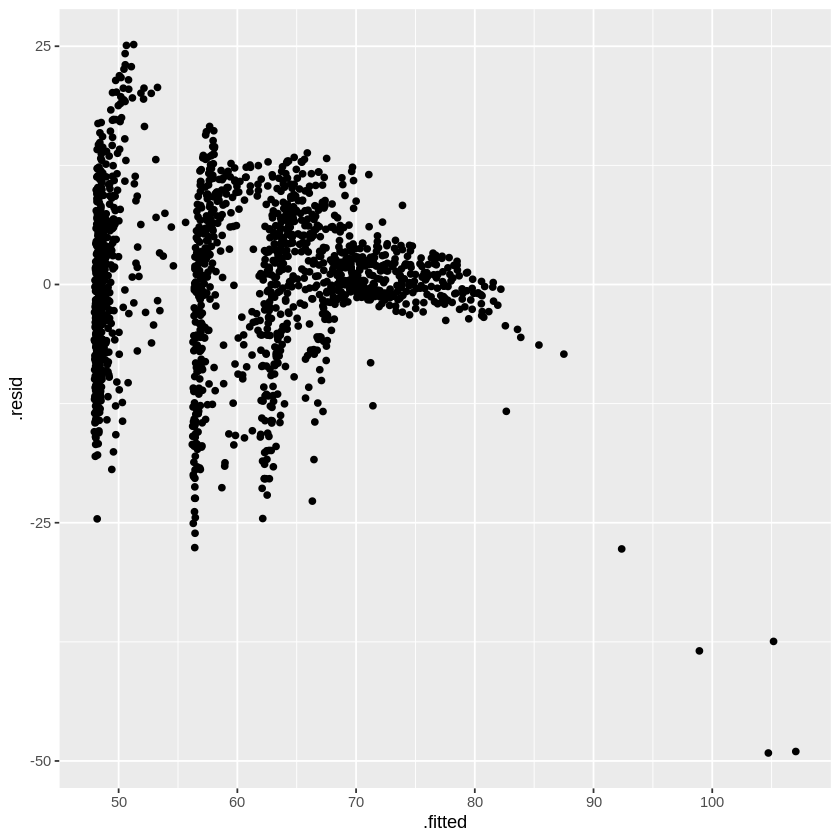

In [ ]:
p <- ggplot(data = out_aug, mapping = aes(x = .fitted, y = .resid))
p + geom_point()

# Get model-level statistics with glance()

In [ ]:
glance(out) %>% round_df()

r.squared,adj.r.squared,sigma,statistic,p.value,df,logLik,AIC,BIC,deviance,df.residual,nobs
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.58,0.58,8.37,393.91,0,6,-6033.83,12083.65,12127.18,118754.5,1697,1704


In [ ]:
library(survival)

out_cph <- coxph(Surv(time, status) ~ age + sex, data = lung)
out_surv <- survfit(out_cph)

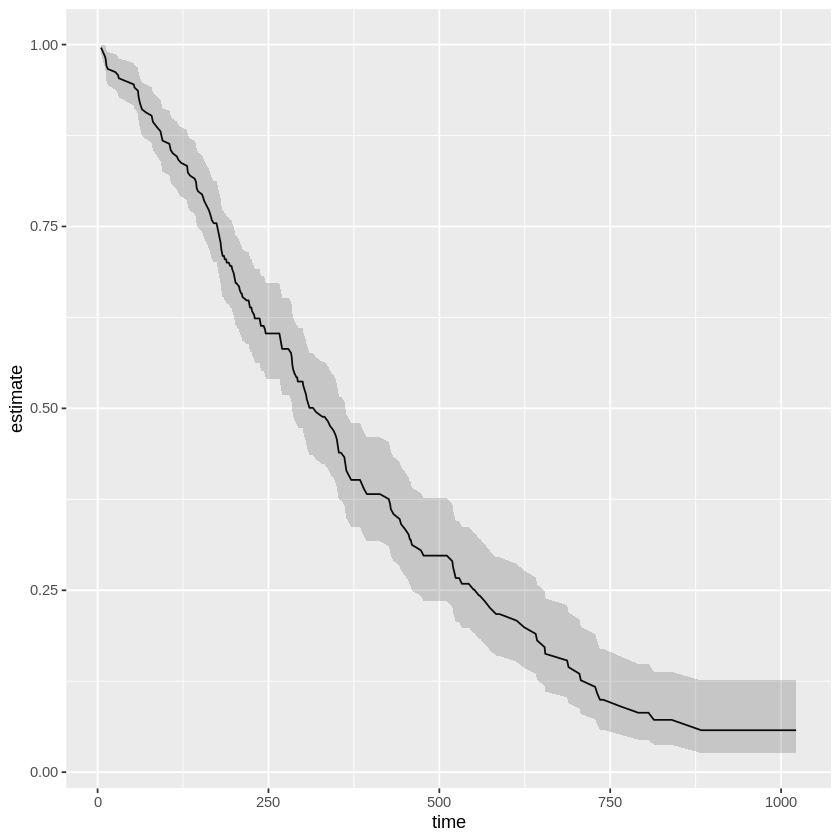

In [ ]:
out_tidy <- tidy(out_surv)

p <- ggplot(data = out_tidy, mapping = aes(time, estimate))
p + geom_line() + geom_ribbon(mapping = aes(ymin = conf.low,
    ymax = conf.high), alpha = 0.2)

#6.6 Grouped Analysis and List Columns

In [ ]:
eu77 <- gapminder %>% filter(continent == "Europe", year == 1977)

In [ ]:
fit <- lm(lifeExp ~ log(gdpPercap), data = eu77)
summary(fit)


Call:
lm(formula = lifeExp ~ log(gdpPercap), data = eu77)

Residuals:
    Min      1Q  Median      3Q     Max 
-7.4956 -1.0306  0.0935  1.1755  3.7125 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)      29.489      7.161   4.118 0.000306 ***
log(gdpPercap)    4.488      0.756   5.936 2.17e-06 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.114 on 28 degrees of freedom
Multiple R-squared:  0.5572,	Adjusted R-squared:  0.5414 
F-statistic: 35.24 on 1 and 28 DF,  p-value: 2.173e-06


In [ ]:
out_le <- gapminder %>%
  group_by(continent, year) %>%
  nest()

out_le

continent,year,data
<fct>,<int>,<list>
Asia,1952,"1.000000e+00, 8.000000e+00, 9.000000e+00, 1.900000e+01, 2.500000e+01, 5.600000e+01, 5.900000e+01, 6.000000e+01, 6.100000e+01, 6.200000e+01, 6.400000e+01, 6.700000e+01, 6.800000e+01, 7.000000e+01, 7.100000e+01, 7.200000e+01, 7.300000e+01, 7.900000e+01, 8.400000e+01, 8.800000e+01, 9.000000e+01, 9.700000e+01, 9.800000e+01, 1.020000e+02, 1.100000e+02, 1.140000e+02, 1.200000e+02, 1.250000e+02, 1.260000e+02, 1.280000e+02, 1.380000e+02, 1.390000e+02, 1.400000e+02, 2.880100e+01, 5.093900e+01, 3.748400e+01, 3.941700e+01, 4.400000e+01, 6.096000e+01, 3.737300e+01, 3.746800e+01, 4.486900e+01, 4.532000e+01, 6.539000e+01, 6.303000e+01, 4.315800e+01, 5.005600e+01, 4.745300e+01, 5.556500e+01, 5.592800e+01, 4.846300e+01, 4.224400e+01, 3.631900e+01, 3.615700e+01, 3.757800e+01, 4.343600e+01, 4.775200e+01, 3.987500e+01, 6.039600e+01, 5.759300e+01, 4.588300e+01, 5.850000e+01, 5.084800e+01, 4.041200e+01, 4.316000e+01, 3.254800e+01, 8.425333e+06, 1.204470e+05, 4.688686e+07, 4.693836e+06, 5.562635e+08, 2.125900e+06, 3.720000e+08, 8.205200e+07, 1.727200e+07, 5.441766e+06, 1.620914e+06, 8.645902e+07, 6.079140e+05, 8.865488e+06, 2.094757e+07, 1.600000e+05, 1.439529e+06, 6.748378e+06, 8.006630e+05, 2.009300e+07, 9.182536e+06, 5.078330e+05, 4.134656e+07, 2.243869e+07, 4.005677e+06, 1.127000e+06, 7.982342e+06, 3.661549e+06, 8.550362e+06, 2.128940e+07, 2.624684e+07, 1.030585e+06, 4.963829e+06, 7.794453e+02, 9.867085e+03, 6.842442e+02, 3.684693e+02, 4.004486e+02, 3.054421e+03, 5.465657e+02, 7.496817e+02, 3.035326e+03, 4.129766e+03, 4.086522e+03, 3.216956e+03, 1.546908e+03, 1.088278e+03, 1.030592e+03, 1.083824e+05, 4.834804e+03, 1.831133e+03, 7.865669e+02, 3.310000e+02, 5.458657e+02, 1.828230e+03, 6.845971e+02, 1.272881e+03, 6.459555e+03, 2.315138e+03, 1.083532e+03, 1.643485e+03, 1.206948e+03, 7.577974e+02, 6.050665e+02, 1.515592e+03, 7.817176e+02"
Asia,1957,"1.000000e+00, 8.000000e+00, 9.000000e+00, 1.900000e+01, 2.500000e+01, 5.600000e+01, 5.900000e+01, 6.000000e+01, 6.100000e+01, 6.200000e+01, 6.400000e+01, 6.700000e+01, 6.800000e+01, 7.000000e+01, 7.100000e+01, 7.200000e+01, 7.300000e+01, 7.900000e+01, 8.400000e+01, 8.800000e+01, 9.000000e+01, 9.700000e+01, 9.800000e+01, 1.020000e+02, 1.100000e+02, 1.140000e+02, 1.200000e+02, 1.250000e+02, 1.260000e+02, 1.280000e+02, 1.380000e+02, 1.390000e+02, 1.400000e+02, 3.033200e+01, 5.383200e+01, 3.934800e+01, 4.136600e+01, 5.054896e+01, 6.475000e+01, 4.024900e+01, 3.991800e+01, 4.718100e+01, 4.843700e+01, 6.784000e+01, 6.550000e+01, 4.566900e+01, 5.408100e+01, 5.268100e+01, 5.803300e+01, 5.948900e+01, 5.210200e+01, 4.524800e+01, 4.190500e+01, 3.768600e+01, 4.008000e+01, 4.555700e+01, 5.133400e+01, 4.286800e+01, 6.317900e+01, 6.145600e+01, 4.828400e+01, 6.240000e+01, 5.363000e+01, 4.288700e+01, 4.567100e+01, 3.397000e+01, 9.240934e+06, 1.386550e+05, 5.136547e+07, 5.322536e+06, 6.374080e+08, 2.736300e+06, 4.090000e+08, 9.012400e+07, 1.979200e+07, 6.248643e+06, 1.944401e+06, 9.156301e+07, 7.465590e+05, 9.411381e+06, 2.261155e+07, 2.128460e+05, 1.647412e+06, 7.739235e+06, 8.821340e+05, 2.173184e+07, 9.682338e+06, 5.619770e+05, 4.667994e+07, 2.607219e+07, 4.419650e+06, 1.445929e+06, 9.128546e+06, 4.149908e+06, 1.016422e+07, 2.504192e+07, 2.899854e+07, 1.070439e+06, 5.498090e+06, 8.208530e+02, 1.163580e+04, 6.616375e+02, 4.340383e+02, 5.759870e+02, 3.629076e+03, 5.900620e+02, 8.589003e+02, 3.290258e+03, 6.229334e+03, 5.385278e+03, 4.317694e+03, 1.886081e+03, 1.571135e+03, 1.487594e+03, 1.135231e+05, 6.089787e+03, 1.810067e+03, 9.126626e+02, 3.500000e+02, 5.979364e+02, 2.242747e+03, 7.470835e+02, 1.547945e+03, 8.157591e+03, 2.843104e+03, 1.072547e+03, 2.117235e+03, 1.507861e+03, 7.935774e+02, 6.762854e+02, 1.827068e+03, 8.048305e+02"
Asia,1962,"1.000000e+00, 8.000000e+00, 9.000000e+00, 1.900000e+01, 2.500000e+01, 5.600000e+01, 5.900000e+01, 6.000000e+01, 6.100000e+01, 6.200000e+01, 6.400000e+01, 6.700000e+01, 6.800000e+01, 7.000000e+01, 7.100000e+01, 7.200000e+01, 7.300000

In [ ]:
out_le %>% filter(continent == "Europe" & year == 1977) %>% unnest()

Warning message:
“`cols` is now required when using `unnest()`.
ℹ Please use `cols = c(data)`.”


continent,year,country,lifeExp,pop,gdpPercap
<fct>,<int>,<fct>,<dbl>,<int>,<dbl>
Europe,1977,Albania,68.930,2509048,3533.004
Europe,1977,Austria,72.170,7568430,19749.422
Europe,1977,Belgium,72.800,9821800,19117.974
Europe,1977,Bosnia and Herzegovina,69.860,4086000,3528.481
Europe,1977,Bulgaria,70.810,8797022,7612.240
Europe,1977,Croatia,70.640,4318673,11305.385
Europe,1977,Czech Republic,70.710,10161915,14800.161
Europe,1977,Denmark,74.690,5088419,20422.901
Europe,1977,Finland,72.520,4738902,15605.423


In [ ]:
fit_ols <- function(df) {
  lm(lifeExp ~ log(gdpPercap), data = df)
}

out_le <- gapminder %>%
  group_by(continent, year) %>%
  nest() %>%
  mutate(model = map(data, fit_ols))

out_le

continent,year,data,model
<fct>,<int>,<list>,<list>
Asia,1952,"1.000000e+00, 8.000000e+00, 9.000000e+00, 1.900000e+01, 2.500000e+01, 5.600000e+01, 5.900000e+01, 6.000000e+01, 6.100000e+01, 6.200000e+01, 6.400000e+01, 6.700000e+01, 6.800000e+01, 7.000000e+01, 7.100000e+01, 7.200000e+01, 7.300000e+01, 7.900000e+01, 8.400000e+01, 8.800000e+01, 9.000000e+01, 9.700000e+01, 9.800000e+01, 1.020000e+02, 1.100000e+02, 1.140000e+02, 1.200000e+02, 1.250000e+02, 1.260000e+02, 1.280000e+02, 1.380000e+02, 1.390000e+02, 1.400000e+02, 2.880100e+01, 5.093900e+01, 3.748400e+01, 3.941700e+01, 4.400000e+01, 6.096000e+01, 3.737300e+01, 3.746800e+01, 4.486900e+01, 4.532000e+01, 6.539000e+01, 6.303000e+01, 4.315800e+01, 5.005600e+01, 4.745300e+01, 5.556500e+01, 5.592800e+01, 4.846300e+01, 4.224400e+01, 3.631900e+01, 3.615700e+01, 3.757800e+01, 4.343600e+01, 4.775200e+01, 3.987500e+01, 6.039600e+01, 5.759300e+01, 4.588300e+01, 5.850000e+01, 5.084800e+01, 4.041200e+01, 4.316000e+01, 3.254800e+01, 8.425333e+06, 1.204470e+05, 4.688686e+07, 4.693836e+06, 5.562635e+08, 2.125900e+06, 3.720000e+08, 8.205200e+07, 1.727200e+07, 5.441766e+06, 1.620914e+06, 8.645902e+07, 6.079140e+05, 8.865488e+06, 2.094757e+07, 1.600000e+05, 1.439529e+06, 6.748378e+06, 8.006630e+05, 2.009300e+07, 9.182536e+06, 5.078330e+05, 4.134656e+07, 2.243869e+07, 4.005677e+06, 1.127000e+06, 7.982342e+06, 3.661549e+06, 8.550362e+06, 2.128940e+07, 2.624684e+07, 1.030585e+06, 4.963829e+06, 7.794453e+02, 9.867085e+03, 6.842442e+02, 3.684693e+02, 4.004486e+02, 3.054421e+03, 5.465657e+02, 7.496817e+02, 3.035326e+03, 4.129766e+03, 4.086522e+03, 3.216956e+03, 1.546908e+03, 1.088278e+03, 1.030592e+03, 1.083824e+05, 4.834804e+03, 1.831133e+03, 7.865669e+02, 3.310000e+02, 5.458657e+02, 1.828230e+03, 6.845971e+02, 1.272881e+03, 6.459555e+03, 2.315138e+03, 1.083532e+03, 1.643485e+03, 1.206948e+03, 7.577974e+02, 6.050665e+02, 1.515592e+03, 7.817176e+02","15.83231, 4.159673, -14.72884, -3.149655, -5.503966, -0.9963051, 3.240493, 11.74904, -4.680453, -5.899884, -4.315877, -5.145648, 14.96814, 13.60338, -3.223004, 5.137793, 2.76134, -8.492148, 4.806705, 1.380355, -1.32367, -3.648226, -5.891122, -9.498046, 0.4458891, 2.182029, -12.45143, 12.33777, 12.69297, -0.7499191, 13.15127, 7.435327, -2.064424, -3.135932, -10.99395, -266.0559, -26.95474, -3.400234, 1.036664, 5.282978, 14.0238, -2.602405, -3.785711, -2.041828, -2.836398, 17.27619, 15.88407, -1.026017, 7.294576, 4.911897, -5.809347, 7.133975, 3.596626, 0.7959949, -1.627517, -3.813221, -7.281956, 2.54968, 4.356725, -10.09104, 14.58085, 14.84926, 1.453991, 15.31989, 9.550731, 0.0252488, -0.9412834, -8.874988, 2, 43.52984, 54.08866, 42.98797, 40.41331, 40.75951, 49.21096, 42.05345, 43.36788, 49.18488, 50.46565, 50.42186, 49.42662, 46.381, 44.91821, 44.69166, 64.05715, 51.1213, 47.08264, 43.56767, 39.96723, 42.04812, 47.07605, 42.99011, 45.56997, 52.32643, 48.05823, 44.90003, 46.63292, 45.34873, 43.41267, 42.47642, 46.29593, 43.54195, 0, 1, -5.744563, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, 0.1740777, -42.09615, -6.480015, -0.1080911, -0.203609, -0.1907652, 0.1227772, -0.1427608, -0.09399644, 0.1218095, 0.1693251, 0.1677006, 0.1307781, 0.01778796, -0.03648068, -0.04488541, 0.6735592, 0.1936491, 0.04381828, -0.08658457, -0.2201582, -0.1429586, 0.04357347, -0.1080116, -0.01230073, 0.2383588, 0.0800118, -0.0371551, 0.02713381, -0.02050874, -0.09233481, -0.1270689, 0.01463185, -0.08753892, 1.174078, 1.303736, 1, 2, 1e-07, 2, 31, lm(formula = lifeExp ~ log(gdpPercap), data = df), lifeExp ~ log(gdpPercap), 28.801, 50.939, 37.484, 39.417, 44, 60.96, 37.373, 37.468, 44.869, 45.32, 65.39, 63.03, 43.158, 50.056, 47.453, 55.565, 55.928, 48.463, 42.244, 36.319, 36.157, 37.5

In [ ]:
fit_ols <- function(df) {
  lm(lifeExp ~ log(gdpPercap), data = df)
}

out_tidy <- gapminder %>%
  group_by(continent, year) %>%
  nest() %>%
  mutate(model = map(data, fit_ols),
         tidied = map(model, tidy)) %>%
  unnest(tidied) %>%
  filter(term %nin% "(Intercept)" &
          continent %nin% "Oceania")

out_tidy %>% sample_n(5, replace = TRUE)

continent,year,data,model,term,estimate,std.error,statistic,p.value
<fct>,<int>,<list>,<list>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
Africa,1952,"3.000000e+00, 4.000000e+00, 1.100000e+01, 1.400000e+01, 1.700000e+01, 1.800000e+01, 2.000000e+01, 2.200000e+01, 2.300000e+01, 2.700000e+01, 2.800000e+01, 2.900000e+01, 3.100000e+01, 3.600000e+01, 3.900000e+01, 4.100000e+01, 4.200000e+01, 4.300000e+01, 4.600000e+01, 4.700000e+01, 4.900000e+01, 5.200000e+01, 5.300000e+01, 6.900000e+01, 7.400000e+01, 7.500000e+01, 7.600000e+01, 7.700000e+01, 7.800000e+01, 8.000000e+01, 8.100000e+01, 8.200000e+01, 8.600000e+01, 8.700000e+01, 8.900000e+01, 9.400000e+01, 9.500000e+01, 1.060000e+02, 1.080000e+02, 1.090000e+02, 1.110000e+02, 1.130000e+02, 1.170000e+02, 1.180000e+02, 1.210000e+02, 1.220000e+02, 1.270000e+02, 1.290000e+02, 1.310000e+02, 1.330000e+02, 1.410000e+02, 1.420000e+02, 4.307700e+01, 3.001500e+01, 3.822300e+01, 4.762200e+01, 3.197500e+01, 3.903100e+01, 3.852300e+01, 3.546300e+01, 3.809200e+01, 4.071500e+01, 3.914300e+01, 4.211100e+01, 4.047700e+01, 3.481200e+01, 4.189300e+01, 3.448200e+01, 3.592800e+01, 3.407800e+01, 3.700300e+01, 3.000000e+01, 4.314900e+01, 3.360900e+01, 3.250000e+01, 4.227000e+01, 4.213800e+01, 3.848000e+01, 4.272300e+01, 3.668100e+01, 3.625600e+01, 3.368500e+01, 4.054300e+01, 5.098600e+01, 4.287300e+01, 3.128600e+01, 4.172500e+01, 3.744400e+01, 3.632400e+01, 5.272400e+01, 4.000000e+01, 4.647100e+01, 3.727800e+01, 3.033100e+01, 3.297800e+01, 4.500900e+01, 3.863500e+01, 4.140700e+01, 4.121500e+01, 3.859600e+01, 4.460000e+01, 3.997800e+01, 4.203800e+01, 4.845100e+01, 9.279525e+06, 4.232095e+06, 1.738315e+06, 4.423080e+05, 4.469979e+06, 2.445618e+06, 5.009067e+06, 1.291695e+06, 2.682462e+06, 1.539360e+05, 1.410000e+07, 8.548850e+05, 2.977019e+06, 6.314900e+04, 2.222331e+07, 2.169640e+05, 1.438760e+06, 2.086094e+07, 4.207020e+05, 2.843200e+05, 5.581001e+06, 2.664249e+06, 5.806530e+05, 6.464046e+06, 7.487470e+05, 8.633080e+05, 1.019729e+06, 4.762912e+06, 2.917802e+06, 3.838168e+06, 1.022556e+06, 5.165560e+05, 9.939217e+06, 6.446316e+06, 4.858310e+05, 3.379468e+06, 3.311910e+07, 2.577000e+05, 2.534927e+06, 6.001100e+04, 2.755589e+06, 2.143249e+06, 2.526994e+06, 1.426494e+07, 8.504667e+06, 2.902430e+05, 8.322925e+06, 1.219113e+06, 3.647735e+06, 5.824797e+06, 2.672000e+06, 3.080907e+06, 2.449008e+03, 3.520610e+03, 1.062752e+03, 8.512411e+02, 5.432552e+02, 3.392965e+02, 1.172668e+03, 1.071311e+03, 1.178666e+03, 1.102991e+03, 7.805423e+02, 2.125621e+03, 1.388595e+03, 2.669529e+03, 1.418822e+03, 3.756431e+02, 3.289406e+02, 3.621463e+02, 4.293476e+03, 4.852307e+02, 9.112989e+02, 5.101965e+02, 2.998503e+02, 8.535409e+02, 2.988462e+02, 5.755730e+02, 2.387548e+03, 1.443012e+03, 3.691651e+02, 4.523370e+02, 7.431159e+02, 1.967956e+03, 1.688204e+03, 4.685260e+02, 2.423780e+03, 7.618794e+02, 1.077282e+03, 2.718885e+03, 4.933239e+02, 8.795836e+02, 1.450357e+03, 8.797877e+02, 1.135750e+03, 4.725296e+03, 1.615991e+03, 1.148377e+03, 7.166501e+02, 8.598087e+02, 1.468476e+03, 7.347535e+02, 1.147389e+03, 4.068841e+02","23.0526, 2.337502, 1.78385, -12.12655, -1.118753, 8.798989, -5.798201, 2.358074, -1.048808, -3.897502, -1.491734, 1.286377, 0.522666, 1.148885, 0.5101279, -6.682687, 1.87579, -2.428803, -0.6724705, -2.747271, -5.602455, -7.509168, 4.166629, -4.017444, -3.884033, 3.440683, 5.761808, 0.5717227, 1.489261, -3.375726, -0.6141408, -3.660083, 2.037524, 10.20403, 2.449444, -6.141279, 0.4560545, -1.119765, -3.049494, 11.18649, 2.452166, 7.571429, -2.790594, -8.569114, -6.519036, 2.179534, -1.686369, 1.88412, 2.794292, -0.2504193, 4.502385, 1.498977, 2.517131, 11.35346, -282.2101, -11.85182, -1.383803, 8.095213, -7.389853, -0.1641358, -1.119289, -4.146695, -1.552128, 1.094798, -0.3525237, 2.254256, 0.7737726, -5.126893, 2.182008, -4.749828, -3.255959, -5.140635, -3.107229, -9.324126, 3.597632, -5.733216, -6.650574, 2.742241, 2.988636, -0.9056889, 2.824358, -3.036087, -2.969556, -5.613816, 1.065193, 11.15704, 3.099329, -8.025495, 1.820928, -2.0427

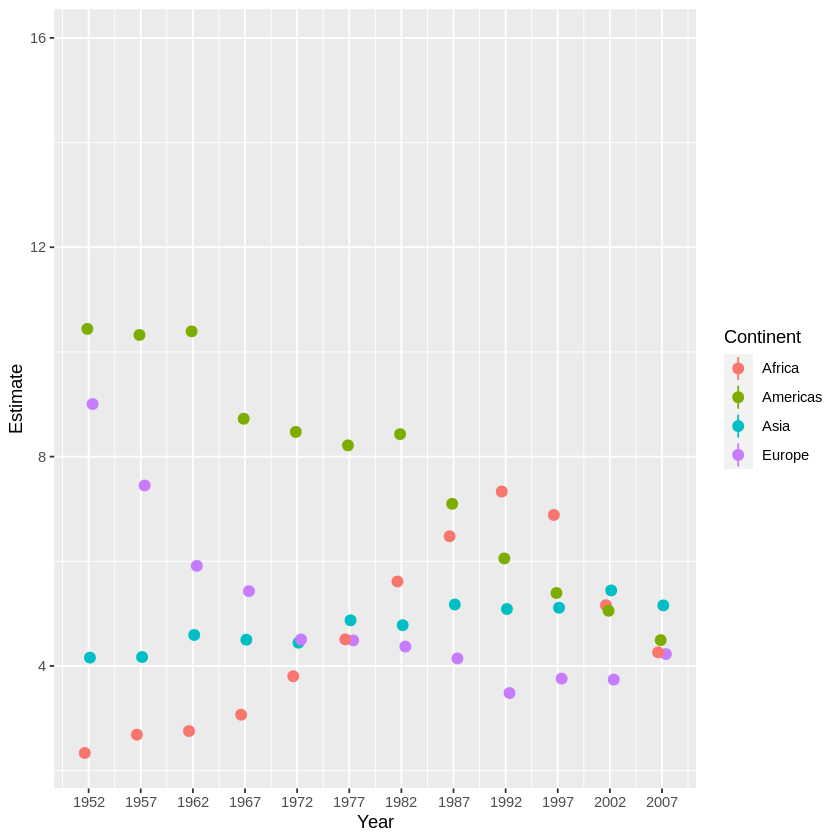

In [ ]:
p <- ggplot(data = out_tidy,
            mapping = aes(x = year, y = estimate,
                          ymin = estimate + 2*std.error,
                          ymax = estimate + 2*std.error,
                          group = continent, color = continent))

p + geom_pointrange(position = position_dodge(width = 1)) + 
    scale_x_continuous(breaks = unique(gapminder$year)) +
    labs(x = "Year", y = "Estimate", color = "Continent")

# 6.7 Plot Marginal Effects

In [ ]:
devtools::install_github("leeper/margins")

prediction (NA -> 0.3.14) [CRAN]


Installing 1 packages: prediction

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpVkYwKH/remotesc0302a20c7/leeper-margins-bd37423/DESCRIPTION’ ... OK
* preparing ‘margins’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘margins_0.3.26.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(margins)

gss_sm$polviews_m <- relevel(gss_sm$polviews, ref = "Moderate")

out_bo <- glm(obama ~ polviews_m + sex*race,
              family = "binomial", data = gss_sm)

summary(out_bo)


Call:
glm(formula = obama ~ polviews_m + sex * race, family = "binomial", 
    data = gss_sm)

Coefficients:
                                  Estimate Std. Error z value Pr(>|z|)    
(Intercept)                       0.296493   0.134091   2.211  0.02703 *  
polviews_mExtremely Liberal       2.372950   0.525045   4.520 6.20e-06 ***
polviews_mLiberal                 2.600031   0.356666   7.290 3.10e-13 ***
polviews_mSlightly Liberal        1.293172   0.248435   5.205 1.94e-07 ***
polviews_mSlightly Conservative  -1.355277   0.181291  -7.476 7.68e-14 ***
polviews_mConservative           -2.347463   0.200384 -11.715  < 2e-16 ***
polviews_mExtremely Conservative -2.727384   0.387210  -7.044 1.87e-12 ***
sexFemale                         0.254866   0.145370   1.753  0.07956 .  
raceBlack                         3.849526   0.501319   7.679 1.61e-14 ***
raceOther                        -0.002143   0.435763  -0.005  0.99608    
sexFemale:raceBlack              -0.197506   0.660066  -0.299  0.

In [ ]:
bo_m <- margins(out_bo)
summary(bo_m)

,factor,AME,SE,z,p,lower,upper
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,polviews_mConservative,-0.41188222,0.02832869,-14.539400,6.818737e-48,-0.467405438,-0.35635900
2,polviews_mExtremely Conservative,-0.45376935,0.04202683,-10.797134,3.551145e-27,-0.536140431,-0.37139827
3,polviews_mExtremely Liberal,0.26805480,0.02945789,9.099593,9.067126e-20,0.210318396,0.32579120
4,polviews_mLiberal,0.27683785,0.02292918,12.073604,1.456149e-33,0.231897478,0.32177822
5,polviews_mSlightly Conservative,-0.26578277,0.03297706,-8.059625,7.652878e-16,-0.330416626,-0.20114891
6,polviews_mSlightly Liberal,0.19328735,0.03025024,6.389613,1.663057e-10,0.133997967,0.25257674
7,raceBlack,0.40322793,0.01726387,23.356755,1.176699e-120,0.369391372,0.43706449
8,raceOther,0.12474996,0.03862584,3.229702,1.239192e-03,0.049044708,0.20045521
9,sexFemale,0.04428648,0.01766336,2.507251,1.216744e-02,0.009666921,0.07890603


In [ ]:
bo_gg <- as_tibble(summary(bo_m))
prefixes <- c("polviews_m", "sex")
bo_gg$factor <- prefix_strip(bo_gg$factor, prefixes)
bo_gg$factor <- prefix_replace(bo_gg$factor, "race", "Race: ")

bo_gg %>% select(factor, AME, lower, upper)

factor,AME,lower,upper
<chr>,<dbl>,<dbl>,<dbl>
Conservative,-0.41188222,-0.467405438,-0.35635900
Extremely Conservative,-0.45376935,-0.536140431,-0.37139827
Extremely Liberal,0.26805480,0.210318396,0.32579120
Liberal,0.27683785,0.231897478,0.32177822
Slightly Conservative,-0.26578277,-0.330416626,-0.20114891
Slightly Liberal,0.19328735,0.133997967,0.25257674
Race: Black,0.40322793,0.369391372,0.43706449
Race: Other,0.12474996,0.049044708,0.20045521
Female,0.04428648,0.009666921,0.07890603


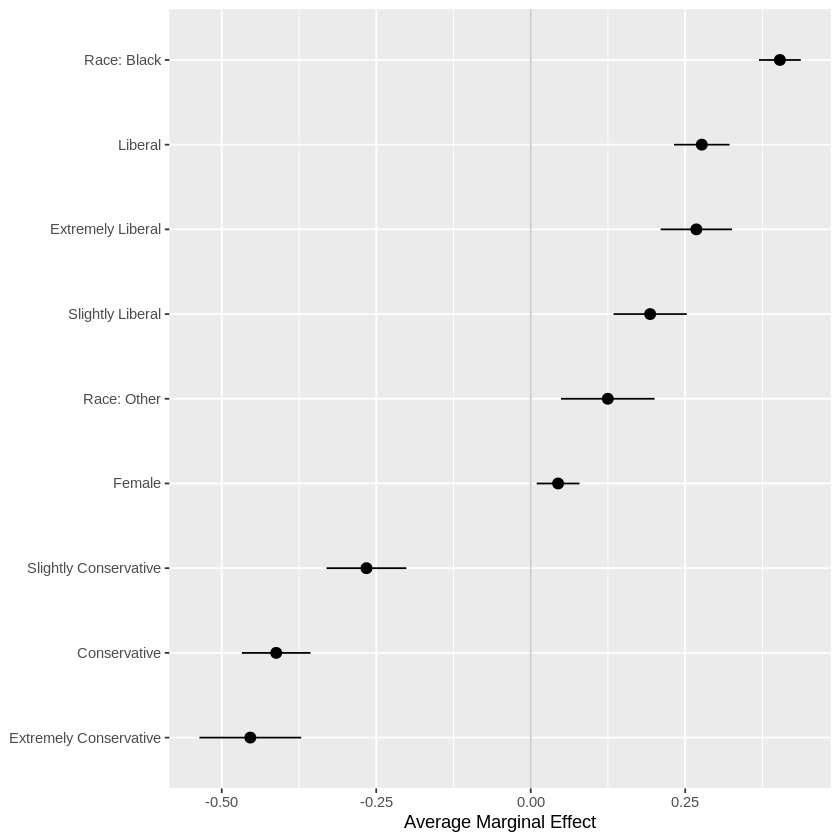

In [ ]:
p <- ggplot(data = bo_gg, aes(x = reorder(factor, AME),
                              y = AME, ymin = lower, ymax = upper))

p + geom_hline(yintercept = 0, color = "gray80") + 
    geom_pointrange() + coord_flip() +
    labs(x = NULL, y = "Average Marginal Effect")

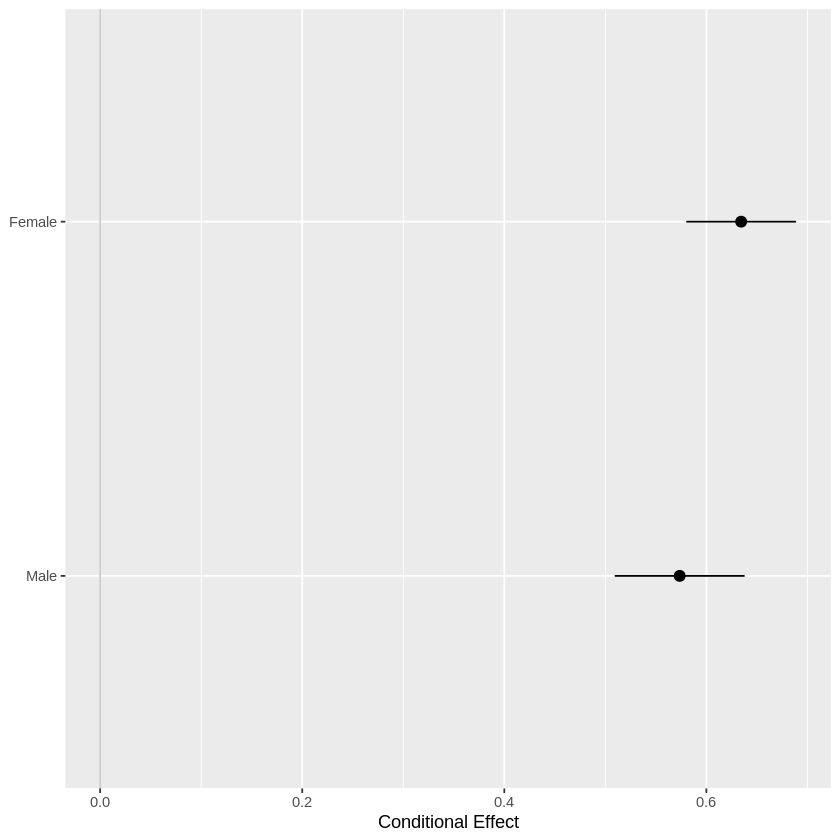

In [ ]:
pv_cp <- cplot(out_bo, x = "sex", draw = FALSE)

p <- ggplot(data = pv_cp, aes(x = reorder(xvals, yvals), 
                              y = yvals, ymin = lower, ymax = upper))


p + geom_hline(yintercept = 0, color = "gray80") + 
    geom_pointrange() + coord_flip() + 
    labs(x = NULL, y = "Conditional Effect")

#6.8 Plots from Complex Surveys

In [ ]:
install.packages('survey')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘Rcpp’, ‘minqa’, ‘numDeriv’, ‘mitools’




In [ ]:
install.packages('srvyr')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(survey)
library(srvyr)

Loading required package: grid

Loading required package: Matrix

Loading required package: survival


Attaching package: ‘survey’


The following object is masked from ‘package:graphics’:

    dotchart



Attaching package: ‘srvyr’


The following object is masked from ‘package:stats’:

    filter




In [ ]:
library(socviz)

options(survey.lonely.psu = "adjust")
options(na.action = "na.pass")

gss_wt <- subset(gss_lon, year > 1974)  %>%
    mutate(stratvar = interaction(year, vstrat)) %>%
    as_survey_design(ids = vpsu, 
                     strata = stratvar,
                     weights = wtssall,
                     nest = TRUE)

In [ ]:
out_grp <- gss_wt %>%
   filter(year %in% seq(1976, 2016, by = 4)) %>%
   group_by(year, race, degree) %>%
   summarize(prop = survey_mean(na.rm = TRUE))
 
out_grp

year,race,degree,prop,prop_se
<dbl>,<fct>,<fct>,<dbl>,<dbl>
1976,White,Lt High School,0.327374563,0.015971569
1976,White,High School,0.516783257,0.016094939
1976,White,Junior College,0.012838227,0.002977244
1976,White,Bachelor,0.100922723,0.009550091
1976,White,Graduate,0.039228299,0.006423825
1976,White,NA,0.002852931,0.001505726
1976,Black,Lt High School,0.557691104,0.060316859
1976,Black,High School,0.334614504,0.047553539
1976,Black,Junior College,0.042308738,0.019172301


In [ ]:
out_mrg <- gss_wt %>%
  filter(year %in% seq(1976, 2016, by = 4)) %>%
  mutate(racedeg = interaction(race, degree)) %>%
  group_by(year, racedeg) %>%
  summarize(prop = survey_mean(na.rm = TRUE))

out_mrg

year,racedeg,prop,prop_se
<dbl>,<fct>,<dbl>,<dbl>
1976,White.Lt High School,0.2972677912,0.0146335121
1976,Black.Lt High School,0.0469534682,0.0083665122
1976,Other.Lt High School,0.0019429058,0.0013778557
1976,White.High School,0.4692576480,0.0159198235
1976,Black.High School,0.0281720676,0.0059256402
1976,Other.High School,0.0032382208,0.0016559296
1976,White.Junior College,0.0116575683,0.0026778178
1976,Black.Junior College,0.0035620829,0.0016191414
1976,White.Bachelor,0.0916414359,0.0088288378


In [ ]:
library(tidyr)

out_mrg <- gss_wt %>% filter(year %in% seq(1976, 2016, by = 4)) %>%
  mutate(racedeg = interaction(race, degree)) %>% group_by(year, 
  racedeg) %>% summarize(prop = survey_mean(na.rm = TRUE)) %>%
  separate(racedeg, sep = "\\.", into = c("race", "degree"))

out_mrg


Attaching package: ‘tidyr’


The following objects are masked from ‘package:Matrix’:

    expand, pack, unpack




year,race,degree,prop,prop_se
<dbl>,<chr>,<chr>,<dbl>,<dbl>
1976,White,Lt High School,0.2972677912,0.0146335121
1976,Black,Lt High School,0.0469534682,0.0083665122
1976,Other,Lt High School,0.0019429058,0.0013778557
1976,White,High School,0.4692576480,0.0159198235
1976,Black,High School,0.0281720676,0.0059256402
1976,Other,High School,0.0032382208,0.0016559296
1976,White,Junior College,0.0116575683,0.0026778178
1976,Black,Junior College,0.0035620829,0.0016191414
1976,White,Bachelor,0.0916414359,0.0088288378


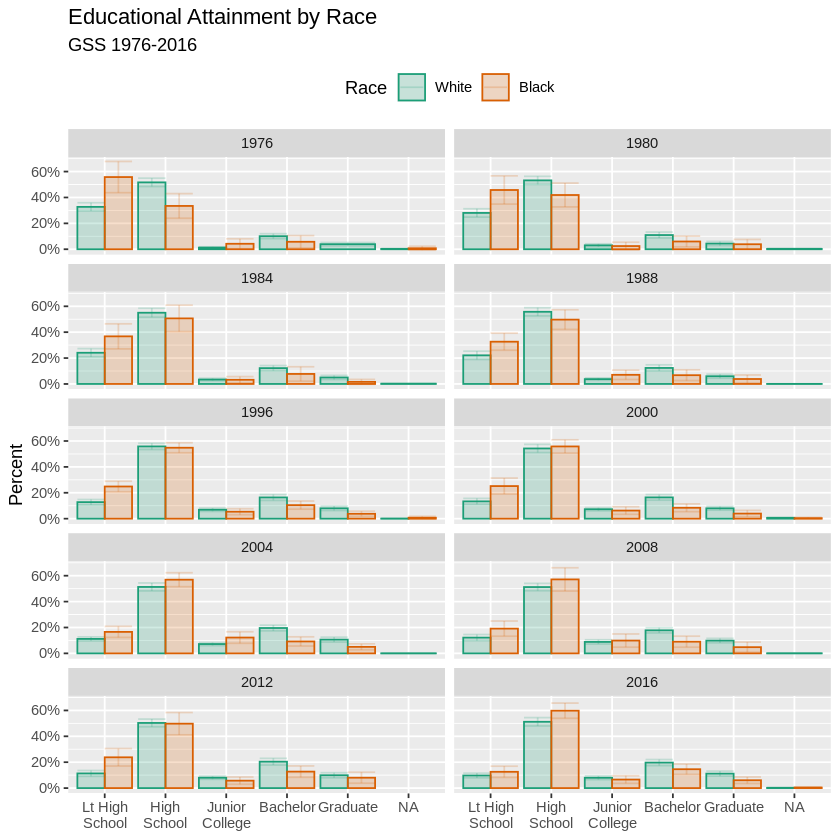

In [ ]:
library(tidyverse)

p <- ggplot(data = subset(out_grp, race %nin% "Other"),
            mapping = aes(x = degree, y = prop,
            ymin = prop - 2*prop_se,
            ymax = prop + 2*prop_se,
            fill = race,
            color = race,
            group = race))

dodge <- position_dodge(width = 0.9)

p + geom_col(position = dodge, alpha = 0.2) +
    geom_errorbar(position = dodge, alpha = 0.2) +
    scale_x_discrete(labels = scales::wrap_format(10)) +
    scale_y_continuous(labels = scales::percent) + 
    scale_color_brewer(type = "qual", palette = "Dark2") + 
    scale_fill_brewer(type = "qual", palette = "Dark2") + 
    labs(title = "Educational Attainment by Race",
         subtitle = "GSS 1976-2016",
         fill = "Race",
         color = "Race",
         x = NULL, y = "Percent") +
    facet_wrap(~ year, ncol = 2) + 
    theme(legend.position = "top")

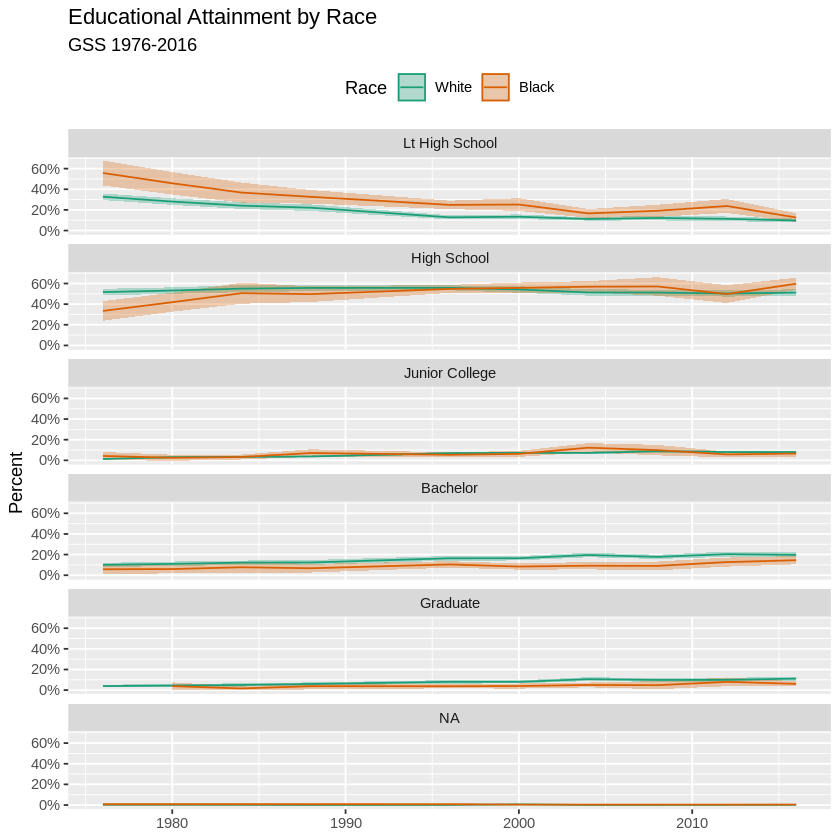

In [ ]:
p <- ggplot(data = subset(out_grp, race %nin% "Other"),
            mapping = aes(x = year, y = prop, ymin = prop - 2*prop_se,
                          ymax = prop + 2*prop_se, fill = race, color = race,
                          group = race))

p + geom_ribbon(alpha = 0.3, aes(color = NULL)) +
    geom_line() + 
    facet_wrap(~ degree, ncol = 1) + 
    scale_y_continuous(label = scales::percent) + 
    scale_color_brewer(type = "qual", palette = "Dark2") +
    scale_fill_brewer(type = "qual", palette = "Dark2") + 
    labs(title = "Educational Attainment by Race",
         subtitle = "GSS 1976-2016", fill = "Race",
         color = "Race", x = NULL, y = "Percent") +
    theme(legend.position = "top")

# Default plots for models

In [ ]:
install.packages('gapminder')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(gapminder)
out <- lm(formula = lifeExp ~ log(gdpPercap) + pop + continent, data = gapminder)

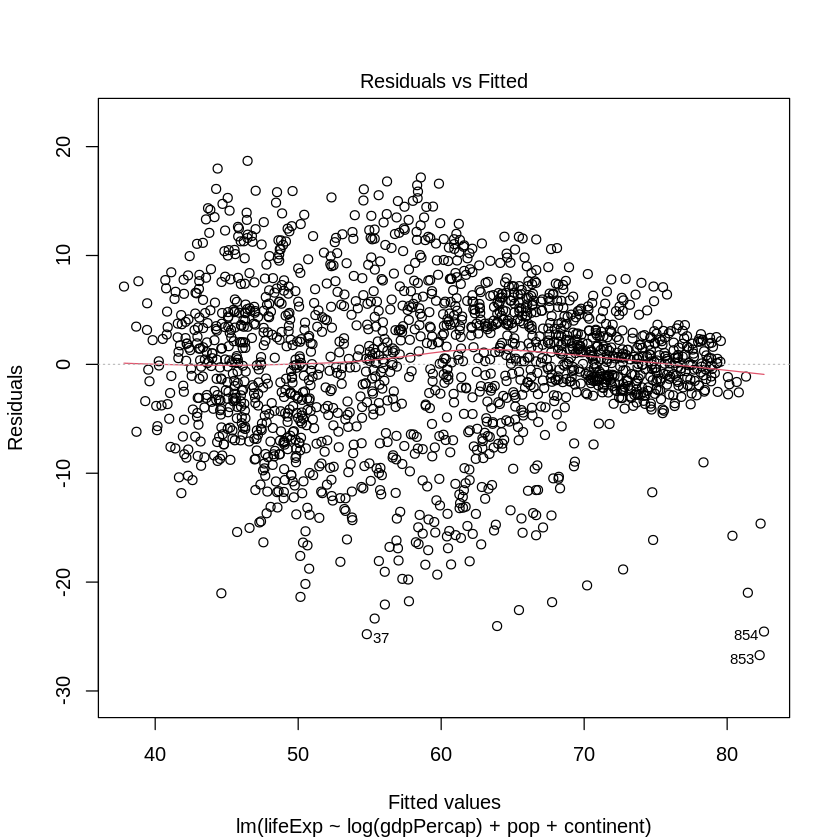

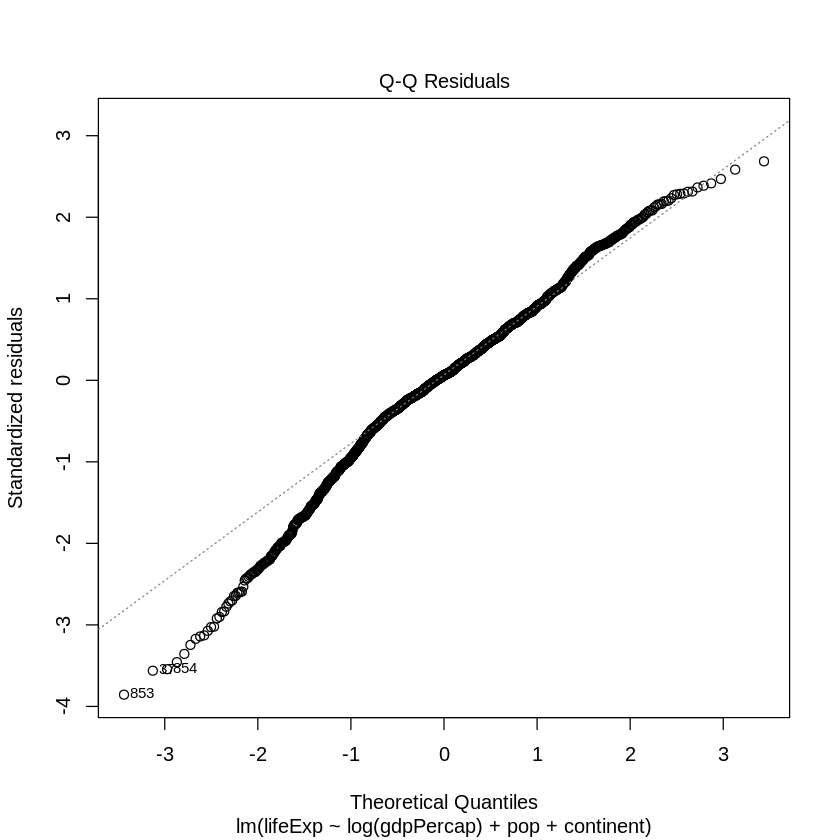

In [ ]:
plot(out, which = c(1,2), ask = FALSE)

In [ ]:
install.packages('coefplot')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘later’, ‘assertthat’, ‘htmlwidgets’, ‘zoo’, ‘xts’, ‘lazyeval’, ‘crosstalk’, ‘promises’, ‘plyr’, ‘reshape2’, ‘useful’, ‘dygraphs’, ‘plotly’




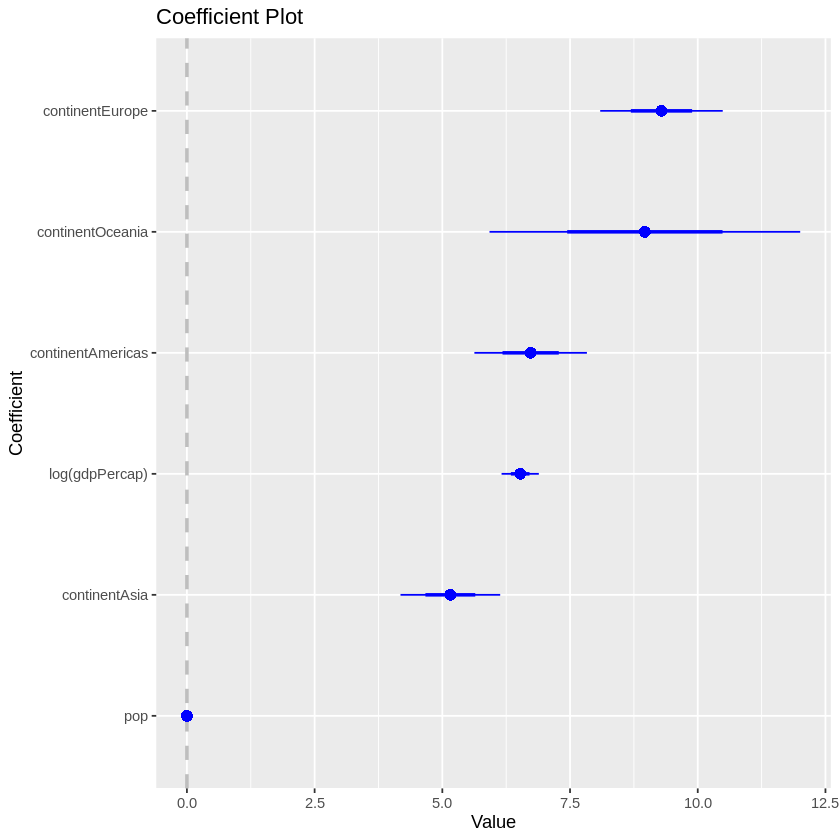

In [ ]:
library(coefplot)

out <- lm(formula = lifeExp ~ log(gdpPercap) + pop + continent, data = gapminder)
coefplot(out, sort = 'magnitude', intercept = FALSE)

In [ ]:
install.packages('GGally')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘reshape’




Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Warning message:
“Removed 34 rows containing non-finite values (`stat_density()`).”
Warning message:
“Removed 34 rows containing non-finite values (`stat_density2d()`).”
Warning message:
“Removed 37 rows containing non-finite values (`stat_density2d()`).”
Warning message:
“Removed 34 rows containing non-finite values (`stat_density2d()`).”
Warning message:
“Removed 34 rows containing non-finite values (`stat_boxplot()`).”
Warning message in geom_point(...):
“Ignoring unknown parameters: `combo`”
Warning message:
“Removed 34 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing non-finite values (`stat_density()`).”
Warning message:
“Removed 21 rows containing non-finite values (`stat_density2d()`).”
Warning message:
“Removed 17 rows containing non-finite values (`stat_density2d()`).”
Warning message:
“Removed 17 rows containing non-finite values (`stat_boxplot()`).”

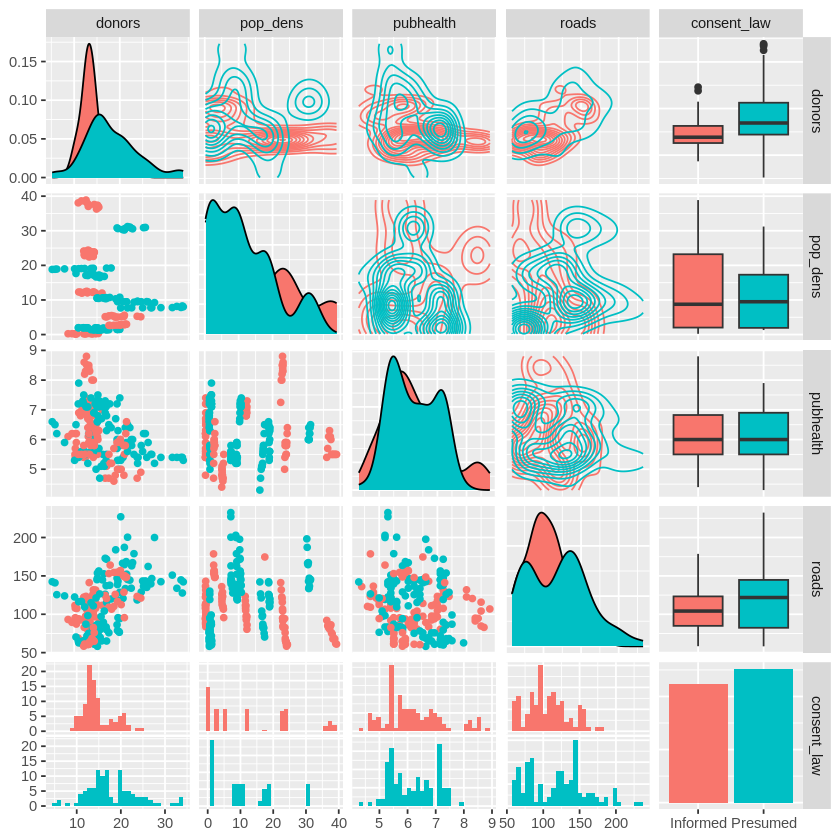

In [ ]:
library(GGally)

organdata_sm <- organdata %>% select(donors, pop_dens, pubhealth, 
  roads, consent_law)

ggpairs(data = organdata_sm, mapping = aes(color = consent_law), 
  upper = list(continuous = wrap("density"), combo = "box_no_facet"),
  lower = list(continuous = wrap("points", combo = wrap("dot_no_facet"))))

#7.1 Map U.S. State Level Data

In [ ]:
install.packages("dplyr")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(socviz)
election %>% select(state, total_vote,
                    r_points, pct_trump, party, census)

state,total_vote,r_points,pct_trump,party,census
<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Alabama,2123372,27.72,62.08,Republican,South
Alaska,318608,14.73,51.28,Republican,West
Arizona,2604657,3.50,48.08,Republican,West
Arkansas,1130635,26.92,60.57,Republican,South
California,14237893,-29.99,31.49,Democratic,West
Colorado,2780247,-4.91,43.25,Democratic,West
Connecticut,1644920,-13.64,40.93,Democratic,Northeast
Delaware,443814,-11.38,41.71,Democratic,South
District of Columbia,311268,-86.77,4.09,Democratic,South


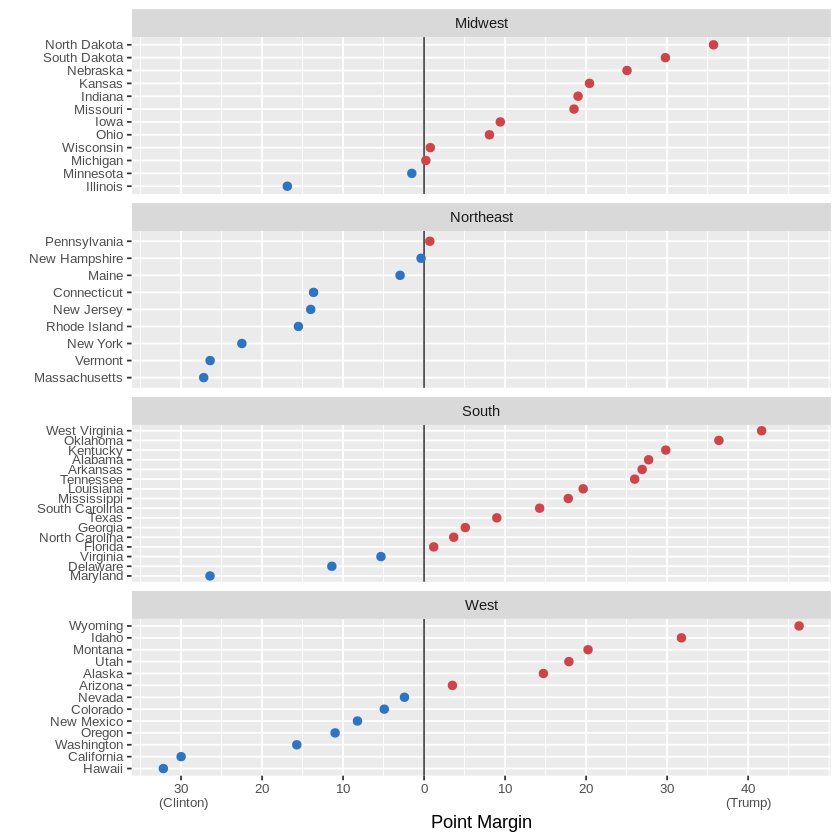

In [ ]:
library(tidyverse)
# Hex color codes for Dem Blue and Rep Red
party_colors <- c("#2E74C0", "#CB454A")

p0 <- ggplot(data = subset(election, st %nin% "DC"),
             mapping = aes(x = r_points,
                           y = reorder(state, r_points),
                           color = party))

p1 <- p0 + geom_vline(xintercept = 0, color = "gray30") + 
   geom_point(size = 2)

p2 <- p1 + scale_color_manual(values = party_colors)


p3 <- p2 + scale_x_continuous(breaks = c(-30, -20, -10, 0, 10, 20, 30, 40), 
                              labels = c("30\n (Clinton)", "20", "10", "0",
                                         "10", "20", "30", "40\n(Trump)"))

p3 + facet_wrap(~ census, ncol = 1, scales = "free_y") +
    guides(color = FALSE) + labs(x = "Point Margin", y = "") +
    theme(axis.text = element_text(size = 8))

In [ ]:
install.packages('maps')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(maps)
library(tidyverse)

us_states <- map_data("state")
head(us_states)


Attaching package: ‘maps’


The following object is masked from ‘package:purrr’:

    map




,long,lat,group,order,region,subregion
,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,-87.46201,30.38968,1,1,alabama,NA
2,-87.48493,30.37249,1,2,alabama,NA
3,-87.52503,30.37249,1,3,alabama,NA
4,-87.53076,30.33239,1,4,alabama,NA
5,-87.57087,30.32665,1,5,alabama,NA
6,-87.58806,30.32665,1,6,alabama,NA


In [ ]:
dim(us_states)

[1] 15537     6

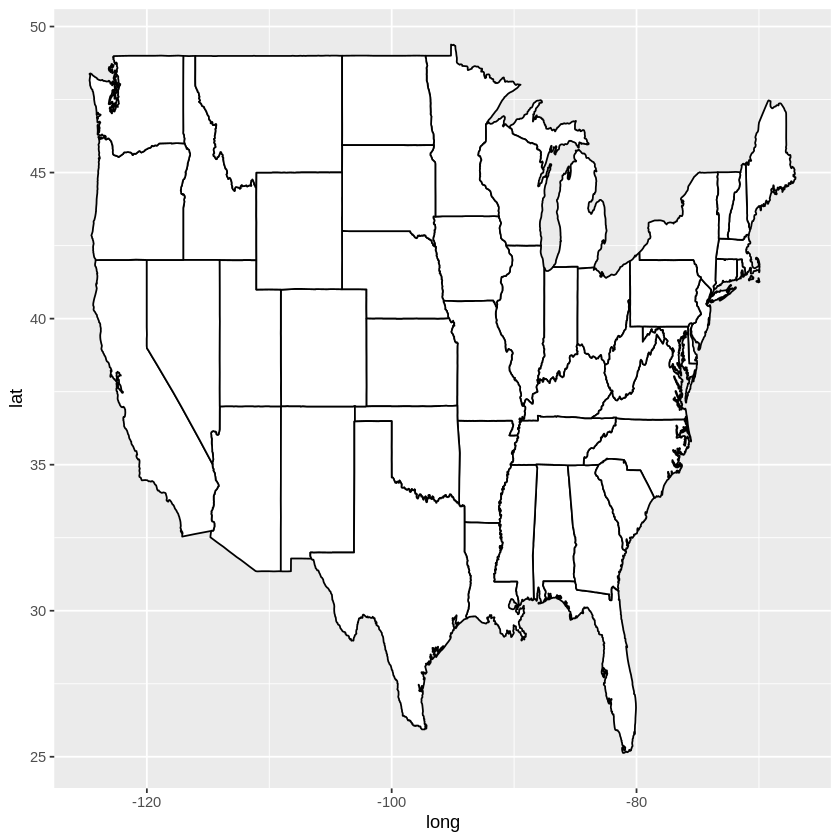

In [ ]:
p <- ggplot(data = us_states, mapping = aes(x = long, y = lat, group = group))
p + geom_polygon(fill = "white", color = "black")

Warning message:
“The `<scale>` argument of `guides()` cannot be `FALSE`. Use "none" instead as
of ggplot2 3.3.4.”


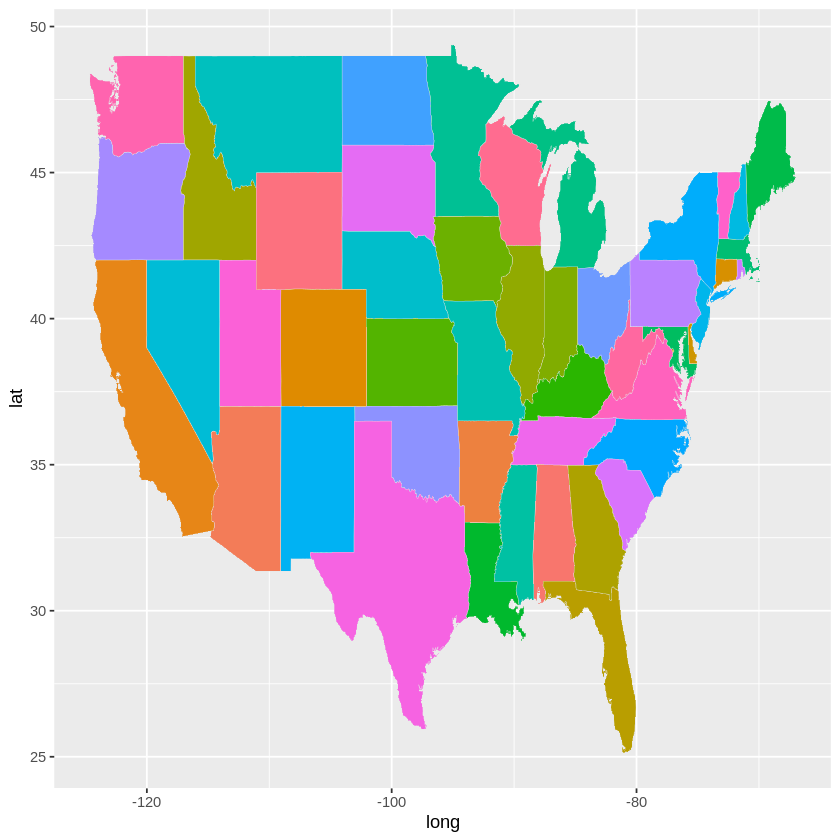

In [ ]:
p <- ggplot(data = us_states, mapping = aes(x = long, y = lat, group = group, 
   fill = region))
p + geom_polygon(color = "gray90", linewidth = 0.1) + guides(fill = FALSE)

In [ ]:
install.packages('mapproj')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



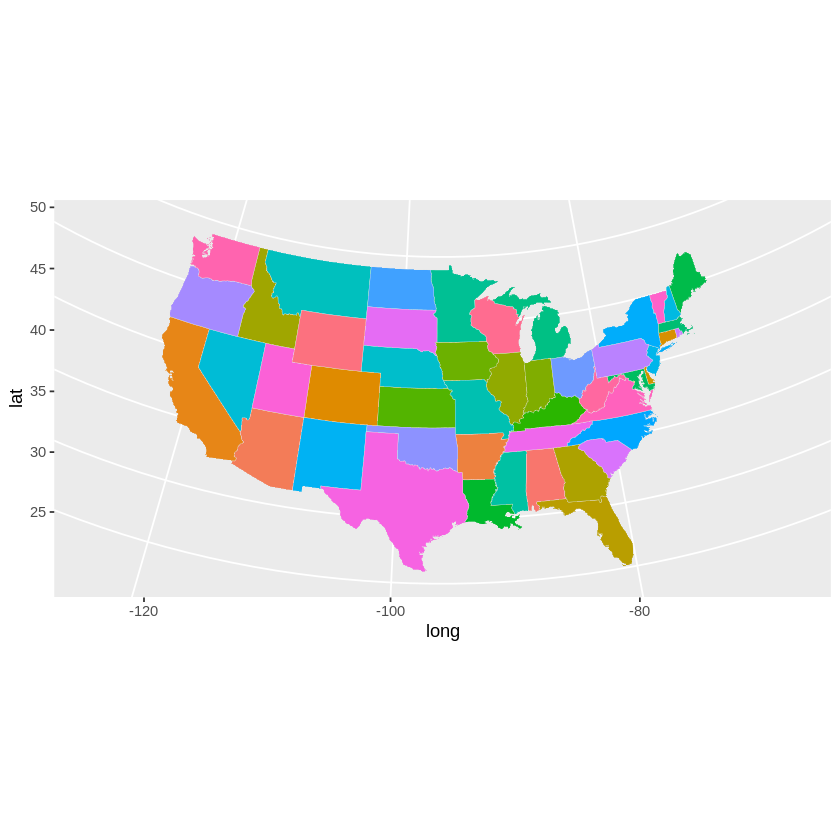

In [ ]:
p <- ggplot(data = us_states, 
            mapping = aes(x = long, y = lat, 
                          group = group, fill = region))

p + geom_polygon(color = "gray90", linewidth = 0.1) + 
    coord_map(project = "albers", lat0 = 39, lat1 = 45) +
    guides(fill = FALSE)

In [ ]:
election$region <- tolower(election$state)
us_states_elec <- left_join(us_states, election)

Joining with `by = join_by(region)`


In [ ]:
head(us_states_elec)

,long,lat,group,order,region,subregion,state,st,fips,total_vote,⋯,pct_johnson,pct_other,clinton_vote,trump_vote,johnson_vote,other_vote,ev_dem,ev_rep,ev_oth,census
,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,-87.46201,30.38968,1,1,alabama,NA,Alabama,AL,1,2123372,⋯,2.09,1.46,729547,1318255,44467,31103,0,9,0,South
2,-87.48493,30.37249,1,2,alabama,NA,Alabama,AL,1,2123372,⋯,2.09,1.46,729547,1318255,44467,31103,0,9,0,South
3,-87.52503,30.37249,1,3,alabama,NA,Alabama,AL,1,2123372,⋯,2.09,1.46,729547,1318255,44467,31103,0,9,0,South
4,-87.53076,30.33239,1,4,alabama,NA,Alabama,AL,1,2123372,⋯,2.09,1.46,729547,1318255,44467,31103,0,9,0,South
5,-87.57087,30.32665,1,5,alabama,NA,Alabama,AL,1,2123372,⋯,2.09,1.46,729547,1318255,44467,31103,0,9,0,South
6,-87.58806,30.32665,1,6,alabama,NA,Alabama,AL,1,2123372,⋯,2.09,1.46,729547,1318255,44467,31103,0,9,0,South


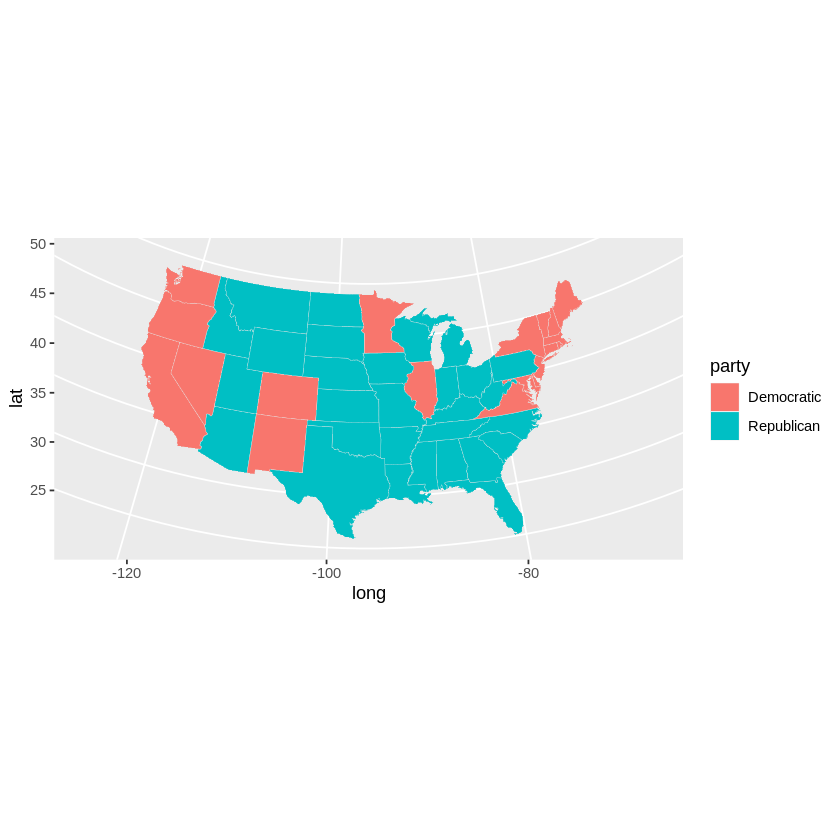

In [ ]:
p <- ggplot(data = us_states_elec,
            aes(x = long, y = lat,
                group = group, fill = party))

p + geom_polygon(color = "gray90", linewidth = 0.1) +
    coord_map(projection = "albers", lat0 = 39, lat1 = 45)

In [ ]:
devtools::install_github("hrbrmstr/hrbrthemes")

fontLiber... (NA     -> 0.1.0  ) [CRAN]
fontBitst... (NA     -> 0.1.1  ) [CRAN]
triebeard    (NA     -> 0.4.1  ) [CRAN]
Rcpp         (NA     -> 1.0.10 ) [CRAN]
sass         (0.4.5  -> 0.4.6  ) [CRAN]
cachem       (1.0.7  -> 1.0.8  ) [CRAN]
bslib        (0.4.1  -> 0.4.2  ) [CRAN]
promises     (NA     -> 1.2.0.1) [CRAN]
later        (NA     -> 1.3.1  ) [CRAN]
sourcetools  (NA     -> 0.1.7-1) [CRAN]
fontawesome  (0.5.0  -> 0.5.1  ) [CRAN]
xtable       (NA     -> 1.8-4  ) [CRAN]
httpuv       (NA     -> 1.6.11 ) [CRAN]
digest       (0.6.30 -> 0.6.31 ) [CRAN]
httpcode     (NA     -> 0.3.0  ) [CRAN]
urltools     (NA     -> 1.7.3  ) [CRAN]
jsonlite     (1.8.3  -> 1.8.4  ) [CRAN]
crul         (NA     -> 1.3    ) [CRAN]
shiny        (NA     -> 1.7.4  ) [CRAN]
xfun         (0.38   -> 0.39   ) [CRAN]
highr        (0.9    -> 0.10   ) [CRAN]
evaluate     (0.20   -> 0.21   ) [CRAN]
viridisLite  (0.4.1  -> 0.4.2  ) [CRAN]
fontquiver   (NA     -> 0.2.1  ) [CRAN]
gfonts       (NA     -> 0.2.0  ) [CRAN]


Installing 32 packages: fontLiberation, fontBitstreamVera, triebeard, Rcpp, sass, cachem, bslib, promises, later, sourcetools, fontawesome, xtable, httpuv, digest, httpcode, urltools, jsonlite, crul, shiny, xfun, highr, evaluate, viridisLite, fontquiver, gfonts, tinytex, stringr, Rttf2pt1, extrafontdb, isoband, gdtools, extrafont

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in i.p(...):
“installation of package ‘bslib’ had non-zero exit status”
Warning message in i.p(...):
“installation of package ‘httpuv’ had non-zero exit status”
Warning message in i.p(...):
“installation of package ‘crul’ had non-zero exit status”
Warning message in i.p(...):
“installation of package ‘shiny’ had non-zero exit status”
Warning message in i.p(...):
“installation of package ‘gfonts’ had non-zero exit status”
Warning message in i.p(...):
“installation of package ‘gdtools’ had non-zero exit status”


── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/Rtmpa2feVS/remotes1cb54a28fe3/hrbrmstr-hrbrthemes-3e8d949/DESCRIPTION’ ... OK
* preparing ‘hrbrthemes’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘hrbrthemes_0.8.6.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in i.p(...):
“installation of package ‘/tmp/Rtmpa2feVS/file1cb5772960a8/hrbrthemes_0.8.6.tar.gz’ had non-zero exit status”


Loading required package: grid



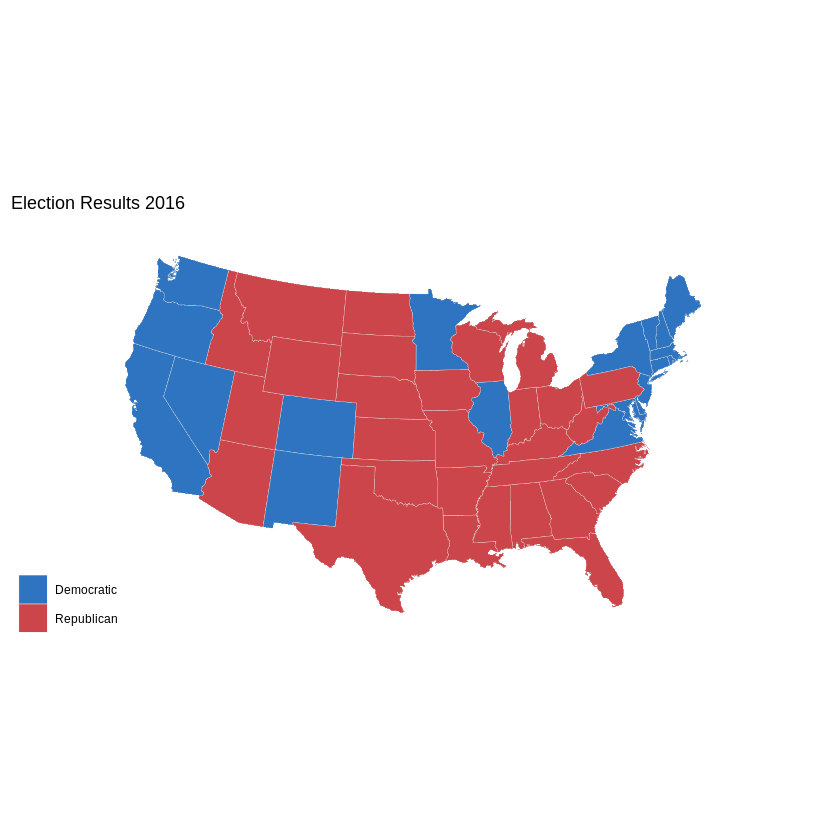

In [ ]:
theme_map <- function(base_size = 9, base_family=""){
  require(grid)
  theme_bw(base_size = base_size, base_family = base_family) %+replace%
    theme(axis.line = element_blank(),
          axis.text = element_blank(),
          axis.ticks = element_blank(),
          axis.title.x = element_blank(),
          axis.title.y = element_blank(),
          panel.background = element_blank(),
          panel.border = element_blank(),
          panel.grid = element_blank(),
          panel.spacing = unit(0, "lines"),
          plot.background = element_blank(),
          legend.justification = c(0,0),
          legend.position = c (0,0),
          )
}

p0 <- ggplot(data = us_states_elec,
            mapping = aes(x = long, y = lat,
                          group = group, fill = party))

p1 <- p0 + geom_polygon(color = "gray90", linewidth = 0.1) +
   coord_map(projection = "albers", lat0 = 39, lat1 = 45)
 
p2 <- p1 + scale_fill_manual(values = party_colors) +
   labs(title = "Election Results 2016", fill = NULL)
 
p2 + theme_map()

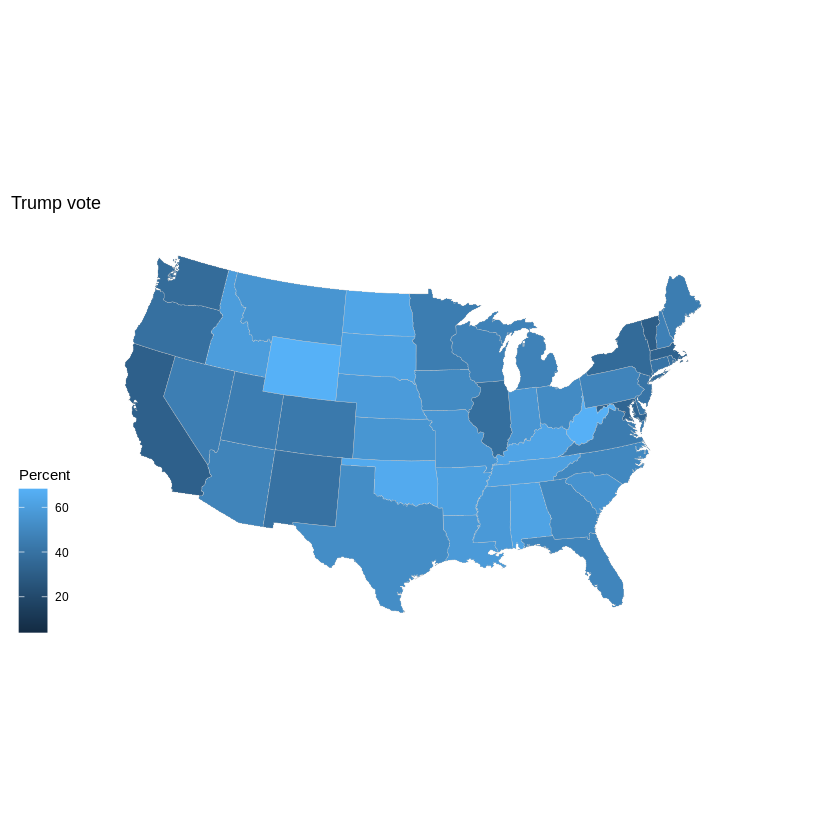

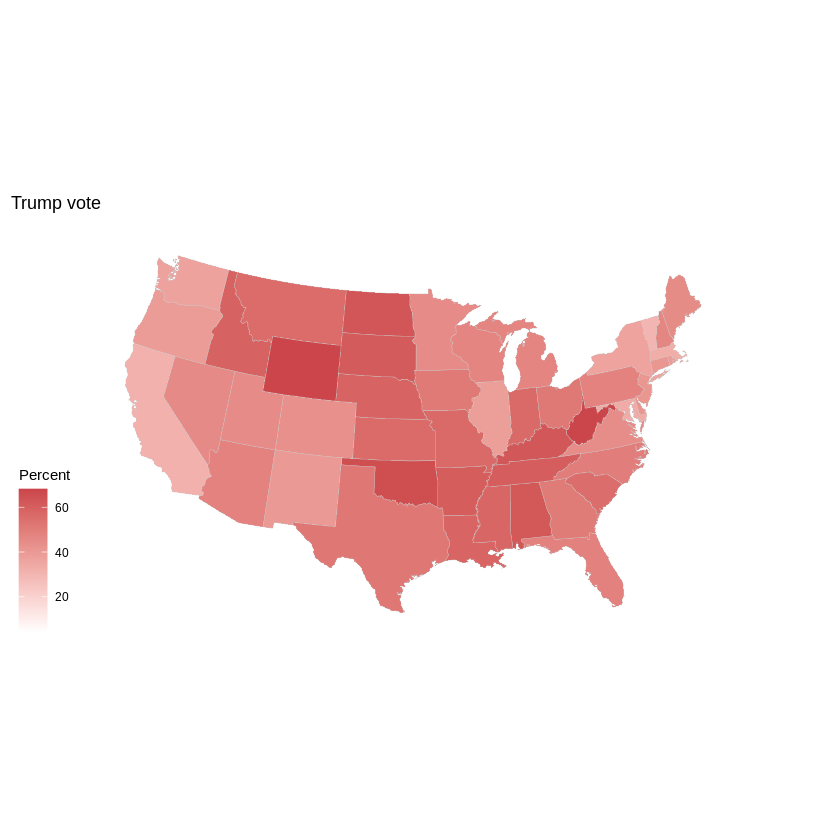

In [ ]:
# Not a good plot.
p0 <- ggplot(data = us_states_elec,
             mapping = aes(x = long, y = lat, group = group, fill = pct_trump))

p1 <- p0 + geom_polygon(color = "gray80", linewidth = 0.1) +
   coord_map(project = "albers", lat0 = 39, lat1 = 45)

p1 + labs(title = "Trump vote") + theme_map() + labs(fill = "Percent")

# p2 specifies a gradient where lower vote is white while higher vote is pink.
p2 <- p1 + scale_fill_gradient(low = "white", high = "#CB454A") +
       labs(title = "Trump vote")
     
p2 + theme_map() + labs(fill = "Percent")

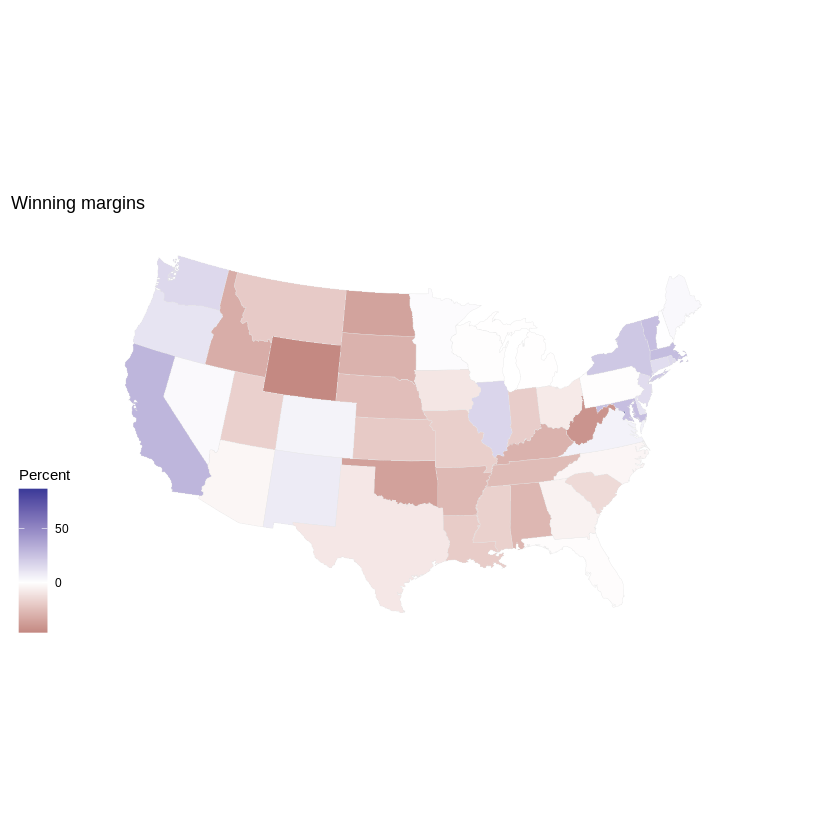

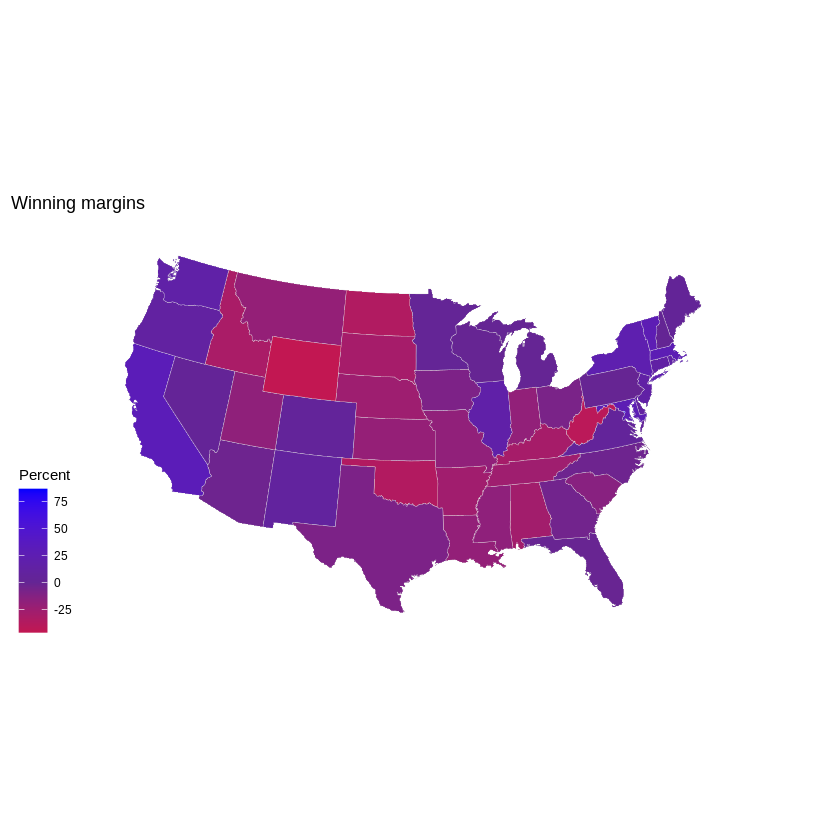

In [ ]:
p0 <- ggplot(data = us_states_elec, 
             mapping = aes(x = long, y = lat, group = group, fill = d_points))

p1 <- p0 + geom_polygon(color = "gray90", linewidth = 0.1) +
   coord_map(project = "albers", lat0 = 39, lat1 = 45)
 
 p2 <- p1 + scale_fill_gradient2() + labs(title = "Winning margins")
 p2 + theme_map() + labs(fill = "Percent")

 p3 <- p1 + scale_fill_gradient2(low = "red", mid = scales::muted("purple"),
                                 high = "blue", breaks = c(-25, 0, 25, 50, 75)) +
      labs(title = "Winning margins")
p3 + theme_map() + labs(fill = "Percent")

In [ ]:
county_map %>% sample_n(5)

long,lat,order,hole,piece,group,id
<dbl>,<dbl>,<int>,<lgl>,<fct>,<fct>,<chr>
-1224400.9,-221720.8,50981,FALSE,1,0500000US16083.1,16083
294333.9,-288046.0,110210,FALSE,1,0500000US31043.1,31043
1066741.4,-563402.3,57114,FALSE,1,0500000US18153.1,18153
1388414.7,-449503.0,131492,FALSE,1,0500000US39097.1,39097
1465313.0,-699799.3,63458,FALSE,1,0500000US21025.1,21025


In [ ]:
county_data %>%
  select(id, name, state, pop_dens, pct_black) %>%
  sample_n(5)

id,name,state,pop_dens,pct_black
<chr>,<chr>,<fct>,<fct>,<fct>
08093,Park County,CO,"[ 0, 10)","[ 0.0, 2.0)"
40145,Wagoner County,OK,"[ 100, 500)","[ 2.0, 5.0)"
48081,Coke County,TX,"[ 0, 10)","[ 0.0, 2.0)"
38063,Nelson County,ND,"[ 0, 10)","[ 0.0, 2.0)"
17127,Massac County,IL,"[ 50, 100)","[ 5.0,10.0)"


In [ ]:
county_full <- left_join(county_map, county_data, by = "id")

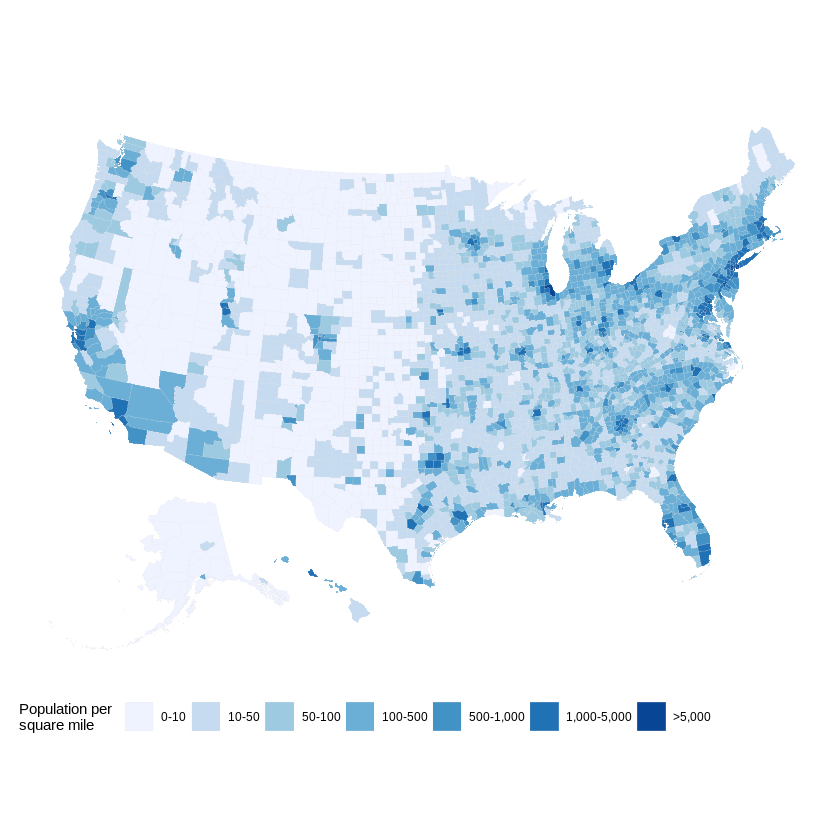

In [ ]:
p <- ggplot(data = county_full, 
            mapping = aes(x = long, y = lat,
                          fill = pop_dens,
                          group = group))


p1 <- p + geom_polygon(color = "gray90", linewidth = 0.05) + coord_equal()
p2 <- p1 + scale_fill_brewer(palette = "Blues", 
                             labels = c("0-10", "10-50", "50-100", "100-500",
                                        "500-1,000", "1,000-5,000", ">5,000"))

p2 + labs(fill = "Population per\nsquare mile") +
     theme_map() +
     guides(fill = guide_legend(nrow = 1)) + 
     theme(legend.position = "bottom")

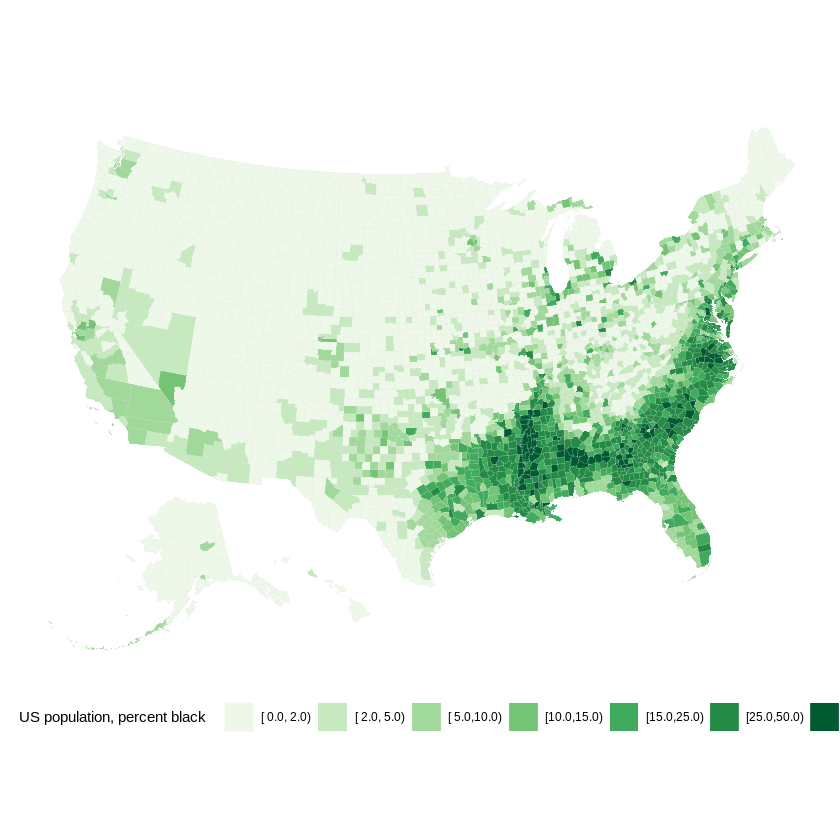

In [ ]:
p <- ggplot(data = county_full, 
            mapping = aes(x = long, y = lat, fill = pct_black,
                          group = group))

p1 <- p + geom_polygon(color = "gray90", linewidth = 0.05) + coord_equal()
p2 <- p1 + scale_fill_brewer(palette = "Greens")
p2 + theme_map() +  guides(fill = guide_legend(nrow = 1)) + 
  labs(fill = "US population, percent black") + theme(legend.position = "bottom")

In [ ]:
orange_pal <- RColorBrewer::brewer.pal(n = 6, name = "Oranges")
orange_pal

[1] "#FEEDDE" "#FDD0A2" "#FDAE6B" "#FD8D3C" "#E6550D" "#A63603"

In [ ]:
orange_rev <- rev(orange_pal)
orange_rev

[1] "#A63603" "#E6550D" "#FD8D3C" "#FDAE6B" "#FDD0A2" "#FEEDDE"

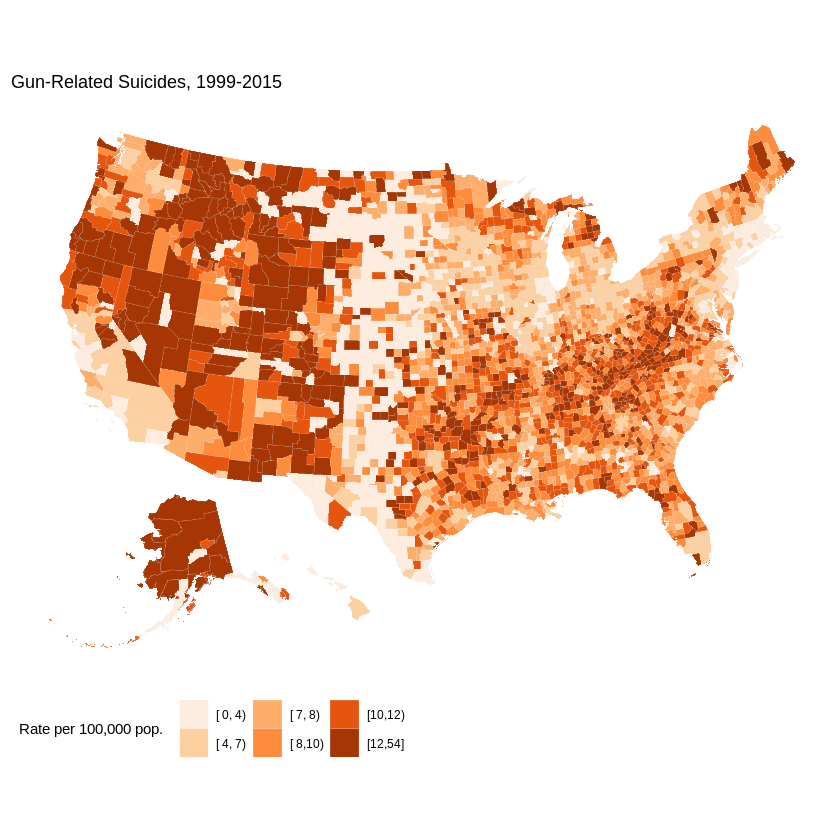

In [ ]:
library(tidyverse)

gun_p <- ggplot(data = county_full,
            mapping = aes(x = long, y = lat,
                          fill = su_gun6, 
                          group = group))

gun_p1 <- gun_p + geom_polygon(color = "gray90", linewidth = 0.05) + coord_equal()

gun_p2 <- gun_p1 + scale_fill_manual(values = orange_pal)

gun_p2 + labs(title = "Gun-Related Suicides, 1999-2015",
              fill = "Rate per 100,000 pop.") + 
        theme_map() + theme(legend.position = "bottom")

#7.3 State Bins

In [ ]:
install.packages("statebins")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



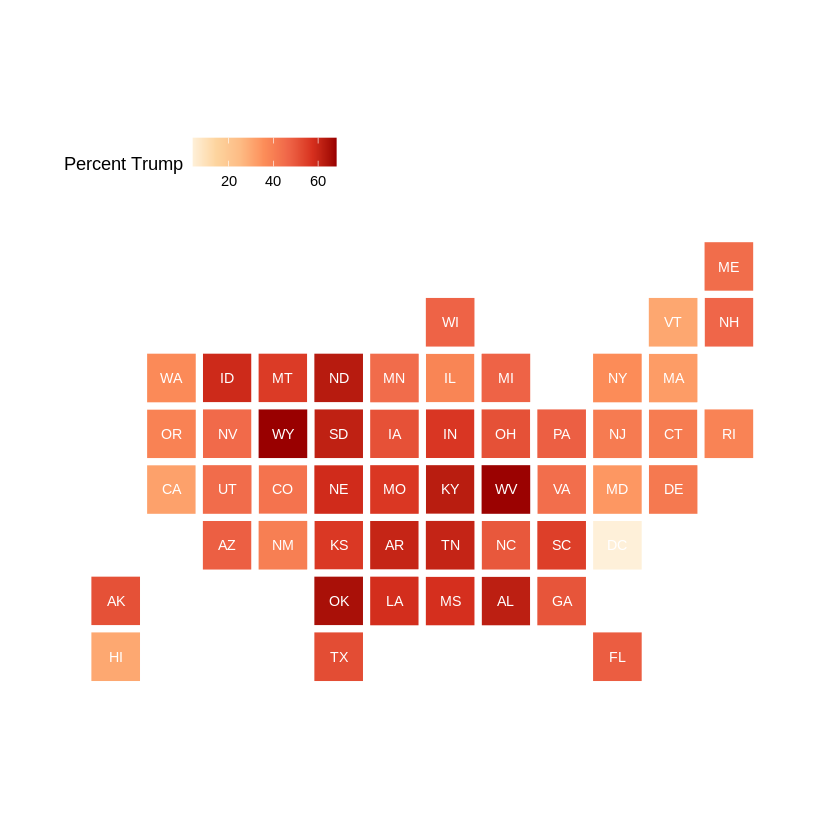

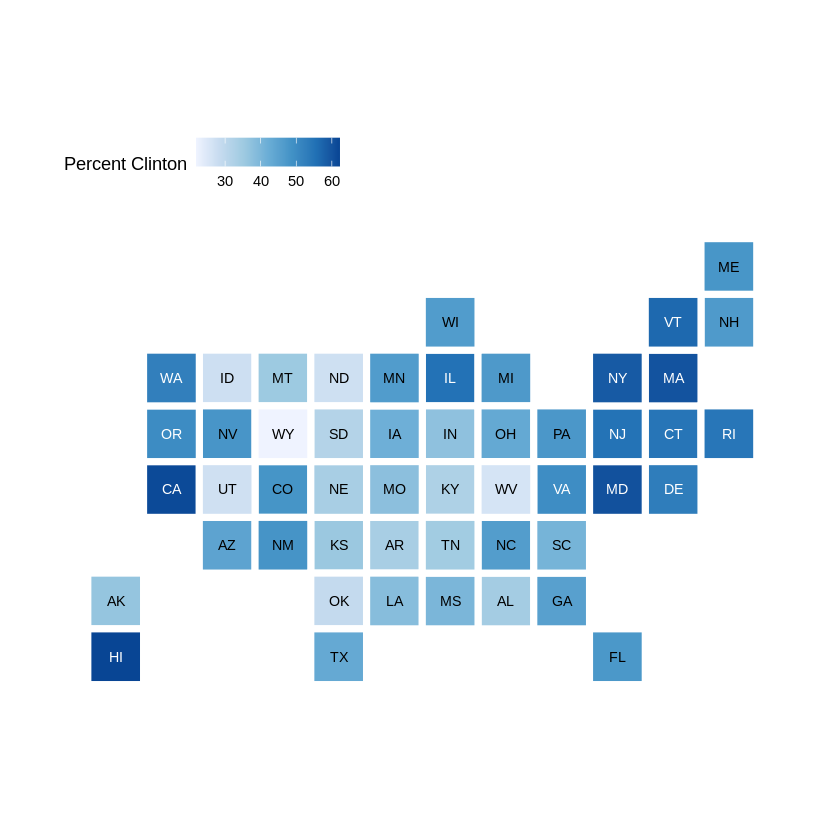

In [ ]:
library(statebins)

statebins(state_data = election, state_col = "state",
          value_col = "pct_trump", font_size = 3, palette = "OrRd", 
          dark_label = "white", name = "Percent Trump",
          light_label = "white", direction = 1) + 
          theme_statebins(legend_position="top")
 

statebins(state_data = subset(election, st %nin% "DC"),
                     state_col = "state", name = "Percent Clinton",
                     value_col = "pct_clinton",
                      font_size = 3, direction = 1) + theme_statebins(legend_position="top")

In [ ]:
election <- election %>% mutate(color = recode(party, Republican = "darkred",
                                               Democrat = "royalblue"))

statebins(state_data = election, state_col = "st",
font_size = 3,
labels=c("Trump", "Clinton"))

ERROR: ignored

#7.4 Small-Multiple Maps

In [ ]:
opiates

year,state,fips,deaths,population,crude,adjusted,adjusted_se,region,abbr,division_name
<int>,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<ord>,<chr>,<chr>
1999,Alabama,1,37,4430141,0.8,0.8,0.1,South,AL,East South Central
1999,Alaska,2,27,624779,4.3,4.0,0.8,West,AK,Pacific
1999,Arizona,4,229,5023823,4.6,4.7,0.3,West,AZ,Mountain
1999,Arkansas,5,28,2651860,1.1,1.1,0.2,South,AR,West South Central
1999,California,6,1474,33499204,4.4,4.5,0.1,West,CA,Pacific
1999,Colorado,8,164,4226018,3.9,3.7,0.3,West,CO,Mountain
1999,Connecticut,9,151,3386401,4.5,4.4,0.4,Northeast,CT,New England
1999,Delaware,10,32,774990,4.1,4.1,0.7,South,DE,South Atlantic
1999,District of Columbia,11,28,570213,4.9,4.9,0.9,South,DC,NA


In [ ]:
opiates$region <- tolower(opiates$state)
opiates_map <- left_join(us_states, opiates)

Joining with `by = join_by(region)`
Warning message in left_join(us_states, opiates):
“Detected an unexpected many-to-many relationship between `x` and `y`.
ℹ Row 1 of `x` matches multiple rows in `y`.
ℹ Row 1 of `y` matches multiple rows in `x`.
ℹ If a many-to-many relationship is expected, set `relationship =
  "many-to-many"` to silence this warning.”


In [ ]:
devtools::install_github("sjmgarnier/viridis")

viridisLite (0.4.1 -> 0.4.2) [CRAN]
isoband     (0.2.6 -> 0.2.7) [CRAN]
gridExtra   (NA    -> 2.3  ) [CRAN]


Installing 3 packages: viridisLite, isoband, gridExtra

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpNm1rqc/remotes1582aa18545/sjmgarnier-viridis-2c2c1ec/DESCRIPTION’ ... OK
* preparing ‘viridis’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘viridis_0.6.3.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



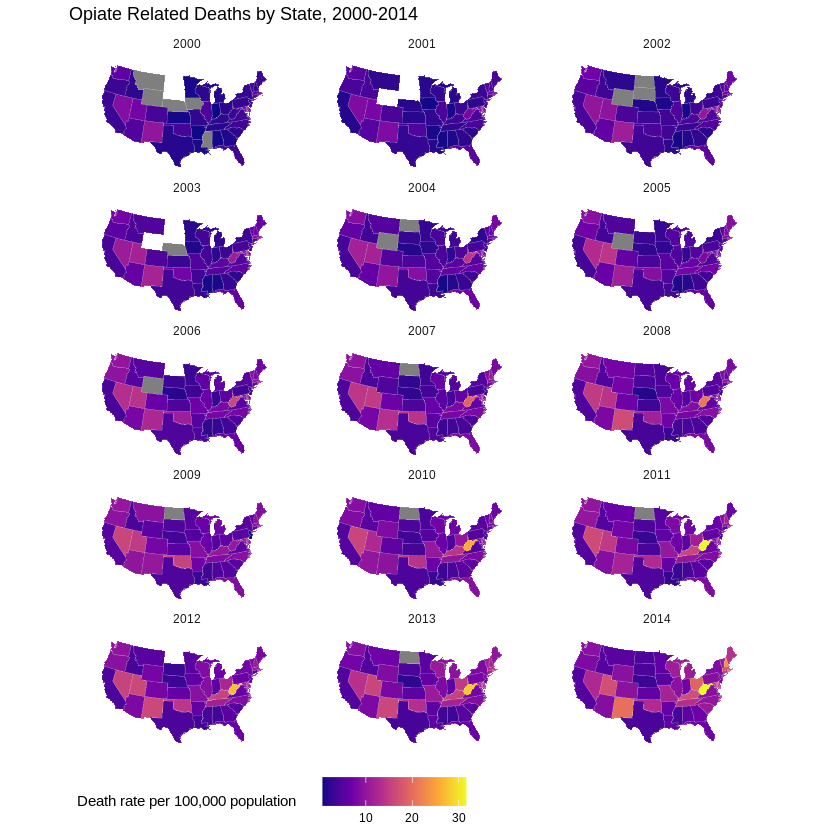

In [ ]:
library(viridis)

p0 <- ggplot(data = subset(opiates_map, year > 1999),
          mapping = aes(x = long, y = lat,
              group = group,
              fill = adjusted))

p1 <- p0 + geom_polygon(color = "gray90", linewidth = 0.05) +
   coord_map(projection = "albers", lat0 = 39, lat1 = 45)
 
p2 <- p1 + scale_fill_viridis_c(option = "plasma")

p2 + theme_map() + facet_wrap(~ year, ncol = 3) +
     theme(legend.position = "bottom",
           strip.background = element_blank()) +
     labs(fill = "Death rate per 100,000 population ",
          title = "Opiate Related Deaths by State, 2000-2014")

# 7.5 Is Your Data Really Spatial?

Warning message:
“Removed 17 rows containing missing values (`geom_line()`).”


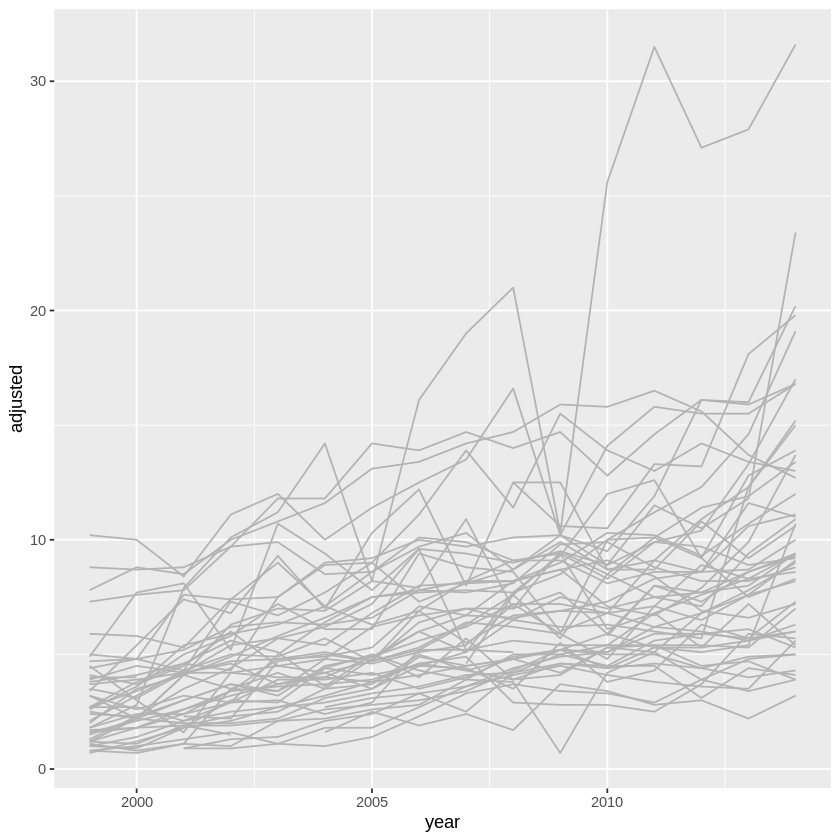

In [ ]:
p <- ggplot(data = opiates, mapping = aes(x = year, y = adjusted,
            group = state))
p + geom_line(color = "gray70")

In [ ]:
p0 <- ggplot(data = drop_na(opiates, division_name),
             mapping = aes(x = year, y = adjusted))

p1 <- p0 + geom_line(color = "gray70", 
               mapping = aes(group = state))

In [ ]:
install.packages("ggrepel")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘Rcpp’




Warning message in geom_text_repel(data = subset(opiates, year == max(year) & abbr != :
“Ignoring unknown parameters: `linewidth`”
`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Warning message:
“Removed 27 rows containing non-finite values (`stat_smooth()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_line()`).”


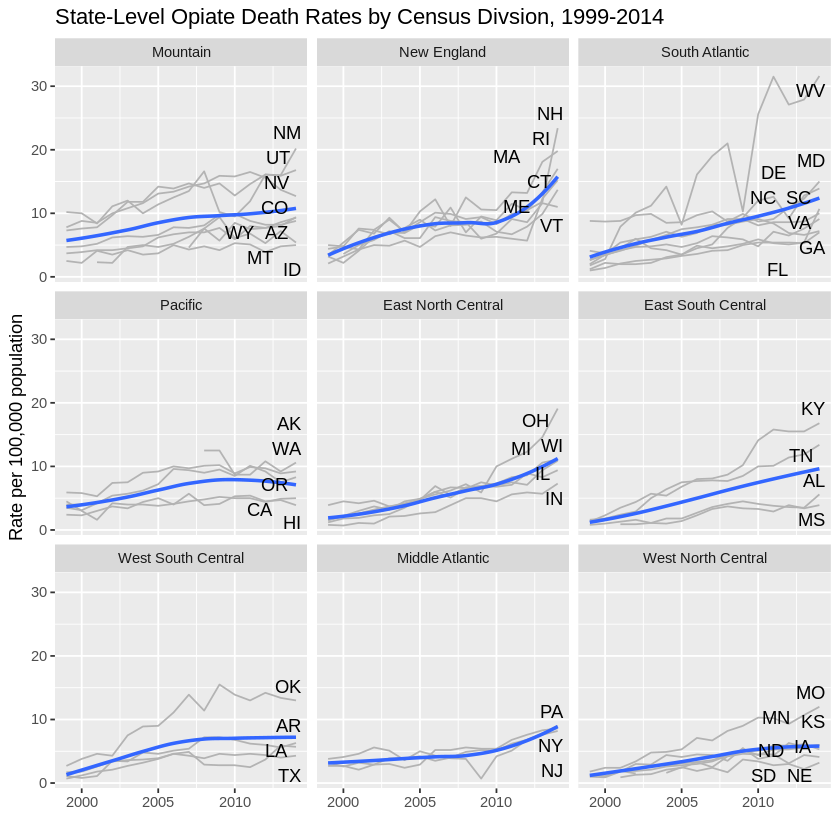

In [ ]:
library(ggrepel)

p2 <- p1 + geom_smooth(mapping = aes(group = division_name),
                       se = FALSE)

p3 <- p2 + geom_text_repel(data = subset(opiates, 
                                         year == max(year) & abbr !="DC"),
                           mapping = aes(x = year, y = adjusted, label = abbr),
                           linewidth = 1.8, segment.color = NA, nudge_x = 30) +
         coord_cartesian(c(min(opiates$year),
                    max(opiates$year)))

p3 + labs(x = "", y = "Rate per 100,000 population",
       title = "State-Level Opiate Death Rates by Census Divsion, 1999-2014") + 
   facet_wrap(~ reorder(division_name, -adjusted, na.rm = TRUE), nrow = 3)

#8 Refine Your Plots

In [ ]:
library(socviz)

head(asasec)

,Section,Sname,Beginning,Revenues,Expenses,Ending,Journal,Year,Members
,<fct>,<fct>,<int>,<int>,<int>,<int>,<fct>,<int>,<int>
1,Aging and the Life Course (018),Aging,12752,12104,12007,12849,No,2005,598
2,"Alcohol, Drugs and Tobacco (030)",Alcohol/Drugs,11933,1144,400,12677,No,2005,301
3,Altruism and Social Solidarity (047),Altruism,1139,1862,1875,1126,No,2005,NA
4,Animals and Society (042),Animals,473,820,1116,177,No,2005,209
5,Asia/Asian America (024),Asia,9056,2116,1710,9462,No,2005,365
6,Body and Embodiment (048),Body,3408,1618,1920,3106,No,2005,NA


`geom_smooth()` using method = 'loess' and formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: label
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


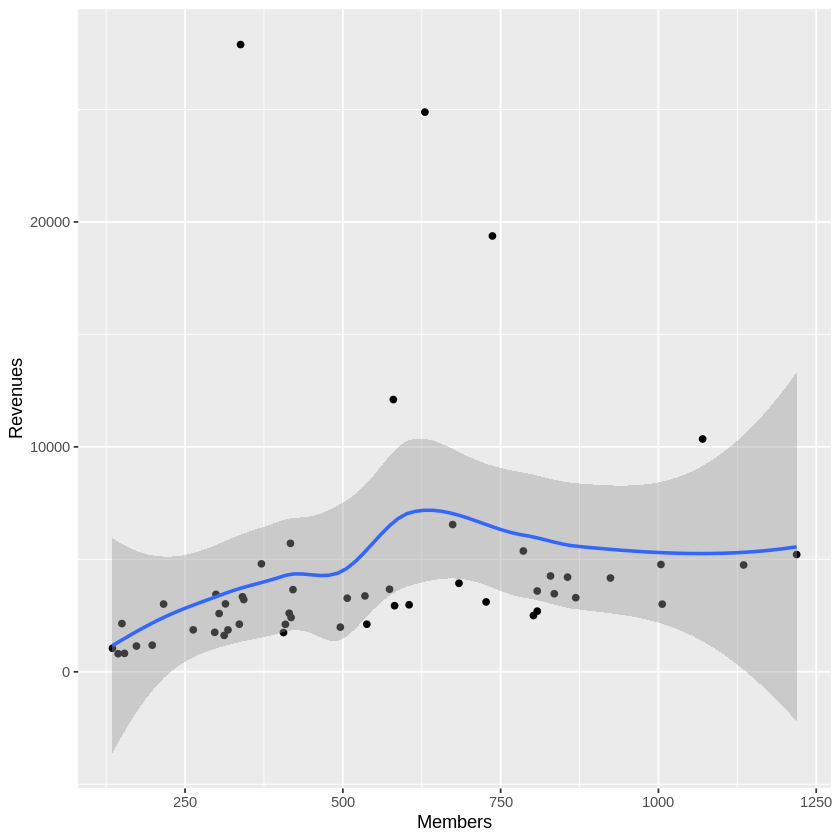

In [ ]:
library(tidyverse)

p <- ggplot(data = subset(asasec, Year == 2014), mapping = aes(x = Members,
        y = Revenues, label = Sname))

p + geom_point() + geom_smooth()

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: label
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


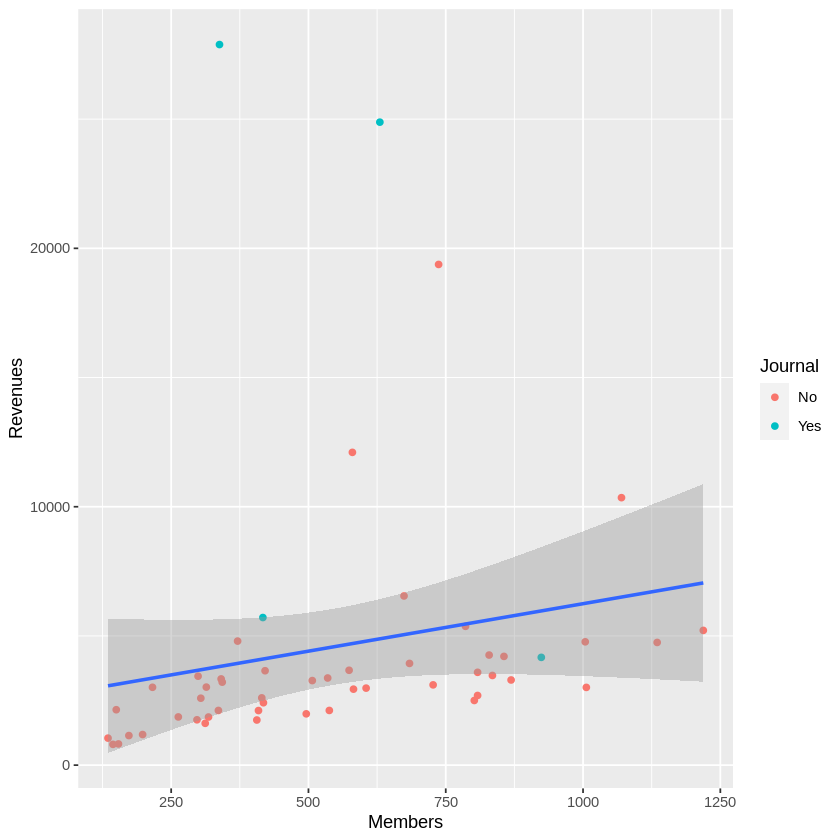

In [ ]:
p <- ggplot(data = subset(asasec, Year == 2014), mapping = aes(x = Members,
  y = Revenues, label = Sname))

p + geom_point(mapping = aes(color = Journal)) + geom_smooth(method = "lm")

In [ ]:
install.packages("ggrepel")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘Rcpp’




`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: label
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


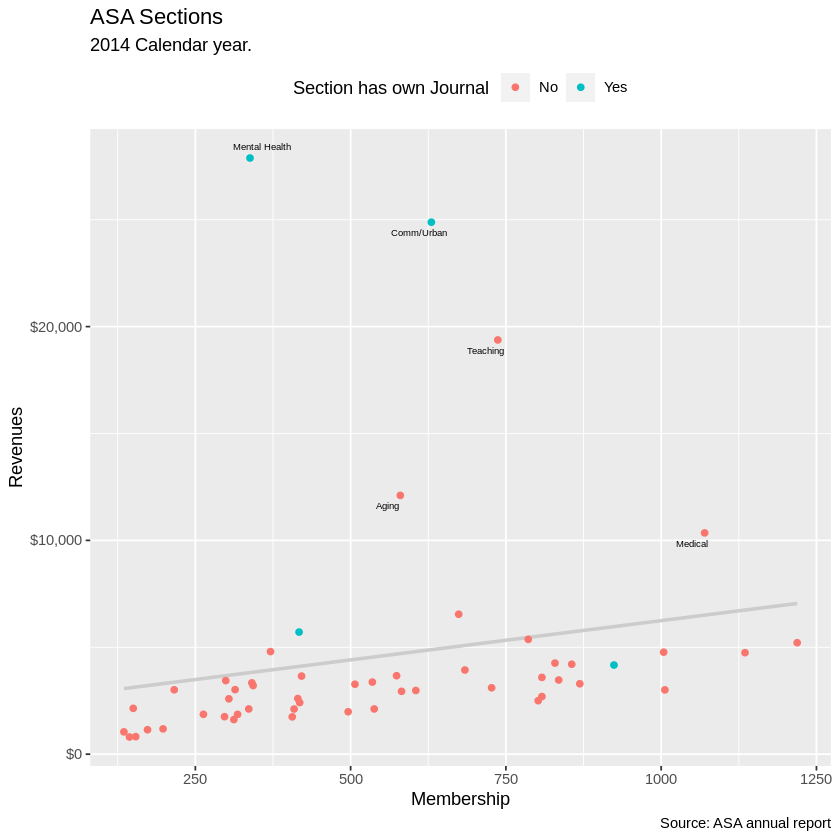

In [ ]:
library(ggrepel)

p0 <- ggplot(data = subset(asasec, Year == 2014), mapping = aes(x = Members,
    y = Revenues, label = Sname))

p1 <- p0 + geom_smooth(method = "lm", se = FALSE, color = "gray80") +
   geom_point(mapping = aes(color = Journal))
 
 p2 <- p1 + geom_text_repel(data = subset(asasec, Year == 2014 &
    Revenues > 7000), size = 2)

p3 <- p2 + labs(x = "Membership",
         y = "Revenues",
         color = "Section has own Journal",
         title = "ASA Sections",
         subtitle = "2014 Calendar year.",
         caption = "Source: ASA annual report")

p4 <- p3 + scale_y_continuous(labels = scales::dollar) +
   theme(legend.position = "top")
p4

Warning message:
“Removed 46 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 46 rows containing missing values (`geom_point()`).”


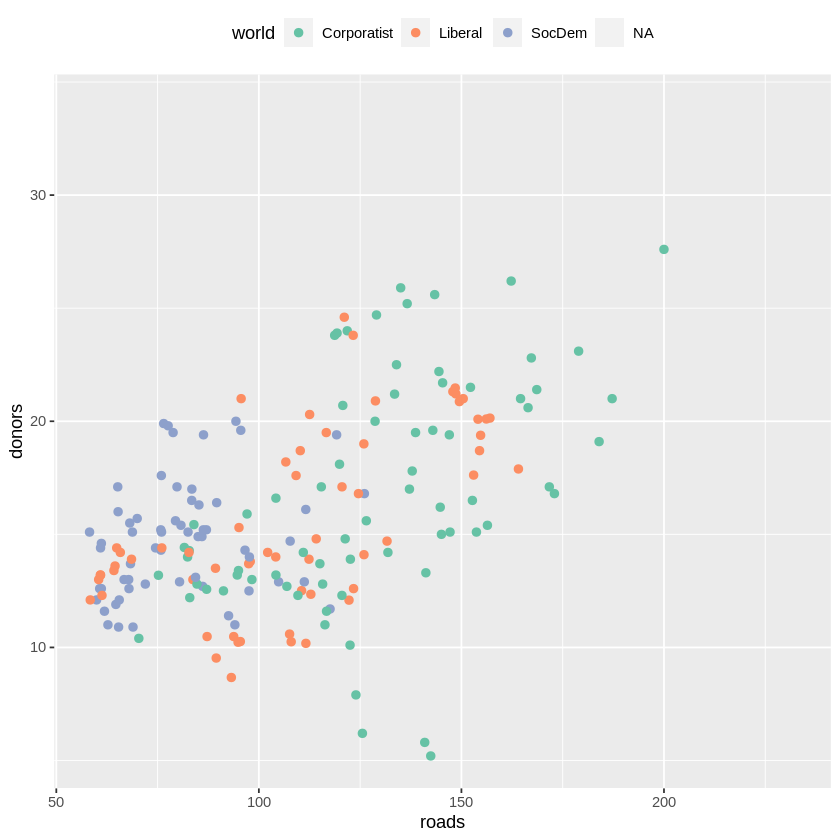

Warning message:
“Removed 46 rows containing missing values (`geom_point()`).”


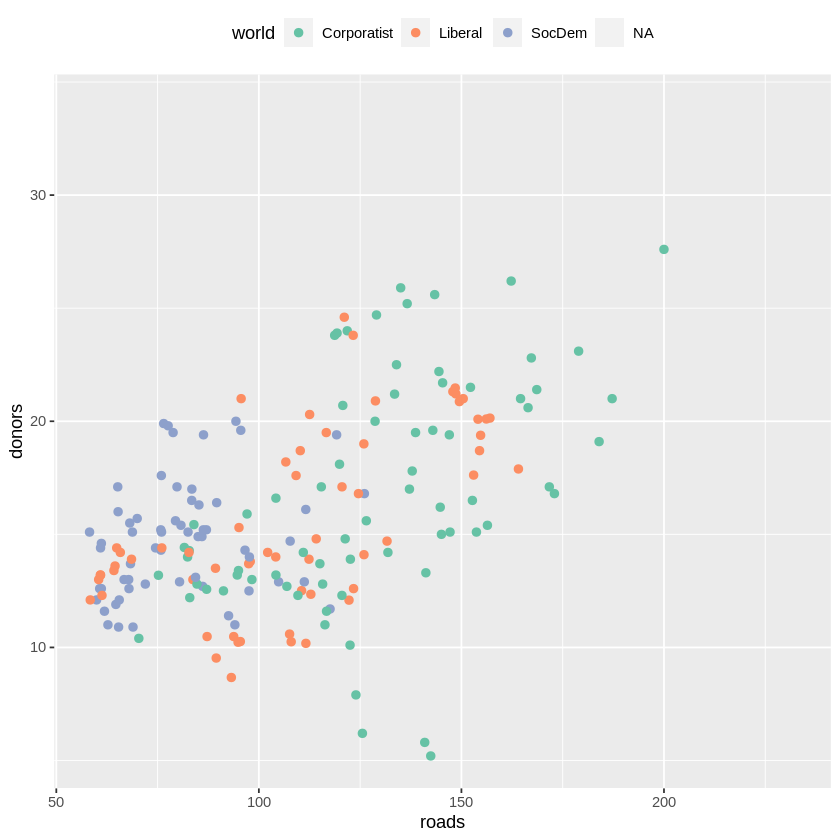

Warning message:
“Removed 46 rows containing missing values (`geom_point()`).”


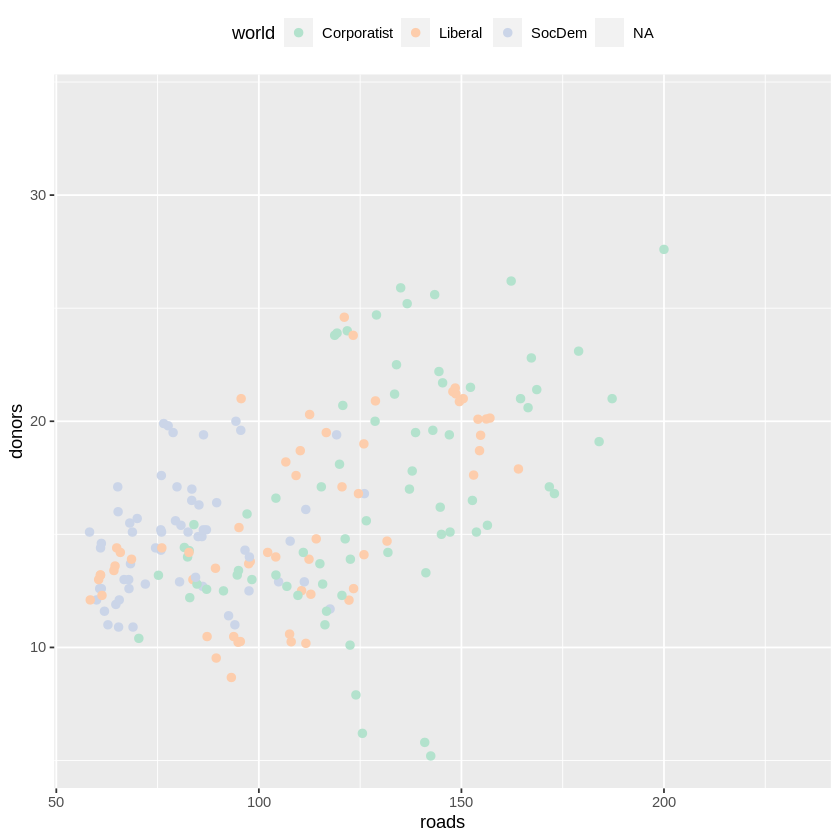

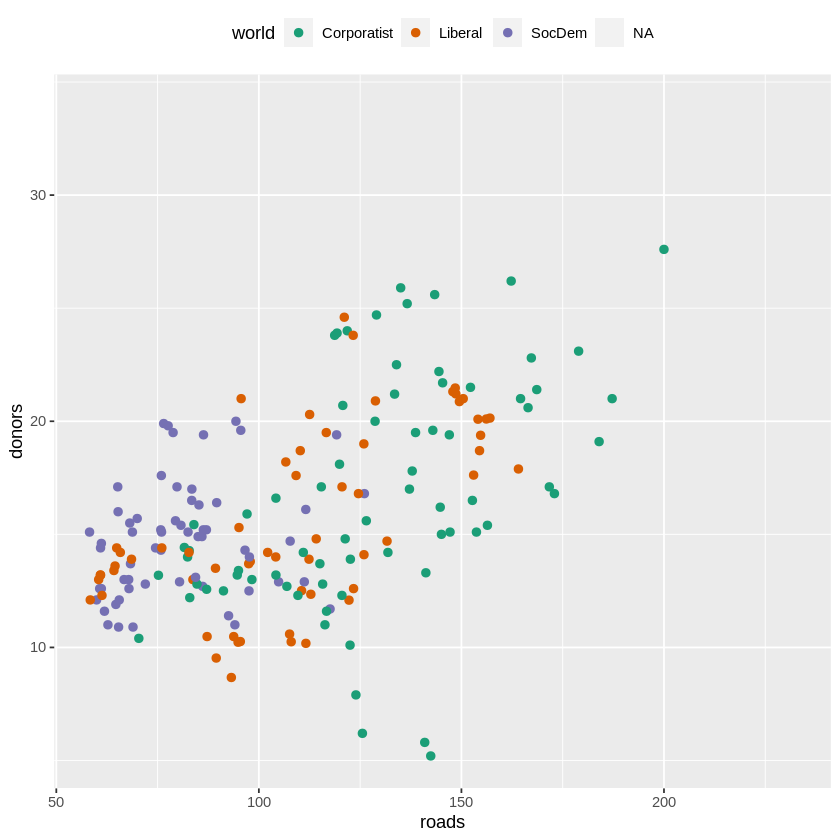

In [ ]:
p <- ggplot(data = organdata, mapping = aes(x = roads, y = donors,
    color = world))
p + geom_point(size = 2) + scale_color_brewer(palette = "Set2") +
    theme(legend.position = "top")
  
p + geom_point(size = 2) + scale_color_brewer(palette = "Set2") +
    theme(legend.position = "top")
  
p + geom_point(size = 2) + scale_color_brewer(palette = "Pastel2") +
    theme(legend.position = "top")

p + geom_point(size = 2) + scale_color_brewer(palette = "Dark2") +
    theme(legend.position = "top")

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation: label
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


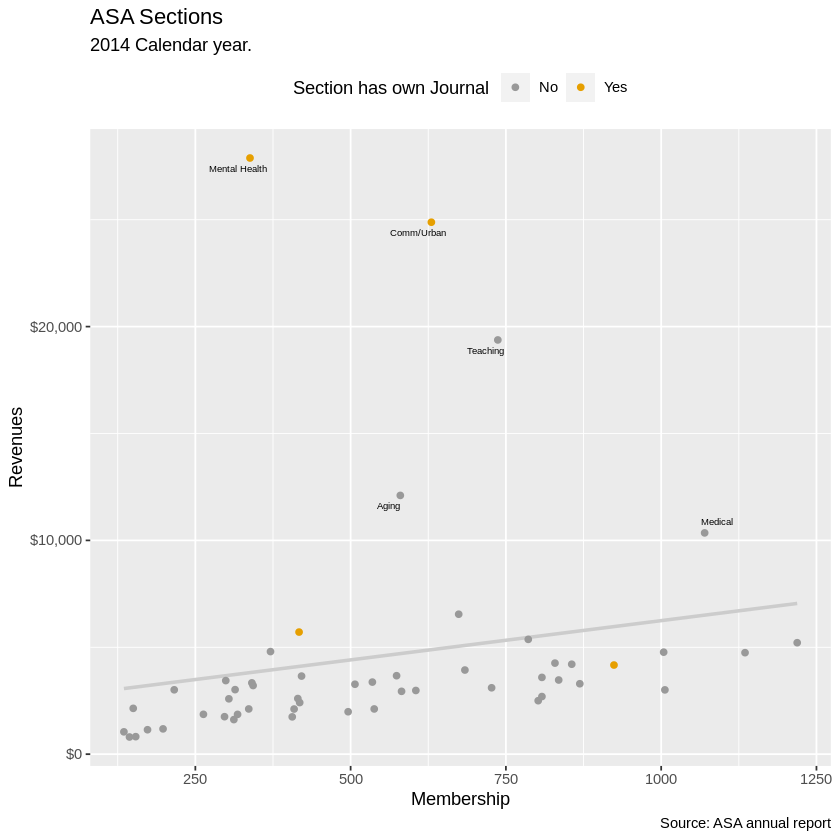

In [ ]:
cb_palette <- c("#999999", "#E69F00", "#56B4E9", "#009E73", "#F0E442", 
       "#0072B2", "#D55E00", "#CC79A7")

p4 + scale_color_manual(values = cb_palette)

In [ ]:
library(RColorBrewer)

Default <- brewer.pal(5, "Set2")

In [ ]:
install.packages("dichromat")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(dichromat)
library(tidyverse)

types <- c("deutan", "protan", "tritan")
names(types) <- c("Deuteronopia", "Protanopia", "Tritanopia")

color_table <- types %>% purrr::map(~dichromat(Default, .x)) %>%
   as_tibble() %>% add_column(Default, .before = TRUE)
 
color_table

Default,Deuteronopia,Protanopia,Tritanopia
<chr>,<chr>,<chr>,<chr>
#66C2A5,#AEAEA7,#BABAA5,#82BDBD
#FC8D62,#B6B661,#9E9E63,#F29494
#8DA0CB,#9C9CCB,#9E9ECB,#92ABAB
#E78AC3,#ACACC1,#9898C3,#DA9C9C
#A6D854,#CACA5E,#D3D355,#B6C8C8


#8.2 Layer Color and Text Together

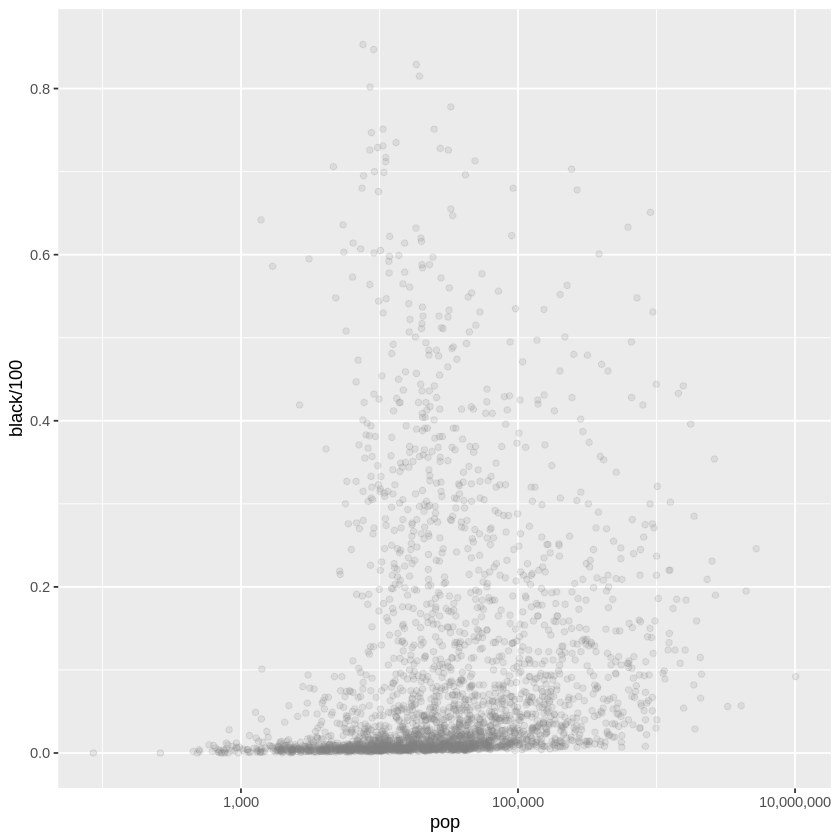

In [ ]:
# Democrat Blue and Republican Red
party_colors <- c("#2E74C0", "#CB454A")

p0 <- ggplot(data = subset(county_data,
                           flipped == "No"),
             mapping = aes(x = pop,
                           y = black/100))

p1 <- p0 + geom_point(alpha = 0.15, color = "gray50") +
   scale_x_log10(labels=scales::comma)
 
p1

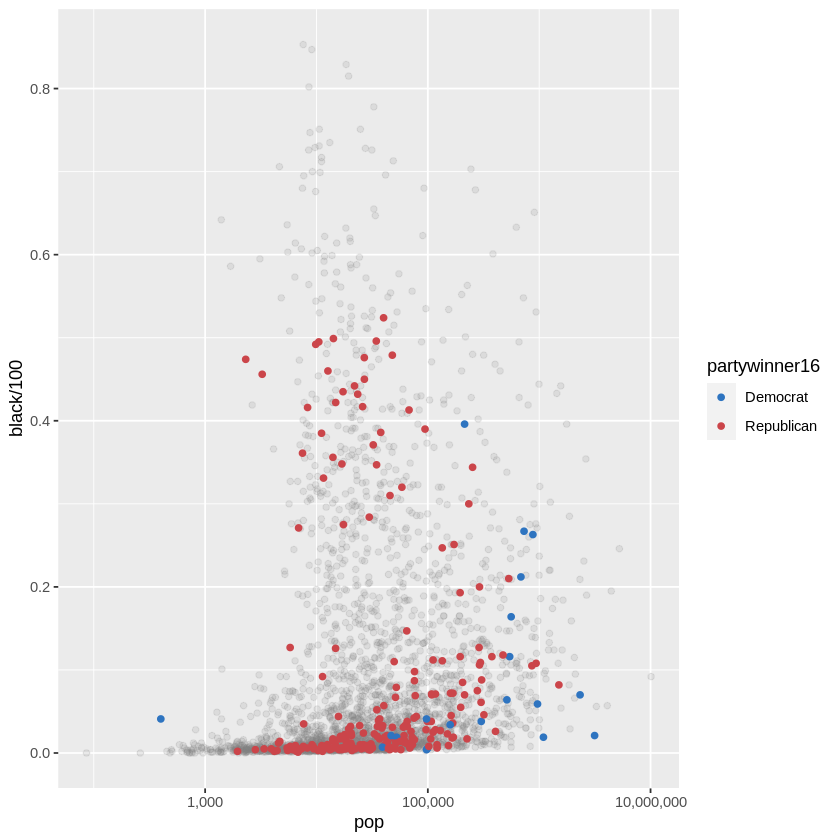

In [ ]:
p2 <- p1 + geom_point(data = subset(county_data,
                                    flipped == "Yes"),
                      mapping = aes(x = pop, y = black/100, 
                                    color = partywinner16)) +
    scale_color_manual(values = party_colors)
  
p2

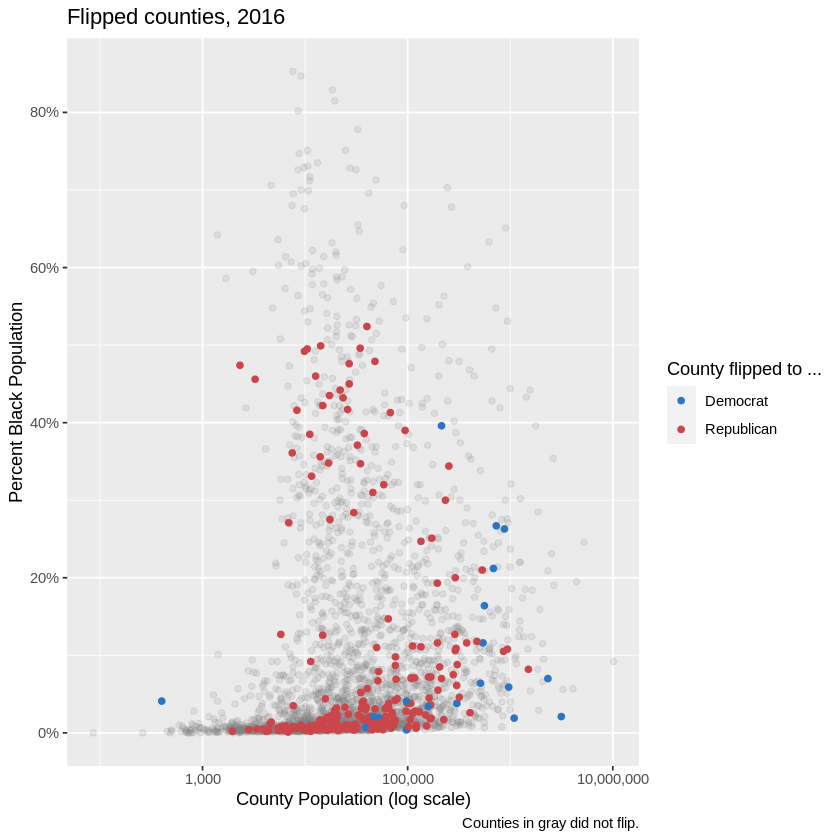

In [ ]:
p3 <- p2 + scale_y_continuous(labels=scales::percent) +
  labs(color = "County flipped to ...",
       x = "County Population (log scale)",
       y = "Percent Black Population",
       title = "Flipped counties, 2016",
       caption = "Counties in gray did not flip.")

p3

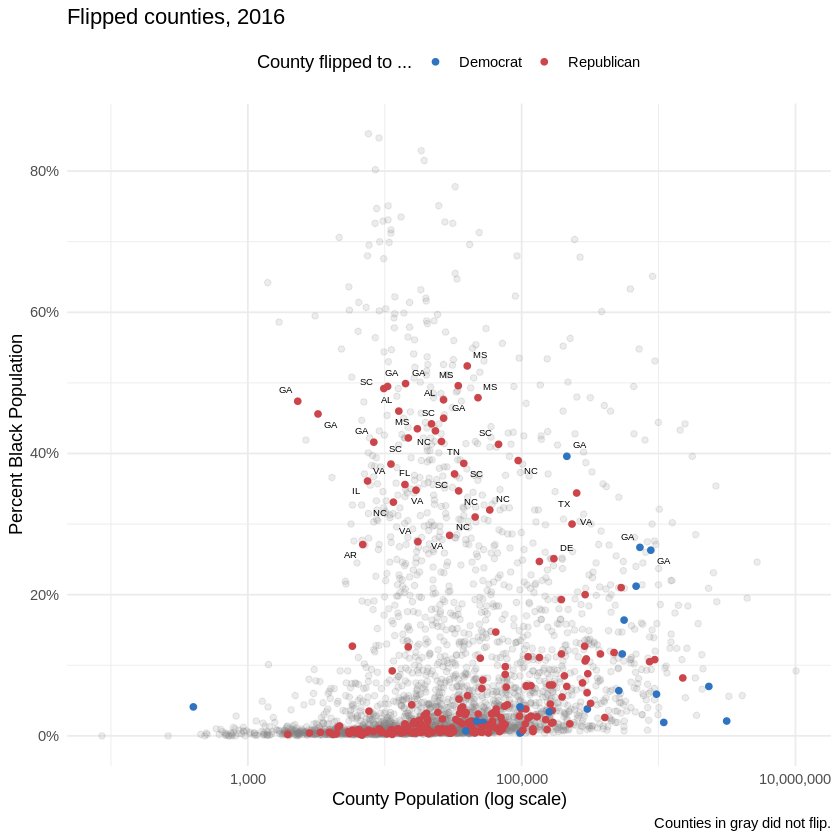

In [ ]:
p4 <- p3 + geom_text_repel(data = subset(county_data, flipped == "Yes" & black > 25),
                                  mapping = aes(x = pop,
                                          y = black/100,
                                          label = state), size = 2)

p4 + theme_minimal() + 
    theme(legend.position="top")

In [ ]:
str(county_data)

'data.frame':	3195 obs. of  32 variables:
 $ id              : chr  "0" "01000" "01001" "01003" ...
 $ name            : chr  NA "1" "Autauga County" "Baldwin County" ...
 $ state           : Factor w/ 51 levels "AK","AL","AR",..: NA 2 2 2 2 2 2 2 2 2 ...
 $ census_region   : Factor w/ 4 levels "Midwest","Northeast",..: NA 3 3 3 3 3 3 3 3 3 ...
 $ pop_dens        : Factor w/ 7 levels "[    0,   10)",..: 3 3 3 4 2 2 3 2 2 4 ...
 $ pop_dens4       : Factor w/ 4 levels "[  0,   17)",..: 3 3 3 4 2 2 3 2 2 4 ...
 $ pop_dens6       : Factor w/ 6 levels "[  0,    9)",..: 5 5 5 5 3 3 5 2 3 5 ...
 $ pct_black       : Factor w/ 7 levels "[ 0.0, 2.0)",..: 4 6 5 3 6 5 1 7 6 5 ...
 $ pop             : int  318857056 4849377 55395 200111 26887 22506 57719 10764 20296 115916 ...
 $ female          : num  50.8 51.5 51.5 51.2 46.5 46 50.6 45.2 53.4 51.7 ...
 $ white           : num  77.7 69.8 78.1 87.3 50.2 76.3 96 27.2 54.3 76 ...
 $ black           : num  13.2 26.6 18.4 9.5 47.6 22.1 1.8 69.9 43.6 20

#8.3 Change the Apperance of Plots with THemes

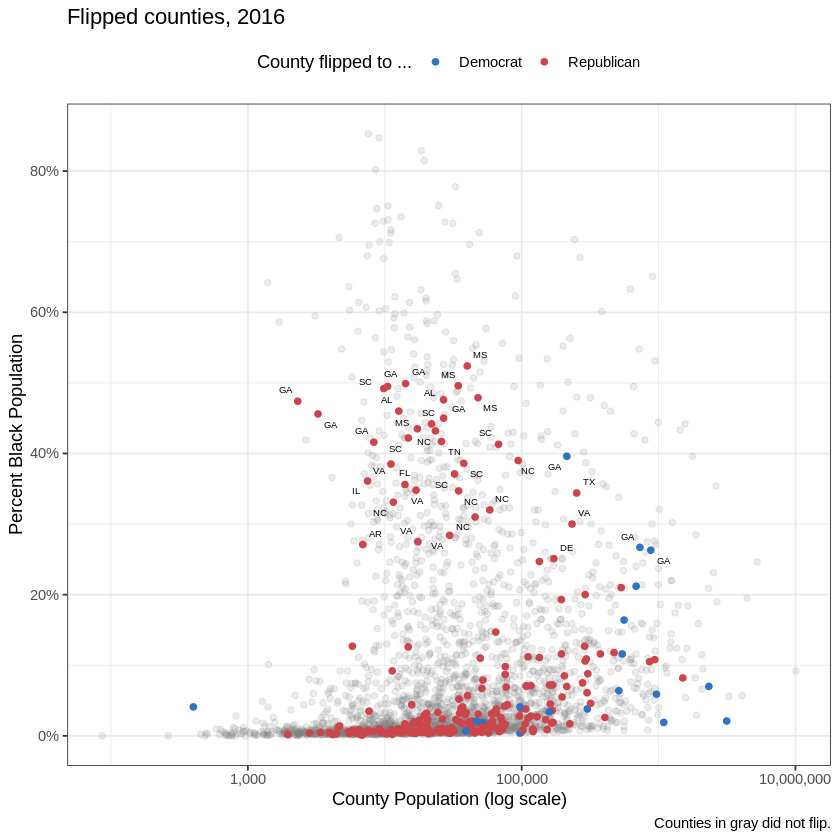

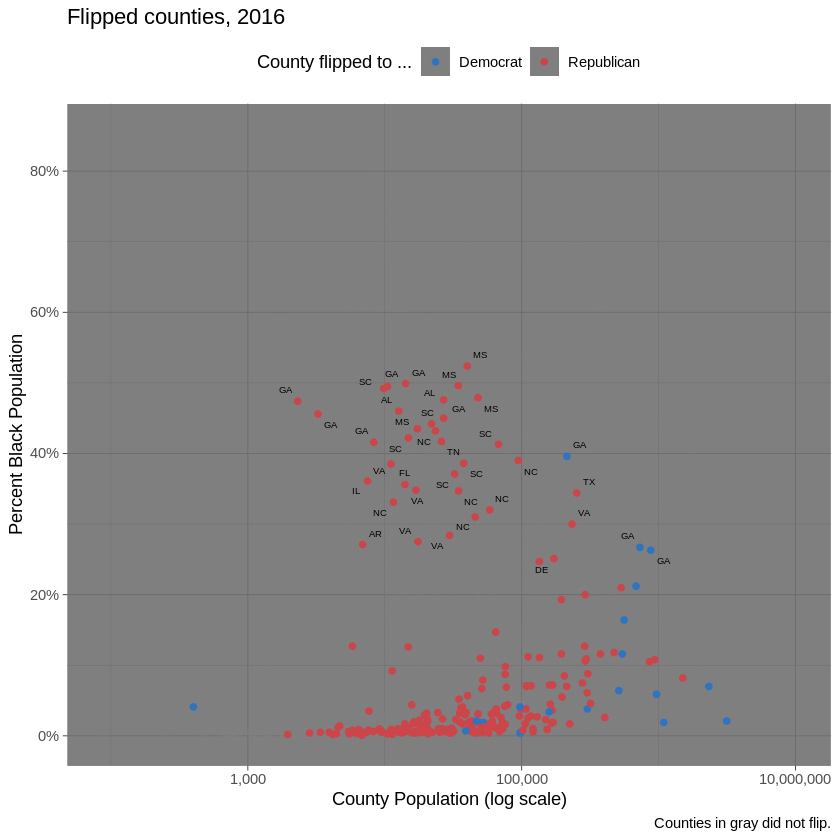

In [ ]:
theme_set(theme_bw())
p4 + theme(legend.position = "top")

theme_set(theme_dark())
p4 + theme(legend.position = "top")

In [ ]:
install.packages("ggthemes")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



ERROR while rich displaying an object: Error in default + theme: non-numeric argument to binary operator

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_text.default(obj)
8. paste(capture.

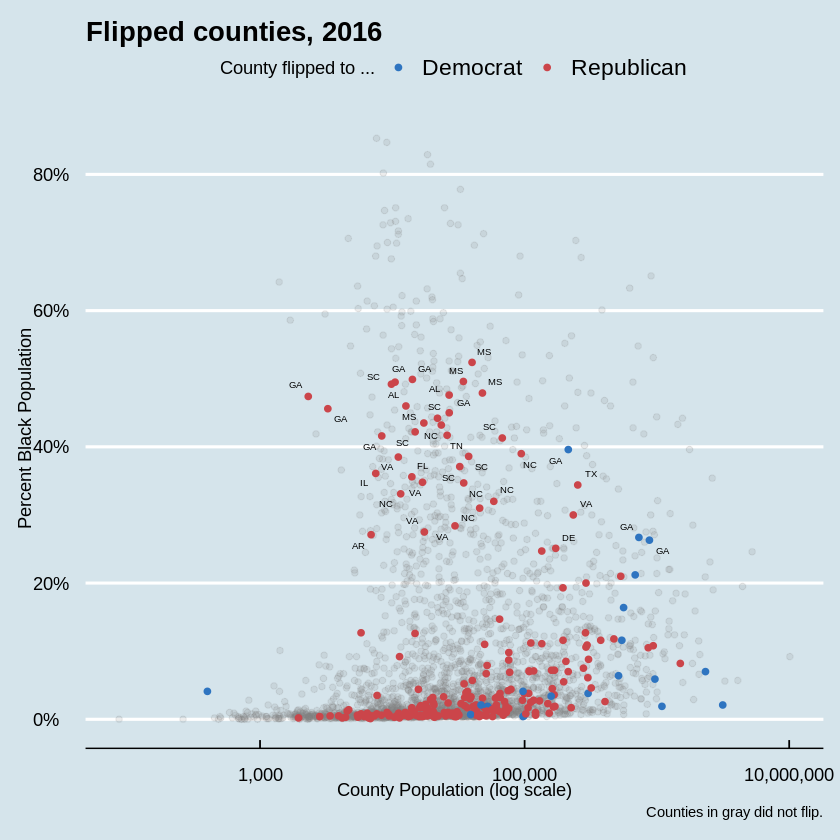

In [ ]:
library(ggthemes)

theme_set(theme_economist())
p4 + theme(legend.position = "top")

theme_set(theme_wsj)

p4 + theme(plot.title = element_text(size = rel(0.6)),
           legend.title = element_text(size = rel(0.35)),
           plot.caption = element_text(size = rel(0.35)),
           legend.position = "top")

In [ ]:
# Since the theme is already set before, the code below does not work.
p4 + theme(legend.position = "top",
           plot.title = element_text(size = rel(2),
                                     lineheight = .5,
                                     family = "Times",
                                     face = "bold.italic",
                                     colour = "orange"),
            axis.text.x = element_text(size = rel(1.1),
                                       family = "Courier",
                                       face = "bold",
                                       color = "purple"))

ERROR while rich displaying an object: Error in default + theme: non-numeric argument to binary operator

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler)
6. repr::mime2repr[[mime]](obj)
7. repr_text.default(obj)
8. paste(capture.

#8.4 Use Theme Elements in a Substantive Way

In [ ]:

yrs <- c(seq(1972, 1988, 4), 1993, seq(1996, 2016, 4))

mean_age <- gss_lon %>%
  filter(year %in% yrs) %>%
  group_by(year) %>%
  summarize(xbar = round(mean(age, na.rm = TRUE), 0))
mean_age$y <- 0.3

yr_labs <- data.frame(x = 85, y = 0.8,
                      year = yrs)

Don't know how to automatically pick scale for object of type <labelled>.
Defaulting to continuous.
Warning message:
“Removed 83 rows containing non-finite values (`stat_density()`).”


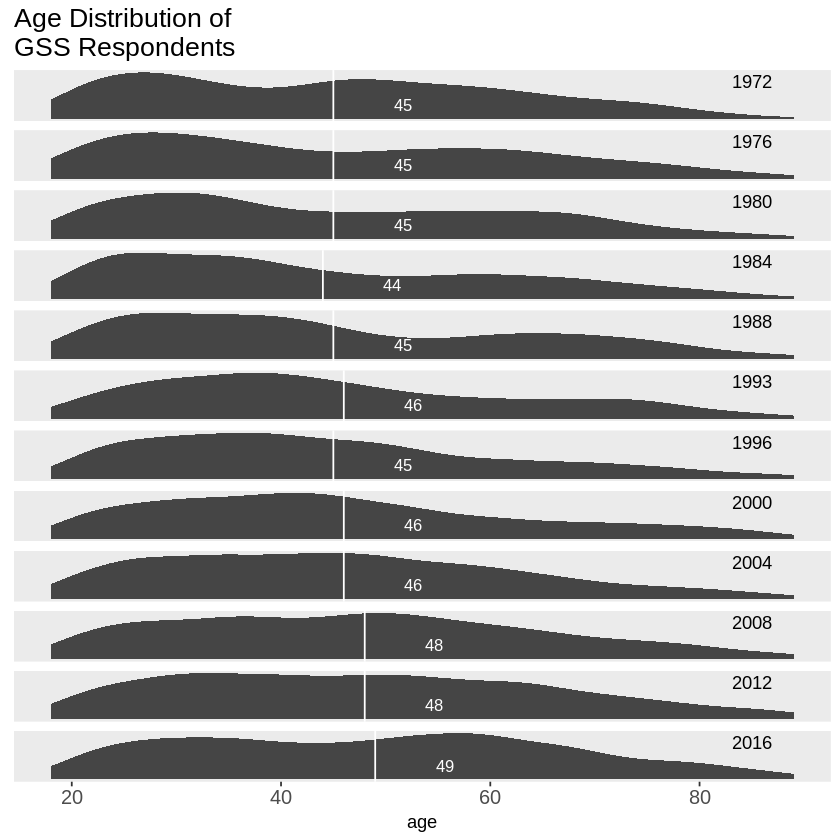

In [ ]:
library(socviz)
library(tidyverse)

p <- ggplot(data = subset(gss_lon, year %in% yrs),
            mapping = aes(x = age))

p1 <- p + geom_density(fill = "gray20", color = FALSE,
                       alpha = 0.9, mapping = aes(y = ..scaled..)) +
          geom_vline(data = subset(mean_age, year %in% yrs),
                     aes(xintercept = xbar), color = "white", linewidth = 0.5) +
          geom_text(data = subset(mean_age, year %in% yrs),
                    aes(x = xbar, y = y, label = xbar), nudge_x = 7.5,
                    color = "white", size = 3.5, hjust = 1) +
          geom_text(data = subset(yr_labs, year %in% yrs),
                    aes(x = x, y = y, label = year)) +
          facet_grid(year ~ ., switch = "y")
        
p1 + theme(plot.title = element_text(size = 16),
           axis.text.x = element_text(size = 12),
           axis.title.y = element_blank(),
           axis.text.y = element_blank(),
           axis.ticks.y = element_blank(),
           strip.background = element_blank(),
           strip.text.y = element_blank(),
           panel.grid.major = element_blank(),
           panel.grid.minor = element_blank()) + 
      labs(x = "age",
           y = NULL,
           title = "Age Distribution of \nGSS Respondents")

In [ ]:
install.packages('ggridges')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



Picking joint bandwidth of 3.49

Warning message:
“Removed 221 rows containing non-finite values (`stat_density_ridges()`).”


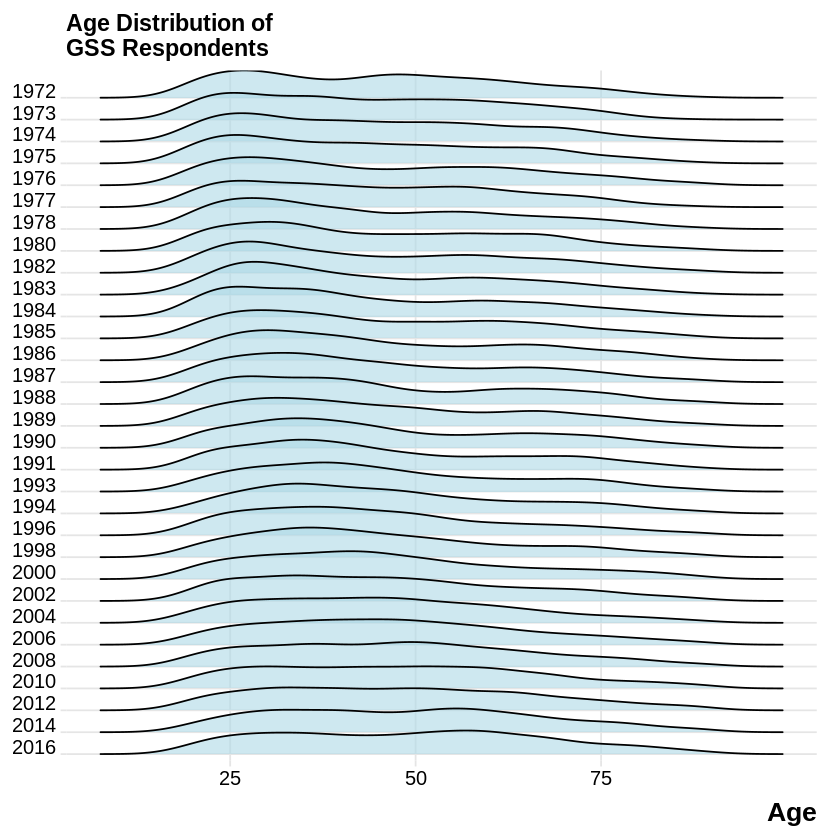

In [ ]:
library(ggridges)

p <- ggplot(data = gss_lon,
            mapping = aes(x = age, y = factor(year, levels = rev(unique(year)), 
                                   ordered = TRUE)))

p + geom_density_ridges(alpha = 0.6, fill = "lightblue", scale = 1.5) +
    scale_x_continuous(breaks = c(25, 50, 75)) +
    scale_y_discrete(expand = c(0.01, 0)) + 
    labs(x = "Age", y = NULL,
         title = "Age Distribution of \nGSS Respondents") +
    theme_ridges() +
    theme(title = element_text(size = 16, face = "bold"))

#8.5 Case Studies

In [ ]:
head(fredts)

,date,sp500,monbase,sp500_i,monbase_i
,<date>,<dbl>,<int>,<dbl>,<dbl>
1,2009-03-11,696.68,1542228,100.0000,100.0000
2,2009-03-18,766.73,1693133,110.0548,109.7849
3,2009-03-25,799.10,1693133,114.7012,109.7849
4,2009-04-01,809.06,1733017,116.1308,112.3710
5,2009-04-08,830.61,1733017,119.2240,112.3710
6,2009-04-15,852.21,1789878,122.3245,116.0579


In [ ]:
fredts_m <- fredts %>% select(date, sp500_i, monbase_i) %>% gather(key = series, 
      value = score, sp500_i:monbase_i)

head(fredts_m)

,date,series,score
,<date>,<chr>,<dbl>
1,2009-03-11,sp500_i,100.0000
2,2009-03-18,sp500_i,110.0548
3,2009-03-25,sp500_i,114.7012
4,2009-04-01,sp500_i,116.1308
5,2009-04-08,sp500_i,119.2240
6,2009-04-15,sp500_i,122.3245


In [ ]:
p <- ggplot(data = fredts_m,
            mapping = aes(x = date, y = score,
                          group = series,
                          color = series))

p1 <- p + geom_line() + theme(legend.position = "top") +
   labs(x = "Date",
        y = "Index",
        color = "Series")

p <- ggplot(data = fredts,
            mapping = aes(x = date, y = sp500_i - monbase_i))

p2 <- p + geom_line() + 
    labs(x = "Date",
         y = "Difference")

In [ ]:
install.packages('gridExtra')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
install.packages('cowplot')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.


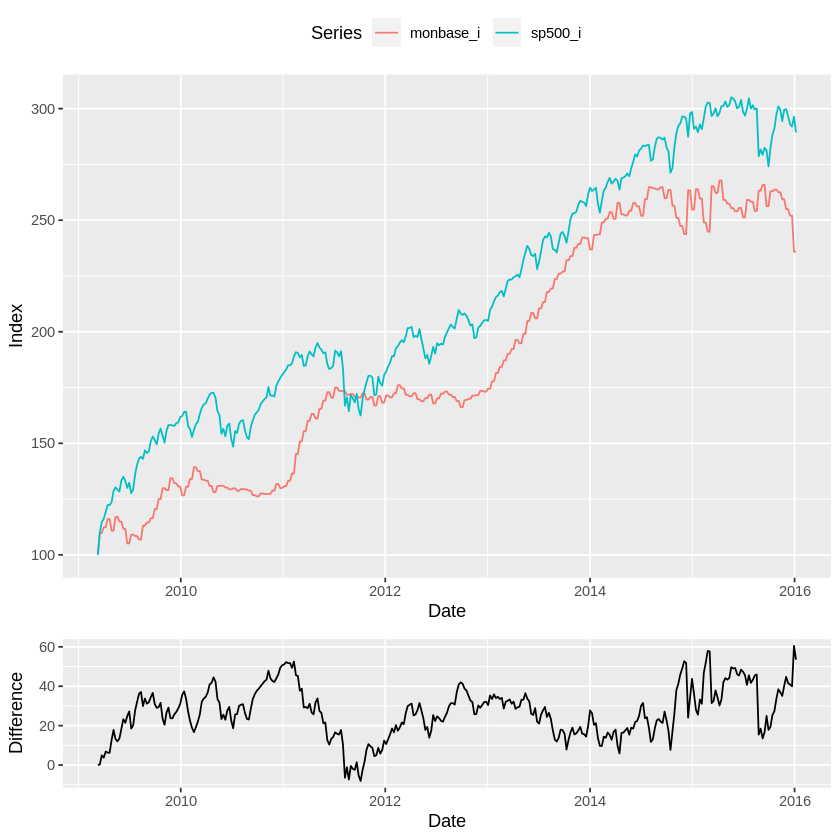

In [ ]:
cowplot::plot_grid(p1, p2, nrow = 2, rel_heights = c(0.75, 0.25),
    align = "v")

In [ ]:
head(yahoo)

Year,Revenue,Employees,Mayer
<dbl>,<dbl>,<dbl>,<chr>
2004,3574,7600,No
2005,5257,9800,No
2006,6425,11400,No
2007,6969,14300,No
2008,7208,13600,No
2009,6460,13900,No


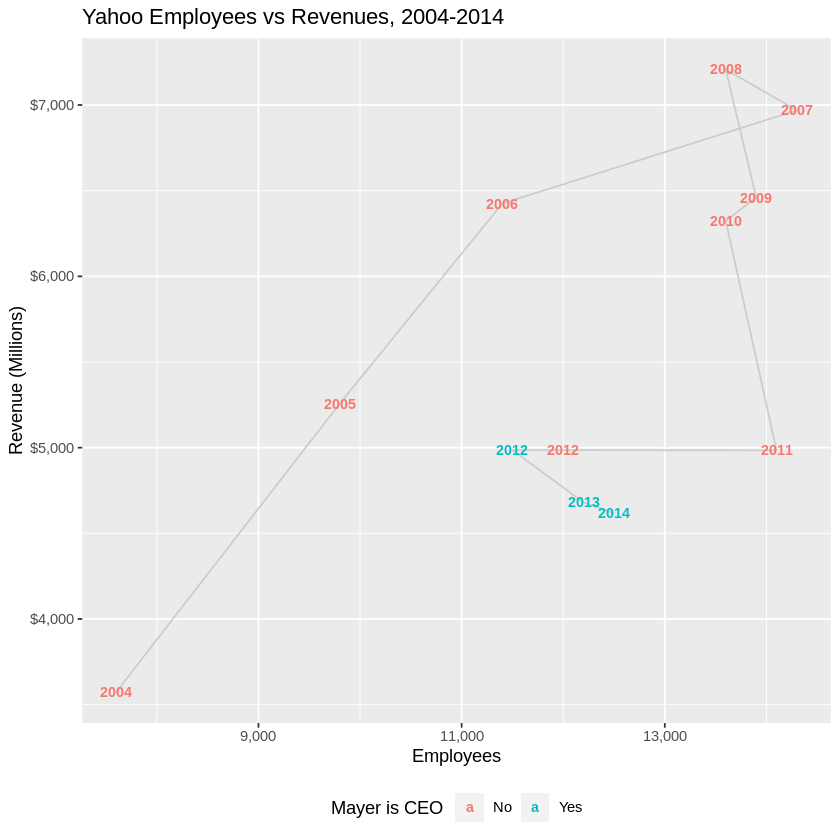

In [ ]:
p <- ggplot(data = yahoo,
            mapping = aes(x = Employees, y = Revenue))
p + geom_path(color = "gray80") + 
    geom_text(aes(color = Mayer, label = Year),
                  size = 3, fontface = "bold") + 
    theme(legend.position = "bottom") + 
    labs(color = "Mayer is CEO",
         x = "Employees", y = "Revenue (Millions)",
         title = "Yahoo Employees vs Revenues, 2004-2014") + 
    scale_y_continuous(labels = scales::dollar) +
    scale_x_continuous(labels = scales::comma)

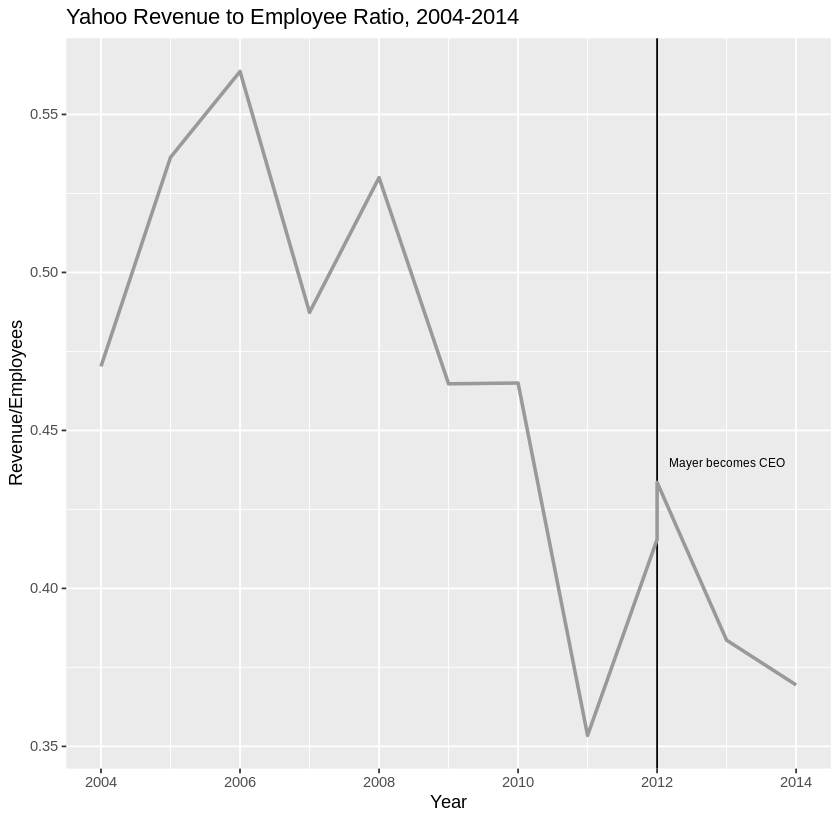

In [ ]:
p <- ggplot(data = yahoo, 
            mapping = aes(x = Year, y = Revenue/Employees))

p + geom_vline(xintercept = 2012) + 
    geom_line(color = "gray60", size = 1) + 
    annotate("text", x = 2013, y = 0.44,
             label = "Mayer becomes CEO", size = 2.5) +
    labs(x = "Year\n",
         y = "Revenue/Employees",
        title = "Yahoo Revenue to Employee Ratio, 2004-2014")

In [ ]:
head(studebt)

Debt,type,pct,Debtrc
<ord>,<fct>,<int>,<ord>
Under $5,Borrowers,20,Under $5
$5-$10,Borrowers,17,$5-$10
$10-$25,Borrowers,28,$10-$25
$25-$50,Borrowers,19,$25-$50
$50-$75,Borrowers,8,$50-$75
$75-$100,Borrowers,3,$75-$100


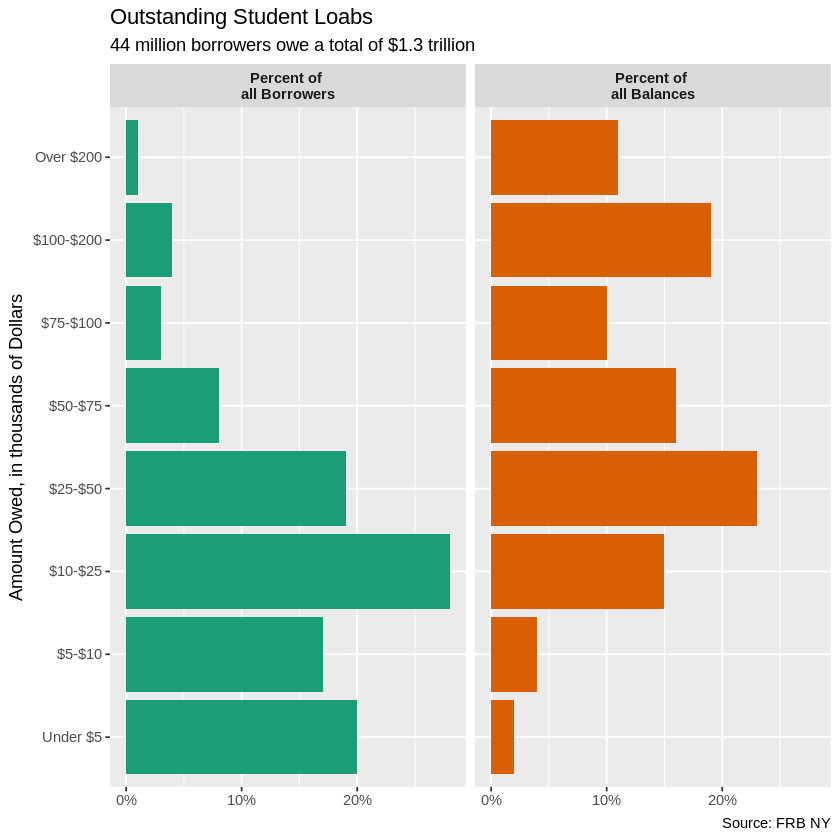

In [ ]:
p_xlab <- "Amount Owed, in thousands of Dollars"
p_title <- "Outstanding Student Loabs"
p_subtitle <- "44 million borrowers owe a total of $1.3 trillion"
p_caption <- "Source: FRB NY"

f_labs <- c('Borrowers' = "Percent of \nall Borrowers",
            'Balances' = "Percent of \nall Balances")

p <- ggplot(data = studebt,
            mapping = aes(x = Debt, y = pct/100, fill = type))

p + geom_bar(stat = 'identity') + 
    scale_fill_brewer(type = "qual", palette = "Dark2") +
    scale_y_continuous(labels = scales::percent) + 
    guides(fill = FALSE) + 
    theme(strip.text.x = element_text(face = "bold")) +
    labs(y = NULL, x = p_xlab,
         caption = p_caption,
         title = p_title,
         subtitle = p_subtitle) +
    facet_grid(~ type, labeller = as_labeller(f_labs)) + 
    coord_flip()

In [ ]:
install.packages("viridis")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



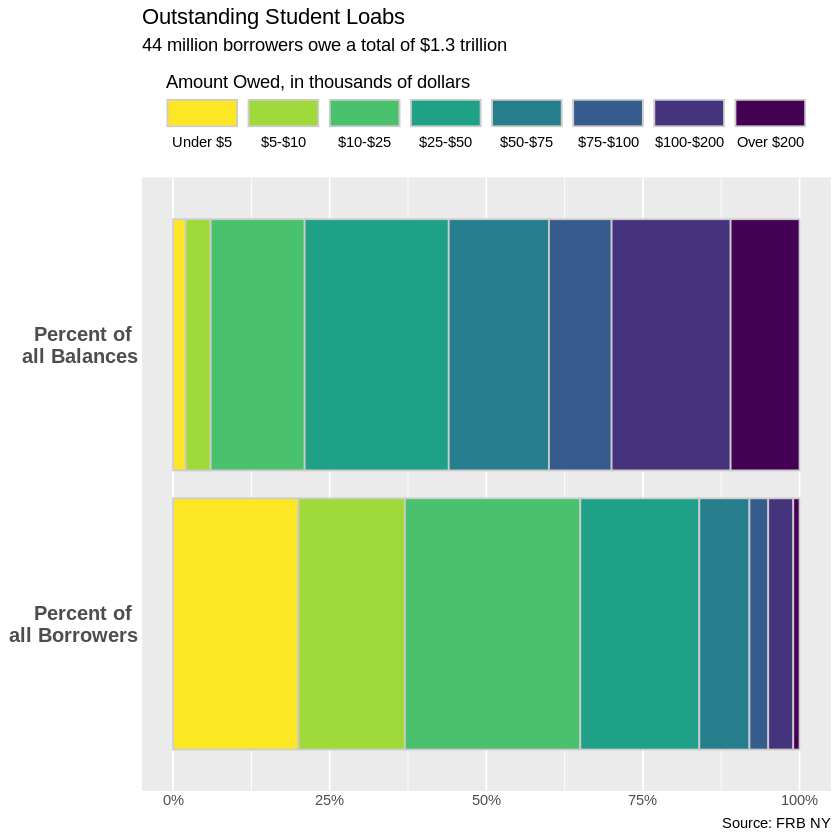

In [ ]:
library(viridis)

p <- ggplot(studebt, aes(y = pct/100, x = type, fill = Debtrc))
p + geom_bar(stat = "identity", color = "gray80") + 
  scale_x_discrete(labels = as_labeller(f_labs)) +
  scale_y_continuous(labels = scales::percent) +
  scale_fill_viridis(discrete = TRUE) +
  guides(fill = guide_legend(reverse = TRUE,
                             title.position = "top",
                             label.position = "bottom",
                             keywidth = 3,
                             nrow = 1)) +
  labs(x = NULL, y = NULL,
       fill = "Amount Owed, in thousands of dollars",
       caption = p_caption,
       title = p_title,
       subtitle = p_subtitle) +
  theme(legend.position = "top",
        axis.text.y = element_text(face = "bold", hjust = 1, size = 12),
        axis.ticks.length = unit(0, "cm"),
        panel.grid.major.y = element_blank()) + 
  coord_flip()